In [1]:
############# AT THE START, WE INSTALL PACKAGES WE NEED ###################################

# We use a package that might be new to some of you, called "INLA" 
# This package helps implement Bayesian methods and helps make some of our steps fast/easy to implement
# We will explain it as we go through this code 

############# OPEN R, THEN RUN THE FOLLOWING COMMAND ###################

# install.packages("INLA",repos=c(getOption("repos"),INLA="https://inla.r-inla-download.org/R/stable"), dep=TRUE)
# install.packages("fmesher", dependencies = TRUE)
# install.packages("MatrixModels", type = "source")
# install.packages("exactextractr")
# install.packages("sn" ,dependencies = TRUE)
# packages <- c("terra","dplyr","spdep", "exactextractr", "sf","ggplot2","viridis","sn","fmesher","exactextractr","fields")
# package.check <- lapply(packages, FUN = function(x) {
#     if (!require(x, character.only = TRUE)) {
#         install.packages(x, dependencies = TRUE)
#         library(x, character.only = TRUE, quietly=TRUE)
#     }
# })
# Sys.setenv("AWS_DEFAULT_REGION" = 'us-west-2')

# ##### THE FOLLOWING COMMANDS ARE FOR THE INSTALLATION OF PACKAGES ON NASA MAAP #####
# ##### CONDA-FORGE YOUR WAY THROUGH PACKAGES THAT DID NOT INSTALL ##########

# conda install conda-forge::r-fmesher
# conda install conda-forge::r-exactextractr
# conda install conda-forge::r-sn
# conda install conda-forge::r-inlabru
# conda install conda-forge::r-fields

In [1]:
############## LOAD PACKAGES ###########

library("fmesher")
library(MatrixModels)
library(Matrix)
library(INLA)
library(inlabru)
library("jpeg")

library(sf)
library(terra)
library(dplyr)
library(spdep)
library(raster)
library(exactextractr)

library(ggplot2)
library(viridis)
library(sn)

Warning message:
“package ‘INLA’ was built under R version 4.4.0”
Loading required package: sp

This is INLA_24.05.10 built 2024-05-10 19:59:04 UTC.
 - See www.r-inla.org/contact-us for how to get help.
 - List available models/likelihoods/etc with inla.list.models()
 - Use inla.doc(<NAME>) to access documentation

Linking to GEOS 3.12.0, GDAL 3.7.2, PROJ 9.3.0; sf_use_s2() is TRUE

terra 1.7.55


Attaching package: ‘dplyr’


The following objects are masked from ‘package:terra’:

    intersect, union


The following objects are masked from ‘package:stats’:

    filter, lag


The following objects are masked from ‘package:base’:

    intersect, setdiff, setequal, union


Loading required package: spData

To access larger datasets in this package, install the spDataLarge
package with: `install.packages('spDataLarge',
repos='https://nowosad.github.io/drat/', type='source')`


Attaching package: ‘raster’


The following object is masked from ‘package:dplyr’:

    select


Loading required

This notebook shows how to integrate Mexican NFI-estimated AGBD (3rd cycle), ESA CCI Biomass AGBD (see https://climate.esa.int/en/projects/biomass/) and GEDI Forest Height estimates (see https://glad.umd.edu/dataset/gedi). 

It is based on the FAIR (findable, accessible, interoperable, and replicable) Data Principles (Wilkinson et al., 2016), and relies on the computational power of the INLA Package in R (https://www.r-inla.org/).  

Practical applications are demonstrated at the end of this notebook. They include using our models for gap-filling Mexico's NFI, and estimation of mean AGBD (with associated uncertainty) in their forest/administrative strata. 

We have also created two psuedo areas where diturbance will occur in the future. At the end of this notebook, we will predict AGBD in these areas before disturbance using all of the above data!

-------------------------------------------------------------------------------------------------------------------------------------------------------


################################# Model-assisted vs model-based #################################

The approach presented in this notebook is a Geostatistical Model-Based (GMB) approach. 

As noted from McRoberts et at (2022): With model-based inference each population unit is assumed to have an entire distribution of possible values as opposed to design-based inference, for which each population unit is assumed to have one and only one possible value. Standard model-based terminology specifies use of the verb “to predict” when referring to random variables and “to estimate” when referring to fixed value parameters. Model-based inferences do not require probability samples, although they can be used, and in many instances may be preferable.

Bayesian inference is used in our approach, whereby we approximate the distribution of our model parameters and predict AGBD at any given location. 

-------------------------------------------------------------------------------------------------------------------------------------------------------

################################# Geostatistical Model-based Estimation #########################

Our target variable (AGBD) at any given location (s) is assumed to follow the following linear model

\begin{align}
y(s) = \alpha + \beta.x(s) + \epsilon(s)
\end{align}

Where y(s) is the estimated AGBD at location s, and x(s) is a covariate (e.g. CCI Biomass map). Further, $\epsilon(s)$ is the random error. This should be straightforward to solve. However, the errors of $\alpha$ and $\beta$ could be spatially varying across the extent of Mexico, and hence may not be "fixed". To deal with this, we add a spatially-varying term to $\alpha$ and $\beta$ that will capture this variance.  

\begin{align}
y(s) = (\alpha + \tilde{\alpha}(s)) + (\beta + \tilde{\beta}(s)).x(s) + \epsilon(s)
\end{align}

Further, if you wanted to add another covariate (e.g. the CCI as well as a map of GEDI height estimates) to predict AGBD, the model will look like

\begin{align}
y(s) = (\alpha + \tilde{\alpha}(s)) + (\beta + \tilde{\beta}(s)).x1(s) + (\eta + \tilde{\eta}(s)).x2(s) + \epsilon(s) 
\end{align}

Most of the values should be familiar. $\alpha$, $\beta$ and $\eta$ are constant regression parameters. x1 and x2 are our covariates (here, the CCI map and the GEDI height map). $\alpha$, $\beta$ and $\eta$ have associated errors $\tilde{\alpha}$, $\tilde{\beta}$ and $\tilde{\eta}$ that are spatially autocorrelated. These errors capture the spatially-varying component of $\alpha$, $\beta$ and $\eta$. If you solve this equation at every location s, you will have accounted for the spatial dependence among residuals of the model. In a Bayesian hierarchical framework, it is possible to estimate the spatial covariance parameters and, hence, propagate their uncertainties through to the prediction of the outcome variable (Babcock et al. 2015). 

A caveat, however, is that solving the above model is natively is computationally expensive when the number of observations becomes large. We can circumvent this by splitting Mexico up into (very) small regions. This is done by the use of a mesh, and approximating the model outputs for each node/vertex of the mesh. So, we first define an underlying "mesh", which draws a graph of triangles across the study area. On the vertices of triangles, we define a neighbor-based spatial model where two vertices are neighbors if there is a triangle edge connecting them. To extend this to continuous locations, the value of $\tilde{\alpha}$, $\tilde{\beta}$ and $\tilde{\eta}$ at any location (s) lying within a triangle is linearly interpolated from the 3 vertices of the containing triangle. The reason why this is more computationally effecient is that the process on the vertices is sparse, i.e. for any given vertex, it only needs the information from the connected vertices. This will become clearer as we go through the code. 

In [15]:
######################### LOAD THE OUTLINE OF MEXICO AND ADMIN BOUNDARIES #############
options(repr.plot.width=10, repr.plot.height=10)

mexico = st_read("/projects/my-public-bucket/Data/NASA_CMS_2023/MEXICO/ecort08gw_DESECON1_DISS.gpkg", quiet = TRUE) %>% st_union() %>% st_transform(crs = 6933) # Provided by CONAFOR and converted to a projected CRS so we can work in units of meters
Deforestation = st_read("/projects/my-public-bucket/Data/NASA_CMS_2023/MEXICO/MEX_deforestation.gpkg", quiet = TRUE) %>% st_transform(crs = 6933)  # Regions of deforestation.  

Coordinate system already present. Adding new coordinate system, which will
replace the existing one.


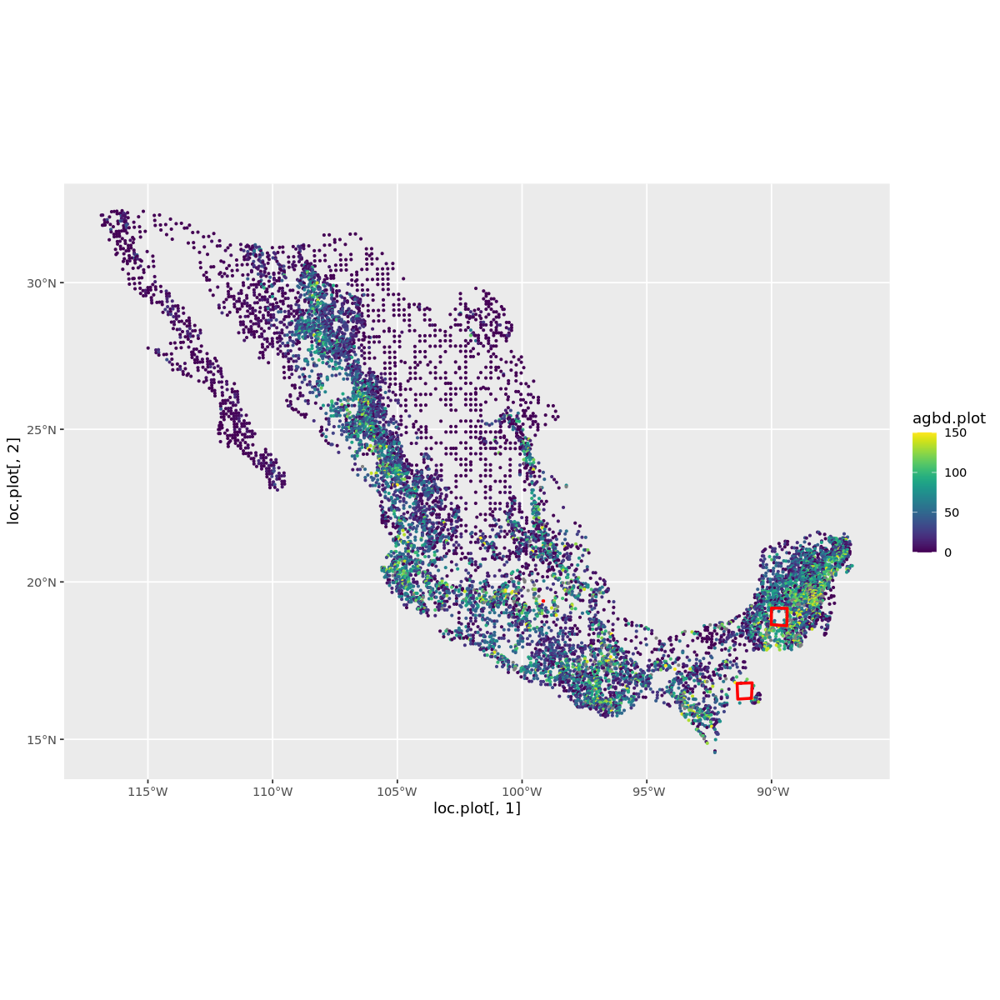

In [17]:
# ########################## READ THE MEXICAN NFI DATA ###################################
plot_WGS84 <- st_read("/projects/my-public-bucket/Data/NASA_CMS_2023/MEXICO/Daso_A_Cgl_C3_V7_24052022_1.gpkg", quiet = TRUE)

# Sample 90% of the data randomly for training and 10% for testing
dt = sort(sample(nrow(plot_WGS84), nrow(plot_WGS84)*.9))
plot_WGS84 <- plot_WGS84[dt,]
# st_write(plot_WGS84, dsn = "/projects/my-public-bucket/Data/NASA_CMS_2023/MEXICO/TRAINING.gpkg", layer = "plot_WGS84", driver = "GPKG")
plot_WGS84_T <- plot_WGS84[-dt,]
# st_write(plot_WGS84_T, dsn = "/projects/my-public-bucket/Data/NASA_CMS_2023/MEXICO/TESTING.gpkg", layer = "plot_WGS84_T", driver = "GPKG")

loc.plot.WGS84 <- st_coordinates(plot_WGS84)  ### get the plot locations in WGS84
plot = plot_WGS84 %>% st_transform("epsg:6933") ### convert them to a projected CRS
agbd.plot = plot$AGB_C3 ### get the AGBD estimate at each plot location
loc.plot = st_coordinates(plot) ### save the plot location xy coordinates in projected CRS
n.plot = nrow(loc.plot) ### check the number of plots
ggplot() + coord_sf(crs = 6933) + 
           geom_point(aes(x = loc.plot[,1], y = loc.plot[,2], col = agbd.plot),size=0.5) +  # make a map to see plot locations and the AGBD values at each location
           scale_color_viridis(limits = c(0, 150)) + 
           geom_sf(data = Deforestation,col="red",fill=NA,lwd=1)# add our fake deforestation sites

Cannot preload entire working area of 9385516650 cells with max_cells_in_memory = 3e+07. Raster values will be read for each feature individually.



  |======================================================================| 100%


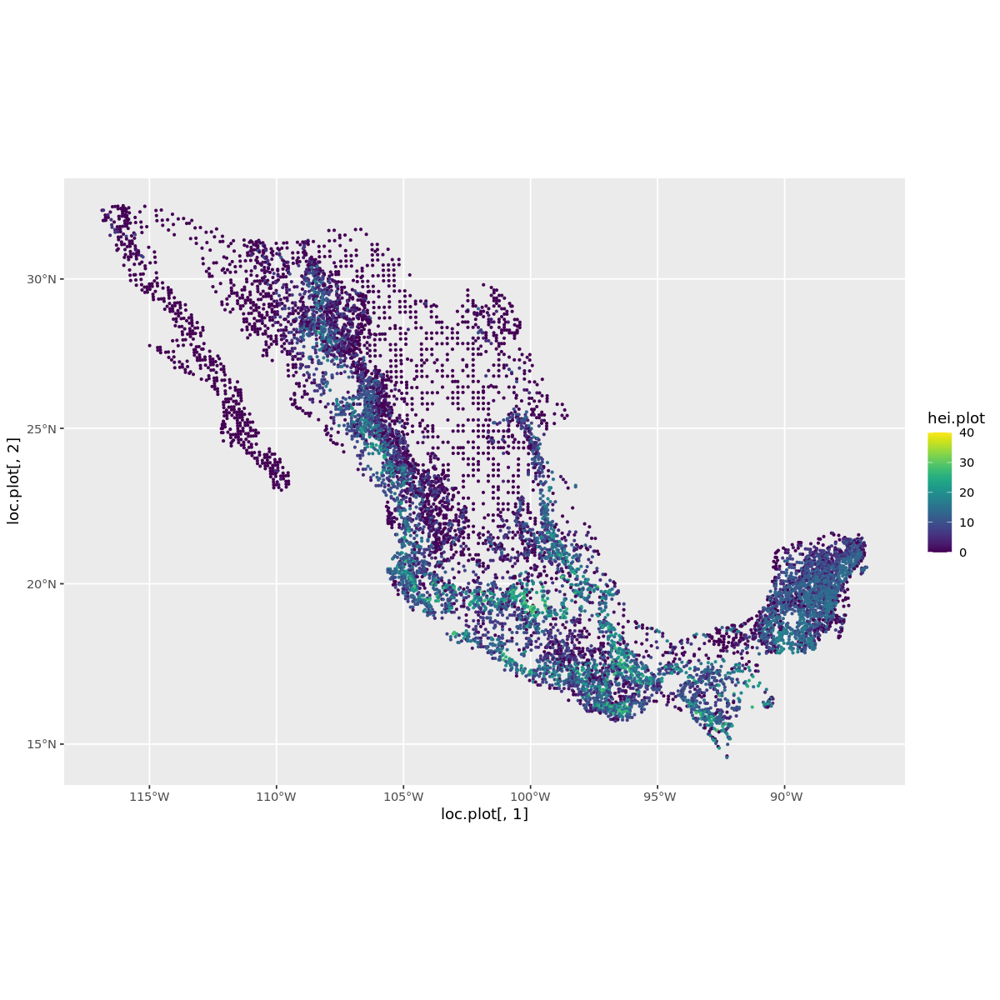

In [18]:
####################### LOAD THE GLAD FOREST HEIGHTS MAP #######################
hei.rast=rast("/projects/my-public-bucket/Data/NASA_CMS_2023/MEXICO/GLAD_FH_mexico_UINT16_C_6399.tif")### Read GLAD FOREST HEIGHT raster, already in projected CRS
hei.plot = exactextractr::exact_extract(hei.rast, st_buffer(plot,56.42), 'mean')
ggplot() + coord_sf(crs = 6933) + geom_point(aes(x = loc.plot[,1], y = loc.plot[,2], col = hei.plot),size=0.5) + scale_color_viridis(limits = c(0, 40)) # make a map to see plot locations and the CCI AGBD values at each location

# ####################### LOAD THE GRIDDED GEDI RH98 METRICS #####################
# hei.gedi=rast("/projects/my-public-bucket/Data/NASA_CMS_2023/MEXICO/GEDI_RH98_Mexico_30m.tif")
# hei.plot.gedi = exactextractr::exact_extract(hei.gedi, st_buffer(plot,56.42), 'mean')
# ggplot() + coord_sf(crs = 6933) + geom_point(aes(x = loc.plot[,1], y = loc.plot[,2], col = hei.plot.gedi),size=0.5) + scale_color_viridis(limits = c(0, 40)) # make a map to see plot locations and the CCI AGBD values at each location
# length(hei.plot.gedi[is.na(hei.plot.gedi)])
# length(hei.plot.gedi[!is.na(hei.plot.gedi)])
# hei.plot.gedi[is.na(hei.plot.gedi)] = hei.plot[is.na(hei.plot.gedi)]
# hei.plot = hei.plot.gedi

Cannot preload entire working area of 742422165 cells with max_cells_in_memory = 3e+07. Raster values will be read for each feature individually.



  |======================================================================| 100%


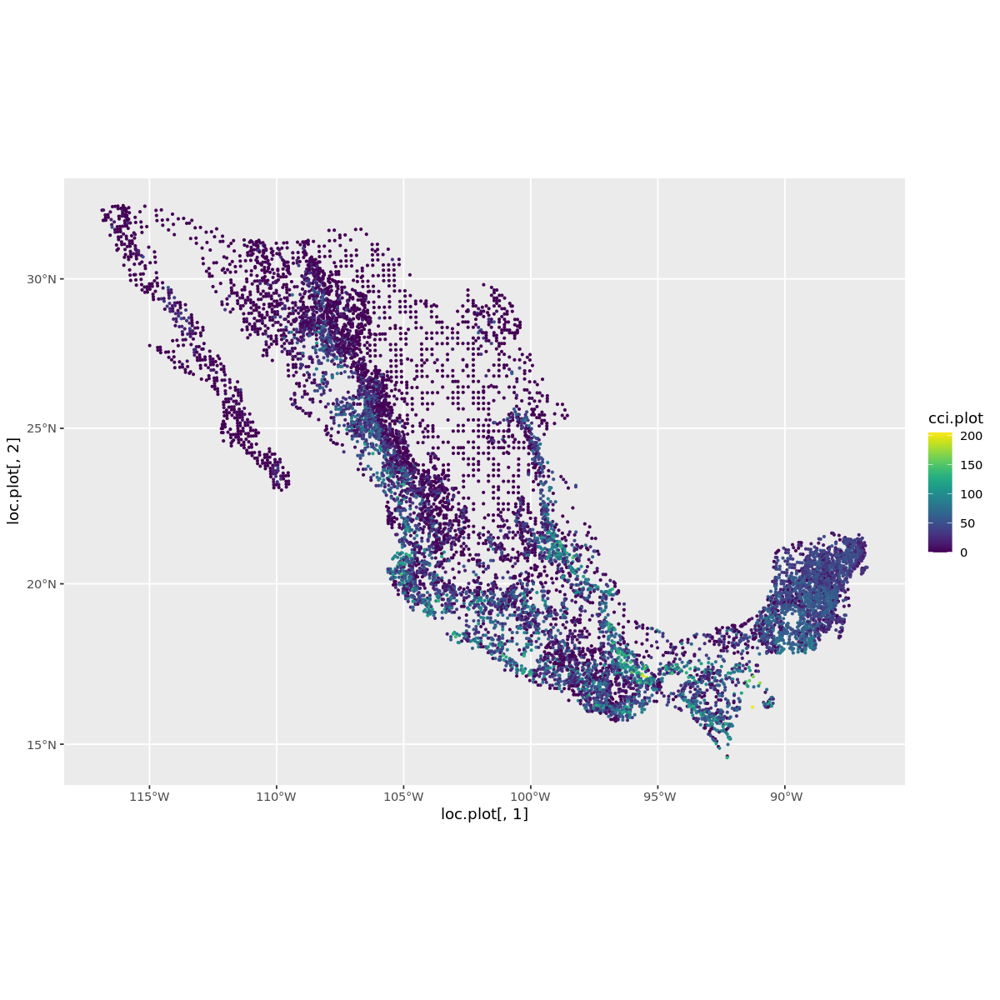

In [19]:
####################### LOAD THE CCI BIOMASS MAP #######################
cci.rast=rast("/projects/my-public-bucket/Data/NASA_CMS_2023/MEXICO/cci_mexico_6933.tif") ### Read CCI raster, already in projected CRS
# cci.plot = terra::extract(cci.rast, st_buffer(plot,56.42)) ### Extract CCI pixel-level AGBD values at each NFI plot location + 56.42 buffer
# cci.plot = aggregate(x = cci.plot$cci_mexico, by = list(cci.plot$ID), FUN = mean, na.rm=TRUE)[,2] ### Average pixel values per plot
# ggplot() + coord_sf(crs = 6933) + geom_point(aes(x = loc.plot[,1], y = loc.plot[,2], col = cci.plot),size=0.5) + scale_color_viridis() # make a map to see plot locations and the CCI AGBD values at each location

# In case the weighted-average of pixels under the plot of radius 56.4 m is required, please use the lines below 
cci.plot = exactextractr::exact_extract(cci.rast, st_buffer(plot,56.42), 'mean')
ggplot() + coord_sf(crs = 6933) + geom_point(aes(x = loc.plot[,1], y = loc.plot[,2], col = cci.plot),size=0.5) + scale_color_viridis() # make a map to see plot locations and the CCI AGBD values at each location

DATA <- cbind(loc.plot[,1],loc.plot[,2],cci.plot,hei.plot,agbd.plot) # Create a dataframe with all the data
write.csv(DATA,"/projects/my-public-bucket/Data/NASA_CMS_2023/MEXICO/NFI_CCI_GEDIheights.csv",row.names=FALSE) #Save the data

Saving 6.67 x 6.67 in image


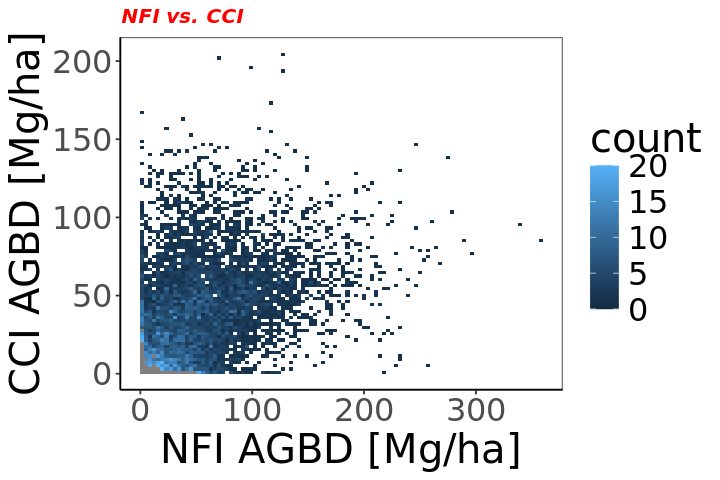

Saving 6.67 x 6.67 in image


[1] 0.5248506

[1] 0.7011298

[1] 1969.095

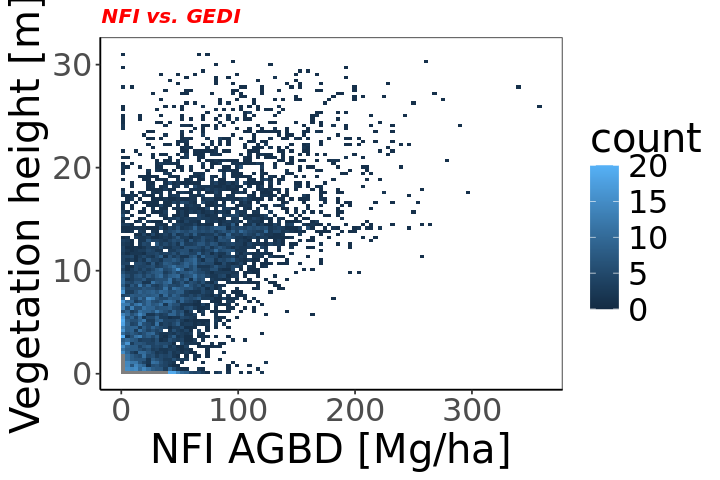

Saving 6.67 x 6.67 in image


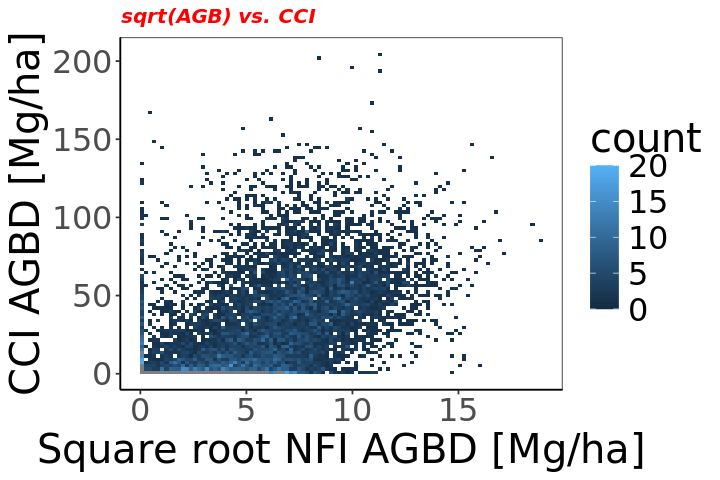

Saving 6.67 x 6.67 in image


[1] 0.5576309

[1] 0.7205566

[1] 13.39477

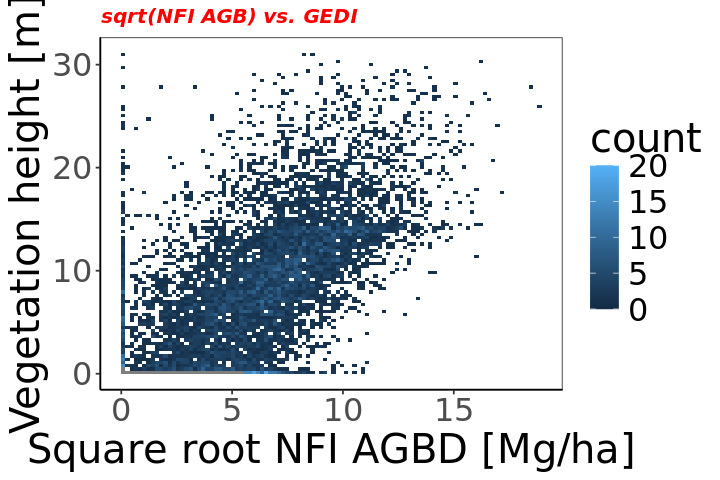

In [20]:
############# RELATION BETWEEN CCI, HEIGHTS AND NFI AT THE PLOT LEVEL ########################
options(repr.plot.width=3, repr.plot.height=3)

## Now we have NFI plot locations, NFI AGBD estimates, and the cooresponding CCI pixel value and forest height estimate at each location
## Let's see what the relations between them look like 

DATA <- read.csv("/projects/my-public-bucket/Data/NASA_CMS_2023/MEXICO/NFI_CCI_GEDIheights.csv") #Read the saved data
cci.plot <- DATA$cci.plot
hei.plot <- DATA$hei.plot
loc.plot <- data.frame(matrix(ncol = 2, nrow = length(hei.plot))) # Just create empty list to populated with saved NFI xy locations
loc.plot[,1] <- DATA$X
loc.plot[,2] <- DATA$X.1
agbd.plot <- (DATA$agbd.plot) 

options(repr.plot.width=6, repr.plot.height=4)

ggplot(data=DATA, aes(x=agbd.plot, y=cci.plot) ) +
  geom_bin2d(bins = 100) +
  scale_fill_gradient(limits = c(0, 20)) + xlab("NFI AGBD [Mg/ha]") + ylab("CCI AGBD [Mg/ha]") + ggtitle("NFI vs. CCI") +
  theme_bw() + theme(text = element_text(size = 24),plot.title = element_text(color="red", size=12, face="bold.italic"),panel.grid.major = element_blank(), panel.grid.minor = element_blank(),panel.background = element_blank(), axis.line = element_line(colour = "black"))
ggsave("/projects/my-public-bucket/Data/NASA_CMS_2023/MEXICO/CCI_NFI.png",plot = last_plot(),scale = 1,dpi = 400)

ggplot(data=DATA, aes(x=agbd.plot, y=hei.plot) ) +
  geom_bin2d(bins = 100) +
  scale_fill_gradient(limits = c(0, 20)) + xlab("NFI AGBD [Mg/ha]") + ylab("Vegetation height [m]") + ggtitle("NFI vs. GEDI") +
  theme_bw() + theme(text = element_text(size = 24),plot.title = element_text(color="red", size=12, face="bold.italic"),panel.grid.major = element_blank(), panel.grid.minor = element_blank(),panel.background = element_blank(), axis.line = element_line(colour = "black"))
ggsave("/projects/my-public-bucket/Data/NASA_CMS_2023/MEXICO/GEDI_NFI.png",plot = last_plot(),scale = 1,dpi = 400)

cor(DATA$agbd.plot, cci.plot, method = c("pearson"))
cor(DATA$agbd.plot, hei.plot, method = c("pearson"))
var(DATA$agbd.plot)
# The plots show rather poor relations, so let's transform NFI AGBD and try again 

# ############## TRANSFORMATION FOR POOR RESIDUALS ############## 
# Next, we check if square-rooting the NFI-estimated AGBD appears to indicate a better relationship 

DATA$agbd.plot = sqrt(DATA$agbd.plot)

ggplot(data=DATA, aes(x=agbd.plot, y=cci.plot) ) +
  geom_bin2d(bins = 100) +
  scale_fill_gradient(limits = c(0, 20)) + xlab("Square root NFI AGBD [Mg/ha]") + ylab("CCI AGBD [Mg/ha]") + ggtitle("sqrt(AGB) vs. CCI") +
  theme_bw() + theme(text = element_text(size = 24),plot.title = element_text(color="red", size=12, face="bold.italic"),panel.grid.major = element_blank(), panel.grid.minor = element_blank(),panel.background = element_blank(), axis.line = element_line(colour = "black"))
ggsave("/projects/my-public-bucket/Data/NASA_CMS_2023/MEXICO/CCI_sqrtNFI.png",plot = last_plot(),scale = 1,dpi = 400)

ggplot(data=DATA, aes(x=agbd.plot, y=hei.plot) ) +
  geom_bin2d(bins = 100) +
  scale_fill_gradient(limits = c(0, 20)) + xlab("Square root NFI AGBD [Mg/ha]") + ylab("Vegetation height [m]") + ggtitle("sqrt(NFI AGB) vs. GEDI") +
  theme_bw() + theme(text = element_text(size = 24),plot.title = element_text(color="red", size=12, face="bold.italic"),panel.grid.major = element_blank(), panel.grid.minor = element_blank(),panel.background = element_blank(), axis.line = element_line(colour = "black"))
ggsave("/projects/my-public-bucket/Data/NASA_CMS_2023/MEXICO/GEDI_sqrtNFI.png",plot = last_plot(),scale = 1,dpi = 400)

cor(DATA$agbd.plot, cci.plot, method = c("pearson"))
cor(DATA$agbd.plot, hei.plot, method = c("pearson"))
var(DATA$agbd.plot)
## These are perhaps better? We could experiment more, but let's see how we do with sq-root transformation only

In [21]:
############### INTRODUCTING BAYESIAN MODELLING IN R #####################################

### In this cell, we want to get familiar with the Package INLA. To do so, we do a simple demonstration, comparing INLA outputs to 
### fitting a linear regression in R. INLA is a package that makes Bayesian inference easier, it can fit Bayesian models very fast!
### For those familiar with Bayesian statistics, a gentle introduction to INLA is available: https://www.precision-analytics.ca/articles/a-gentle-inla-tutorial/
### In this cell, we fit a linear model the usual way, and then the INLA way, and compare results. 

### All should be well familiar with fitting linear regressions in R. If we took our NFI AGBD, CCI AGBD, and Heights estimates, we would fit a model like this:

DATA <- read.csv("/projects/my-public-bucket/Data/NASA_CMS_2023/MEXICO/NFI_CCI_GEDIheights.csv")
agbd.plot <- sqrt(DATA$agbd.plot)
DATA$agbd.plot <- sqrt(DATA$agbd.plot)

LM_model <- (lm((agbd.plot)~(cci.plot)+(hei.plot), na.action=na.omit))
summary(LM_model)
print("--------GREAT, I'VE SOLVED A LINEAR REGRESSION MODEL ABOVE -----------")

### However, in our case, we want to capture the model parameters (alpha, beta and eta) and view their distribution, i.e. we want the Bayesian model output
### In other words, we want to see what are their posterior distributions (min, max, 25th, 50th and 75th percentile) when modelled as Guassian Processes
### See the example below, which uses the INLA package to do so 

formula = (agbd.plot)~(cci.plot)+(hei.plot)
INLA_model <- inla(formula, data=DATA, family="gaussian",control.compute=list(config = T, dic = T, waic = T, cpo=TRUE)) #option cpo is a leave-one-out cross validation
# summary(INLA_model)
print("--------GREAT, I'VE SOLVED THE REGRESSION MODEL ABOVE USING PACKAGE INLA ---")

#### Let's do a quick comparison, just to see how our outputs compare 
output <- cbind(summary(LM_model)$coef[,1:2],INLA_model$summary.fixed[,1:5]) # Looking great! 
colnames(output) <- c("lm():Mean","lm():SE","inla():Mean","inla():SD","inla():0.025quant","inla():0.5quant","inla():0.975quant")
output # Looking great! 

#### The first 2 columns give you the same estimates if you had done just a linear regression in R as usual
#### The last 6 columns give you the INLA estimates of the model parameters
### Notice the similarities! LM gives you mean and SE, and INLA gives you the mean, SD and all quantiles
### Here is also a nice tutorial that can help understand the differences between INLA and a usualy linear regression in R: https://julianfaraway.github.io/brinla/examples/chicago.html
### And one more tutorial if that wasn't enough: https://www.paulamoraga.com/book-geospatial/sec-inla.html


Call:
lm(formula = (agbd.plot) ~ (cci.plot) + (hei.plot), na.action = na.omit)

Residuals:
     Min       1Q   Median       3Q      Max 
-14.4357  -1.9448  -0.0021   1.7957   9.0596 

Coefficients:
            Estimate Std. Error t value Pr(>|t|)    
(Intercept) 2.464699   0.037862  65.096  < 2e-16 ***
cci.plot    0.004808   0.001229   3.914 9.15e-05 ***
hei.plot    0.368294   0.005621  65.518  < 2e-16 ***
---
Signif. codes:  0 ‘***’ 0.001 ‘**’ 0.01 ‘*’ 0.05 ‘.’ 0.1 ‘ ’ 1

Residual standard error: 2.536 on 9860 degrees of freedom
Multiple R-squared:  0.5199,	Adjusted R-squared:  0.5199 
F-statistic:  5340 on 2 and 9860 DF,  p-value: < 2.2e-16


[1] "--------GREAT, I'VE SOLVED A LINEAR REGRESSION MODEL ABOVE -----------"
[1] "--------GREAT, I'VE SOLVED THE REGRESSION MODEL ABOVE USING PACKAGE INLA ---"


,lm():Mean,lm():SE,inla():Mean,inla():SD,inla():0.025quant,inla():0.5quant,inla():0.975quant
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
(Intercept),2.464698586,0.037862428,2.464698615,0.037862060,2.390453293,2.464698615,2.538943936
cci.plot,0.004808152,0.001228523,0.004808154,0.001228511,0.002399115,0.004808154,0.007217194
hei.plot,0.368294099,0.005621243,0.368294088,0.005621188,0.357271262,0.368294088,0.379316913


## BUILDING THE GEOSPATIAL MODEL WE DEFINED FOR MEXICO ###########

Since we are now familiar with INLA, let's try to solve our model: 

\begin{align}
y(s) = (\alpha + \tilde{\alpha}(s)) + (\beta + \tilde{\beta}(s)).x1(s) + (\eta + \tilde{\eta}(s)).x2(s) + \epsilon(s)
\end{align}

Solving this model is computationally expensive. Instead, an approximation of the solutions can be constructed, typically based upon discretizations of space, i.e. breaking Mexico up by a mesh. The solutions then, in turn, are an approximation of the true solution. This method of discretization is called a finite element method (FEM), very commonly used in physics and engineering.

The steps followed below are first explained in words: 

(1) We start with building a mesh over Mexico. These are our finite elements. 

(2) We then define a spatial model for each spatially-varying parameter ($\tilde{\alpha}(s)$, $\tilde{\beta}(s)$ and $\tilde{\eta}(s)$), and we ask INLA to solve it!

Once INLA has done its job, we can check our model residuals and make predictions at our hold-out 10% of NFI plot locations. 

Also, we can get values of $(\alpha + \tilde{\alpha}(s))$, $(\beta + \tilde{\beta}(s))$ and $(\eta + \tilde{\eta}(s))$ for any location we want! 

Since we will have the model's fixed parameters and their spatially-varying components, we can get predicted AGBD at any location we want. 
This means, we can find a patch of newly deforested land, and predict what baseline AGBD would have been there (for example). 
We can also predict AGBD and compare it to CONAFOR's 1 km gridded map. 

Coordinate system already present. Adding new coordinate system, which will
replace the existing one.
Warning message:
“Removed 71979 rows containing missing values or values outside the scale range
(`geom_segment()`).”
Warning message:
“Removed 290 rows containing missing values or values outside the scale range
(`geom_segment()`).”
Warning message:
“Removed 792 rows containing missing values or values outside the scale range
(`geom_segment()`).”
Warning message:
“Removed 1 row containing missing values or values outside the scale range
(`geom_segment()`).”
Warning message:
“Removed 974 rows containing missing values or values outside the scale range
(`geom_segment()`).”
Warning message:
“Removed 3 rows containing missing values or values outside the scale range
(`geom_segment()`).”
Warning message:
“Removed 6469 rows containing missing values or values outside the scale range
(`geom_point()`).”


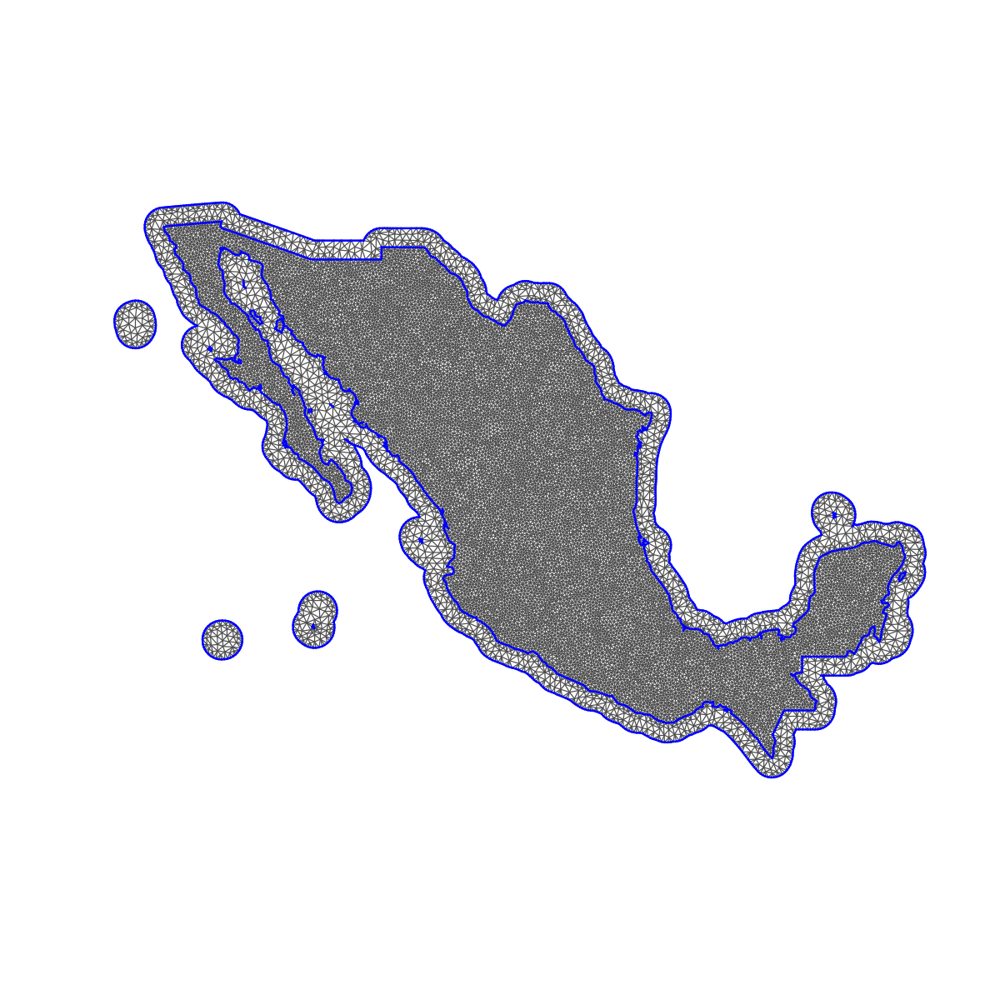

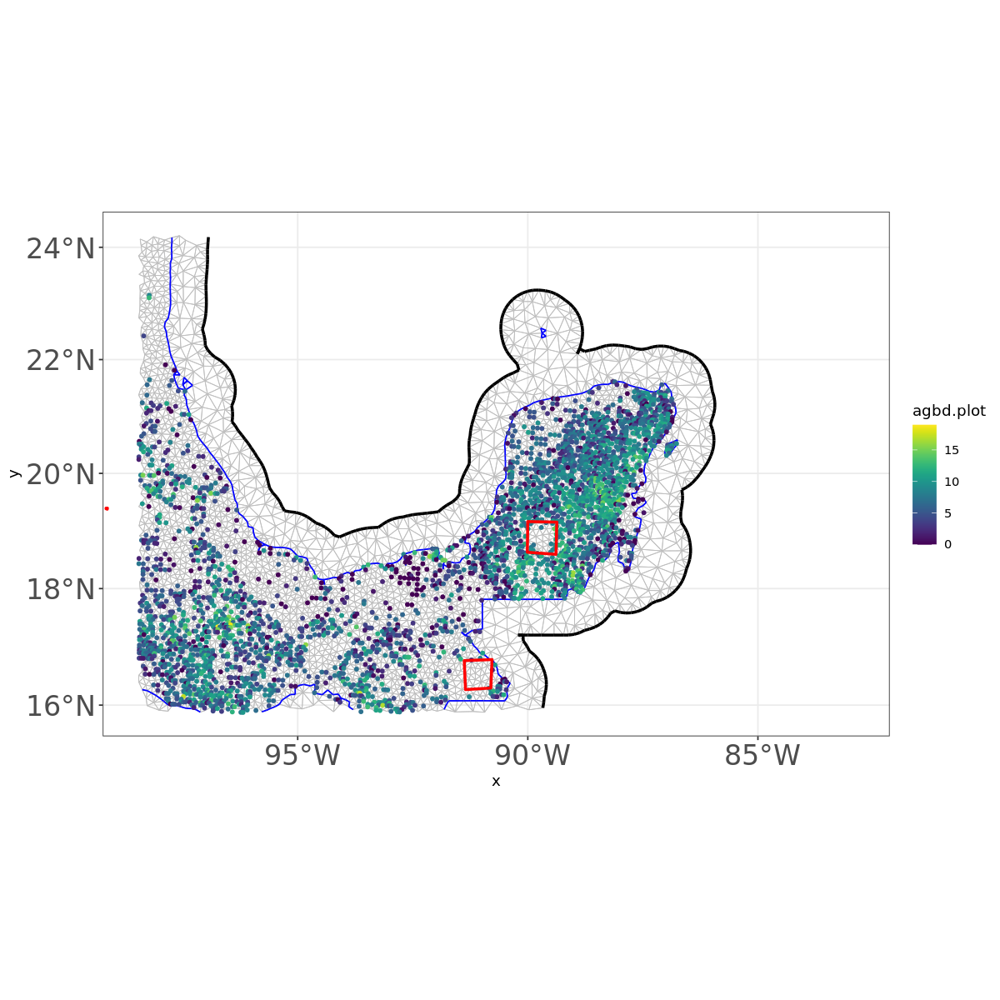

In [22]:
################### MAKING A MESH SURFACE OVER MEXICO ###################
options(repr.plot.width=10, repr.plot.height=10)

max.edge = 15*10^3 ### Let's start with a 15 km maximimum edge size of our mesh. Note, the units of max.edge must be in meters, so we multiply by 1000. 
mexico.buffer = st_buffer(mexico, dist = max.edge*5) # We also make a 5 km buffer around Mexico to prevent boundary effects.
mesh = inla.mesh.2d(boundary = list(as(mexico, "Spatial"), as(mexico.buffer, "Spatial")), max.edge = c(max.edge, 3*max.edge), cutoff = 2*max.edge/3, offset = c(max.edge, 5*max.edge)) 

plot(mesh) ## This is what our mesh looks like         

# Let's zoom in to a corner, so you can see what the mesh and buffer looks like, and also plot two hypothetical regions where we will eventually predict AGBD
ggplot() + inlabru::gg(data = mesh) + coord_sf(crs = 6933) + xlim(-9.5*10^6, -8*10^6) + ylim(2*10^6, 3*10^6) +theme_bw()+theme(axis.text=element_text(size=20),axis.title=element_text()) +
         geom_point(aes(x = loc.plot[,1], y = loc.plot[,2], col = agbd.plot),size=1) +
         scale_color_viridis() + 
         geom_sf(data = Deforestation,col="red",fill=NA,lwd=1)# add our fake deforestation sites
k = mesh$n ### This is the resulting number of vertices. It is the ultimate determinant of how computationally hard it will be to solve our model! 
# mesh$loc # This would give you the XY location of the center points of each mesh triangle. 

################ A FEW NOTES ON THE INPUTS TO inla.mesh.2d FUNCTION USED ABOVE #################
# boundary = Describe domain boundaries, i.e. the extent of Mexico
# offset = The extension distance, i.e. the amount in which the domain should be extended to make a buffer to avoid edge effects
# max.edge = The largest allowed triangle edge length inside the mesh.
# cutoff = Minimum edge length cutoff 

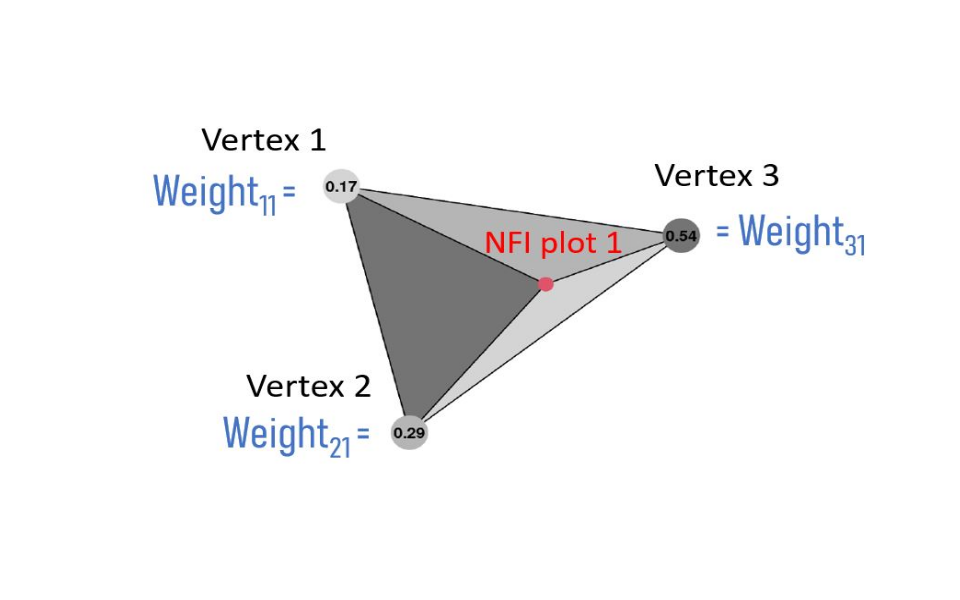

[1] "These are the number of rows (NFI plots) times the number of columns (vertices) in our mesh: 9863 and 16094"

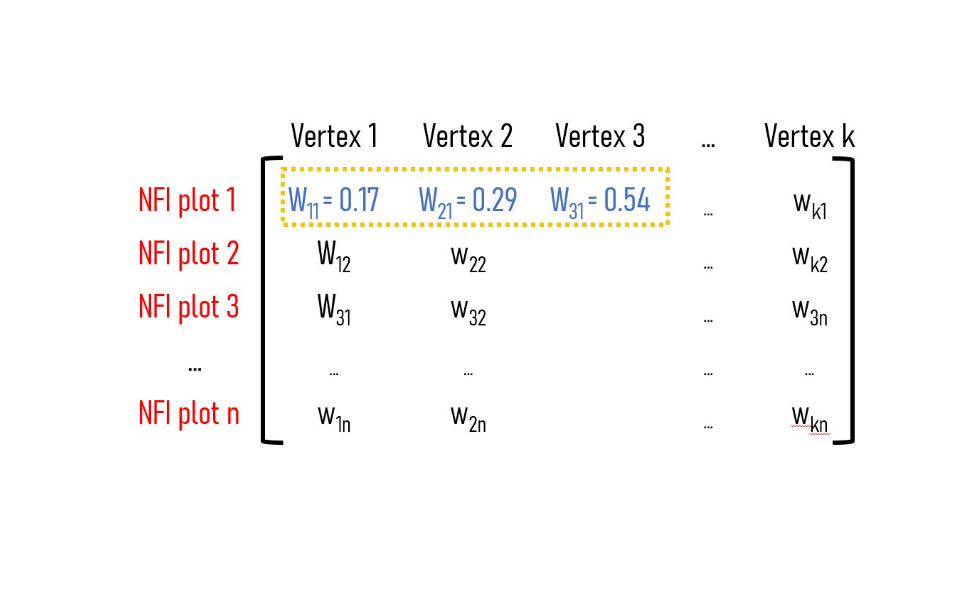

In [23]:
######################## INTERPOLATING OUR MESH TO EACH PLOT ##################

# Now, we have our data at NFI locations and we have our mesh with k vertices. Wonderful! 
# Next, we need a way to link the k mesh vertices to the n plot locations.
# This is achieved using a projector matrix (A.plot). For every NFI plot location, we come up with three weights, corresponding to the proportional 
# area to nodes/vertices of each triangle containing each NFI plot. We will explain this better in an accompanying presentation at the workshop.
# The sum of the three weights given to three vertices contain an NFI plot will be 1.   
# This results in a huge matrix of dimensions n_NFI_plots x n_vertices matrix.

options(repr.plot.width=8, repr.plot.height=5)

Example_weights <- readJPEG("/projects/ADE_biomass_harmonization/biomass_harmonization/NASA_CMS_2023/Mexico/Aplot.jpg",native=TRUE)
plot(0:1,0:1,type="n",ann=FALSE,axes=FALSE)
rasterImage(Example_weights,0,0,1,1)

Example_Aplot <- readJPEG("/projects/ADE_biomass_harmonization/biomass_harmonization/NASA_CMS_2023/Mexico/Aplot_matrix.jpg",native=TRUE)
plot(0:1,0:1,type="n",ann=FALSE,axes=FALSE)
rasterImage(Example_Aplot,0,0,1,1)

loc.plot = data.matrix(loc.plot)
A.plot = inla.spde.make.A(mesh = mesh, loc = loc.plot)

# You can look more closely into what A.plot looks like, but it should be rather intuitive: 
paste("These are the number of rows (NFI plots) times the number of columns (vertices) in our mesh:", dim(A.plot)[1], "and", dim(A.plot)[2]) 
# dim(A.plot) gives you number of rows (9863 NFI plots) x number of columns (16094 vertices in our mesh)
# Matrix::rowSums(A.plot) ### And this tells you that the sum of all rows = 1, meaning the sum of weights at each NFI plot is 1

### Finally, here is a great resource for understanding spatial effects: https://www.paulamoraga.com/book-geospatial/sec-geostatisticaldataexamplespatial.html

In [32]:
######################## MAKING A SPATIAL MODEL FOR ALPHA, BETA AND ETA  ##################

# This part is a little tricky. What you want to do is establish that alpha_tilde, beta_tilde, and eta_tilde 
# must be modelled with a covariance function, such that covariance between any two locations will depend on the relative 
# distance between them. There are many ways to define this function, but commonly used family of covariance function is the 
# Matérn covariance function. Matérn covariance function is probably the most commonly used one in geostatistics. 
# We do not want to dive into the math here (we can do that later), but let's, for now, understand just this: 

# Taking alpha_tilde as an example, we want to know the "range" (in units of meters) at which alpha_tilde will 
# decay in correlation with distance. Similarly, we want to know the "range" at which beta_tilde and eta_tilde decays. 
# And, we want to know what is the standard deviation (SD) of the Guassian process. 

# In the followng, we simply supply these spatial models using INLA. We also supply some "prior probability" bound on the data, meaning, we give 
# INLA a starting point to optimize the model fitting. This is just a best guess on how the spatially-varying parameters are expected to behave. 

# Priors for the varying intercept alpha_tilde
spde.alpha = inla.spde2.pcmatern(mesh, 
                                 prior.range = c(30*10^3, 0.01), # This says the probability that the range is LESS than 30 km is 0.01
                                 prior.sigma = c(60, 0.01)) # This says the probability that the SD is GREATER than 60 Mg/ha is 0.01

# Priors for the varying coefficient beta_tilde
spde.beta = inla.spde2.pcmatern(mesh, 
                                prior.range = c(30*10^3, 0.01), # Same interpretations as above here
                                prior.sigma = c(1, 0.5)) # This says the probability that the SD is GREATER than 1 is 0.5

# Priors for the varying coefficient eta_tilde
spde.eta = inla.spde2.pcmatern(mesh, 
                                prior.range = c(30*10^3, 0.01), # Same interpretations as above here
                                prior.sigma = c(1, 0.5)) # This says the probability that the SD is GREATER than 1 is 0.5

# If you are keen on understanding the range and SD parameters and intuitively see how the work, here is a nice simulation: 

In [33]:
###################### SETTING UP THE MODEL SO THAT INLA CAN RUN IT ##################

# This cell simply rearranges all the data we have into the right syntax/format needed by INLA to solve the model. 
# Let's have a recap what data we have:  
# (1) We have NFI AGBD, CCI AGBD and Forest Height at each NFI location
# (2) We have an awesome mesh covering Mexico in little triangles that encompass the NFI plot locations
# (3) We have a projector matrix (A.plot), which gives each NFI location 3 weights from the nearest vertices of the containing triangle
# (4) We have a spatial-model that will help us understand the spatially-varying errors alpha-tilde, beta-tilde, and eta-tilde

### First, we just construct our formula, which we need to provide to INLA #####
formula = agbd ~ # This is the NFI-estimated AGBD, which we have to predict
  -1 +           # This informs INLA that it should not use a default intercept, but use the one we provide
  intercept +    # Intercept
  cci +          # CCI values
  hei +          # Forest height values
  f(alpha.spat, model = spde.alpha) + # Spatially-varying error term, modelled with spde.alpha
  f(beta.spat, model = spde.beta) +   # Spatially-varying error term, modelled with spde.beta
  f(eta.spat, model = spde.eta)       # Spatially-varying error term, modelled with spde.eta

#### Second, we arrange our data so we can supply it to INLA to input in the formula above #####
# The INLA stack is provided as three separate lists: 
# (1) The "data" list, which is only our NFI-estimated AGBD at each plot
# (2) The "A" list, which contains our projection matrices for each model parameter. For alpha, beta and eta, this is just 1. 
#     But for alpha-tilde, beta-tilde and eta-tilde, we use A.plot to "project" on our mesh nodes! 
# (3) The "effects" list, which contains the actual values of our model parameters. We have observations of CCI and Forest 
#     height. For all other model parameters (i.e. the intercept and the random effects), we just supply an index.  

stack = inla.stack(data = list(agbd = agbd.plot),
                   A = list(1, # tell INLA we expect an intercept, and the projection matrix is just "1"
                            1, # tell INLA we expect a cci biomass value, and the projection matrix for its parameter is just "1"
                            1, # tell INLA we expect a forest height value, and the projection matrix for its parameter is just "1"
                            A.plot, # tell INLA we have a mesh projected onto the plot locations for alpha-tilde 
                            Diagonal(x = cci.plot)%*%A.plot, # tell INLA to multiply our mesh with CCI values for beta-tilde
                            Diagonal(x = hei.plot)%*%A.plot),# tell INLA to multiply our mesh with forest height values for eta-tilde
                   effects = list(
                     intercept = rep(1, n.plot), # The intercept just given an index equal to 1
                     cci = cci.plot, # Supply INLA with the CCI values
                     hei = hei.plot, # Supply INLA with the Forest Height values
                     alpha.spat = 1:k, # The random effects just need to given unique indices at each mesh node.
                     beta.spat = 1:k, # The random effects just need to given unique indices at each mesh node.
                     eta.spat = 1:k # The random effects just need to given unique indices at each mesh node.
                   ))

In [34]:
model_fit = inla(formula = formula, # Provide the formula
                 family = 'gaussian', # We assume our data follows a Gaussian generalized linear model (GLM)
                 data = inla.stack.data(stack), # This line and the one below are simply how we feed INLA the stack.
                 control.predictor = list(A = inla.stack.A(stack)),
                 control.compute = list(config = TRUE, dic = TRUE, waic = TRUE, cpo = TRUE), # As for Bayesian diagnostics, which help understand results
                 verbose = TRUE)
summary(model_fit)
hist(model_fit$cpo$pit, breaks = 20)


 *** inla.core.safe:  The inla program failed, but will rerun in case better initial values may help. try=1/1 


ERROR: Error in inla.core.safe(formula = formula, family = family, contrasts = contrasts, : The inla-program exited with an error. Unless you interupted it yourself, please rerun with verbose=TRUE and check the output carefully.
  If this does not help, please contact the developers at <help@r-inla.org>.
The inla program failed and the maximum number of tries has been reached.



Call:
   c("inla.core(formula = formula, family = family, contrasts = contrasts, 
   ", " data = data, quantiles = quantiles, E = E, offset = offset, ", " 
   scale = scale, weights = weights, Ntrials = Ntrials, strata = strata, 
   ", " lp.scale = lp.scale, link.covariates = link.covariates, verbose = 
   verbose, ", " lincomb = lincomb, selection = selection, control.compute 
   = control.compute, ", " control.predictor = control.predictor, 
   control.family = control.family, ", " control.inla = control.inla, 
   control.fixed = control.fixed, ", " control.mode = control.mode, 
   control.expert = control.expert, ", " control.hazard = control.hazard, 
   control.lincomb = control.lincomb, ", " control.update = 
   control.update, control.lp.scale = control.lp.scale, ", " 
   control.pardiso = control.pardiso, only.hyperparam = only.hyperparam, 
   ", " inla.call = inla.call, inla.arg = inla.arg, num.threads = 
   num.threads, ", " keep = keep, working.directory = working.directory,

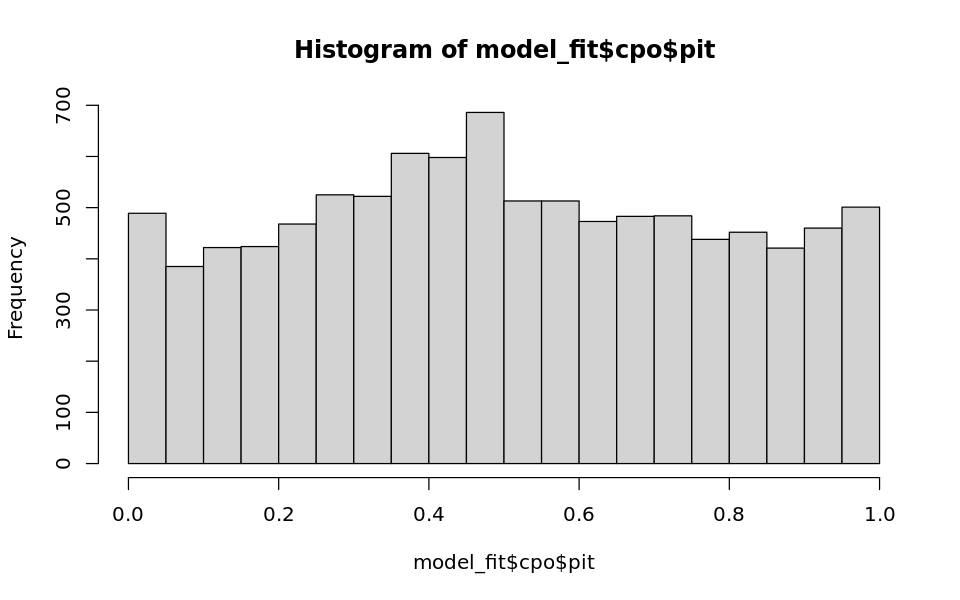

In [28]:
model_fit = inla(formula = formula, # Provide the formula
                 family = 'gaussian', # We assume our data follows a Gaussian generalized linear model (GLM)
                 data = inla.stack.data(stack), # This line and the one below are simply how we feed INLA the stack.
                 control.predictor = list(A = inla.stack.A(stack)),
                 control.compute = list(config = TRUE, dic = TRUE, waic = TRUE, cpo = TRUE), # As for Bayesian diagnostics, which help understand results
                 verbose = TRUE)
summary(model_fit)
hist(model_fit$cpo$pit, breaks = 20)


Call:
   c("inla.core(formula = formula, family = family, contrasts = contrasts, 
   ", " data = data, quantiles = quantiles, E = E, offset = offset, ", " 
   scale = scale, weights = weights, Ntrials = Ntrials, strata = strata, 
   ", " lp.scale = lp.scale, link.covariates = link.covariates, verbose = 
   verbose, ", " lincomb = lincomb, selection = selection, control.compute 
   = control.compute, ", " control.predictor = control.predictor, 
   control.family = control.family, ", " control.inla = control.inla, 
   control.fixed = control.fixed, ", " control.mode = control.mode, 
   control.expert = control.expert, ", " control.hazard = control.hazard, 
   control.lincomb = control.lincomb, ", " control.update = 
   control.update, control.lp.scale = control.lp.scale, ", " 
   control.pardiso = control.pardiso, only.hyperparam = only.hyperparam, 
   ", " inla.call = inla.call, inla.arg = inla.arg, num.threads = 
   num.threads, ", " keep = keep, working.directory = working.directory,

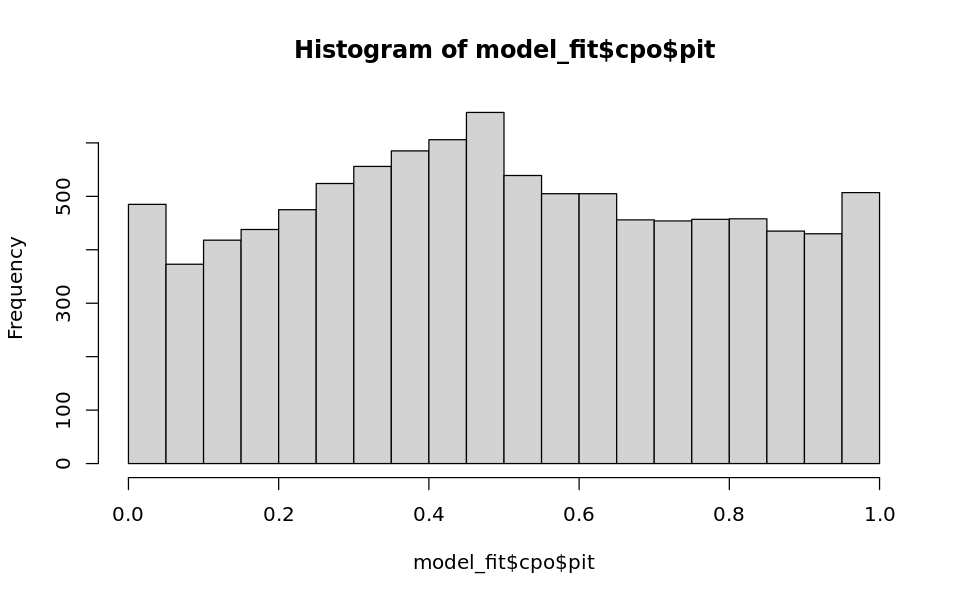

In [31]:
###################### SET THE MODEL RUNNING ###############################

model_fit = inla(formula = formula, # Provide the formula
                 family = 'gaussian', # We assume our data follows a Gaussian generalized linear model (GLM)
                 data = inla.stack.data(stack), # This line and the one below are simply how we feed INLA the stack.
                 control.predictor = list(A = inla.stack.A(stack)),
                 control.compute = list(config = TRUE, dic = TRUE, waic = TRUE, cpo = TRUE), # As for Bayesian diagnostics, which help understand results
                 verbose = TRUE)
summary(model_fit)
hist(model_fit$cpo$pit, breaks = 20) 
# save(model_fit, file = "/projects/ADE_biomass_harmonization/biomass_harmonization/NASA_CMS_2023/Mexico/INLA_model_fit.RData")

# A nice feature of fitting models in INLA is that you can ask it to do a leave-one-out cross validation while fitting. This is done by setting cpo = TRUE. 
# When run, this gives you a PIT (probability integral transform, The PIT is the probability of a new response less than the observed response using a model based on the rest of the data). 
# We’d expect the PIT values to be uniformly distributed if the model assumptions are correct.
# If the model represents the observation well, the distribution of the PIT values should be close to a uniform distribution between 0 and 1. 

# load("/projects/ADE_biomass_harmonization/biomass_harmonization/NASA_CMS_2023/Mexico/INLA_model_fit.RData")
# summary(model_fit)
# options(repr.plot.width=4, repr.plot.height=4)
# hist(model_fit$cpo$pit, breaks = 20) 

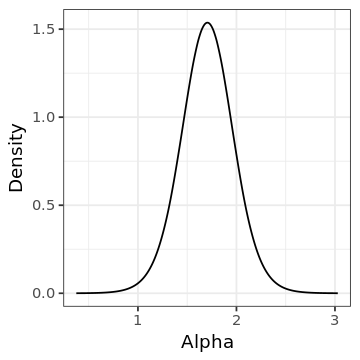

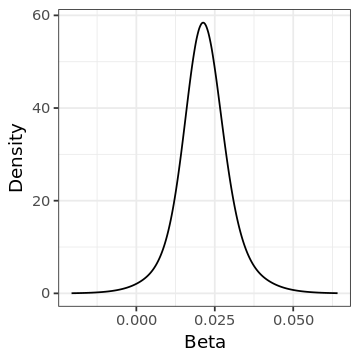

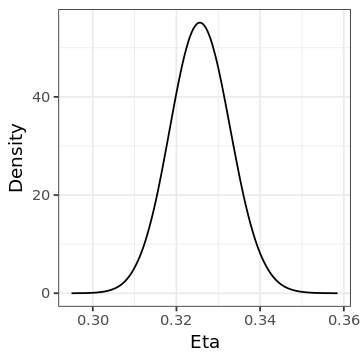

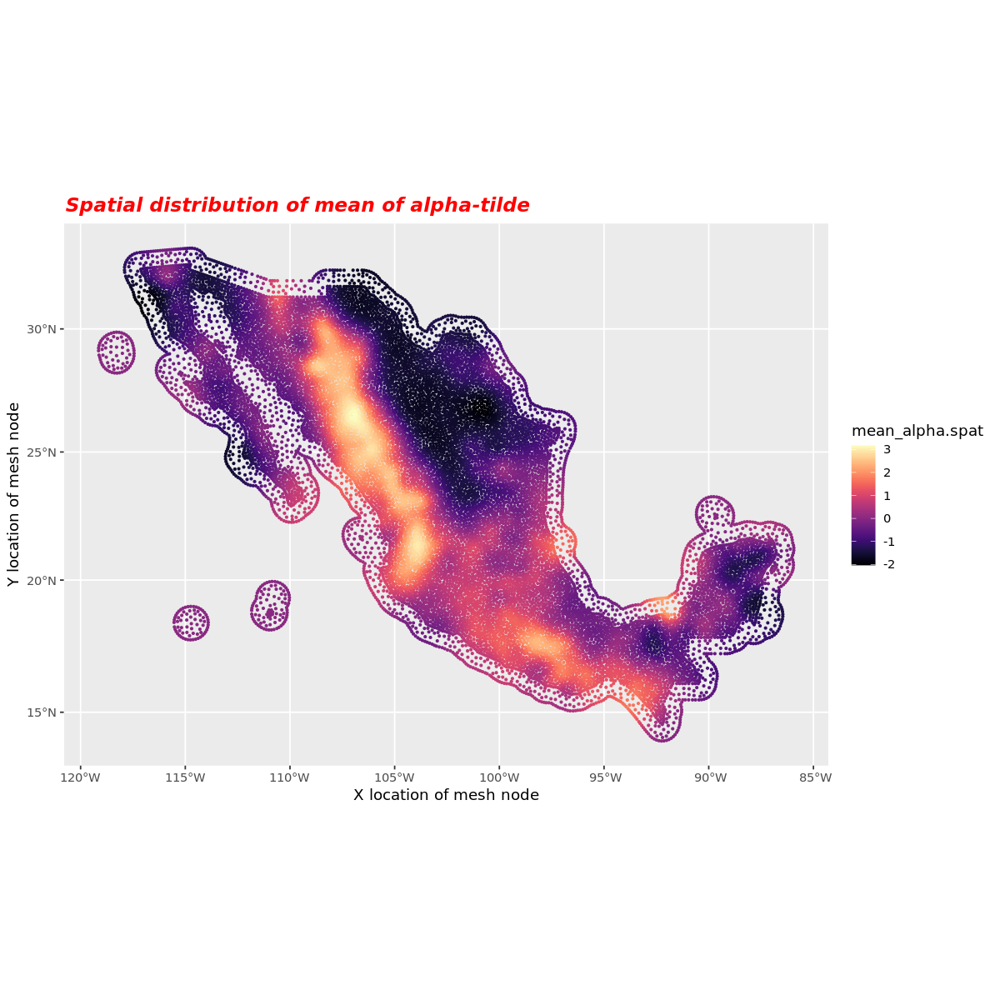

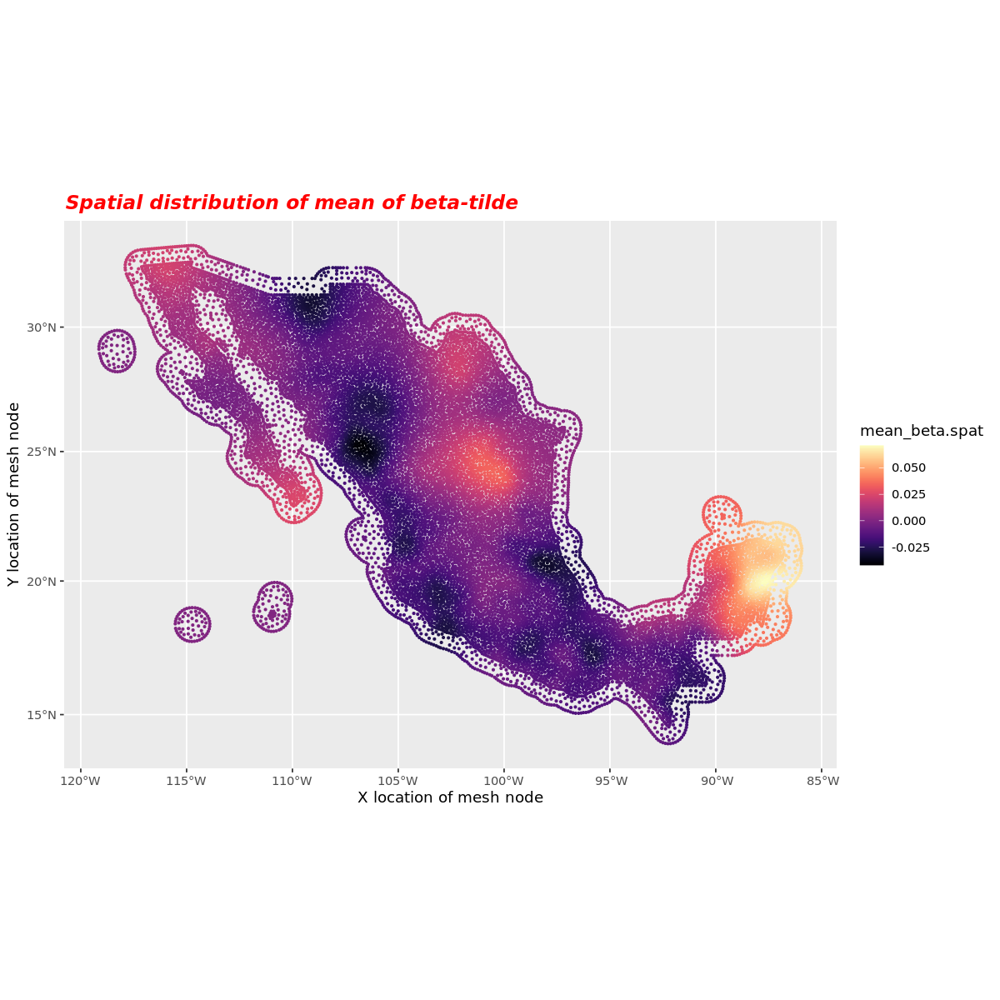

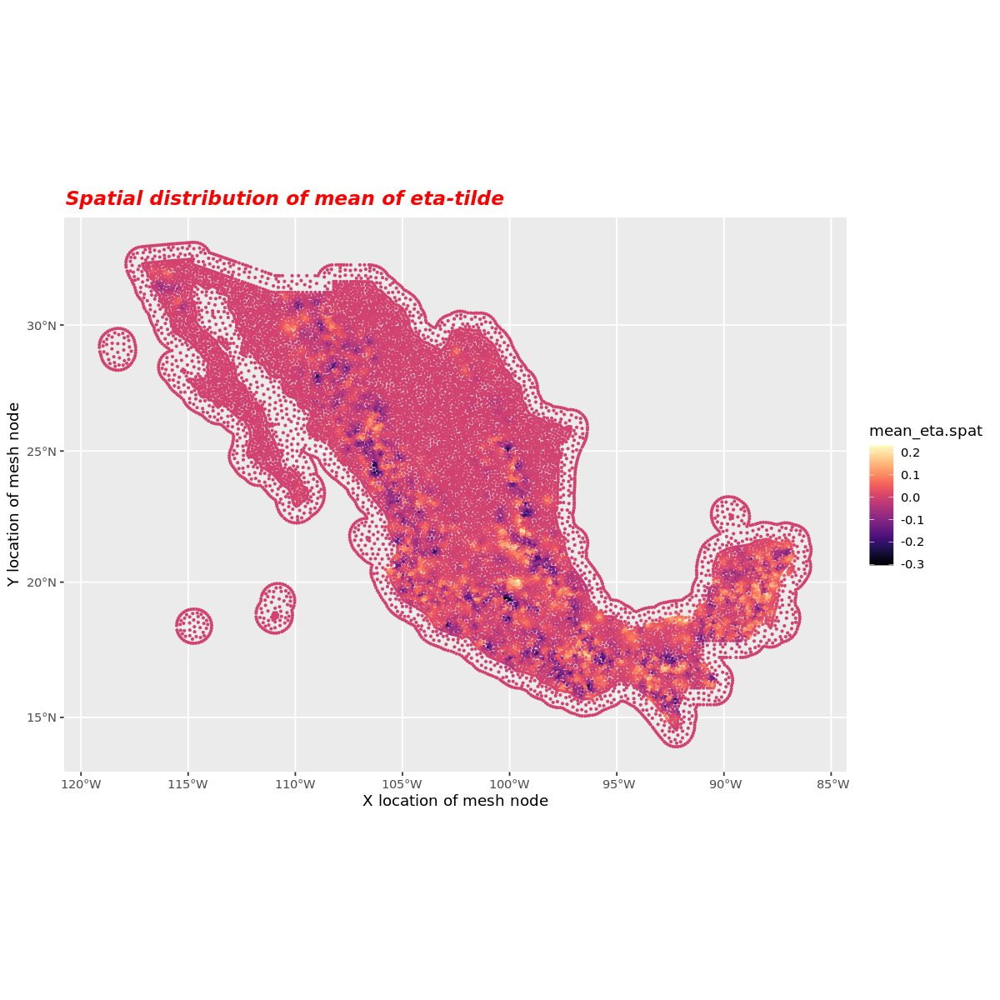

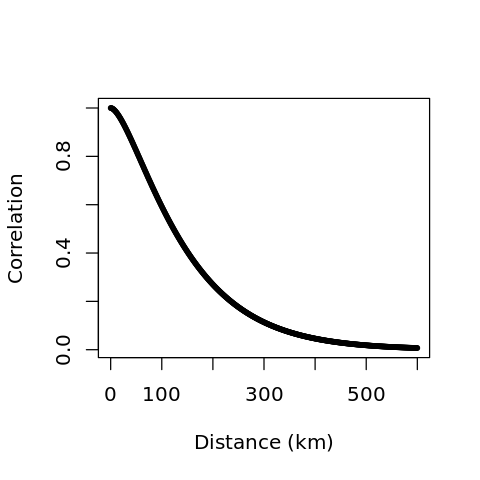

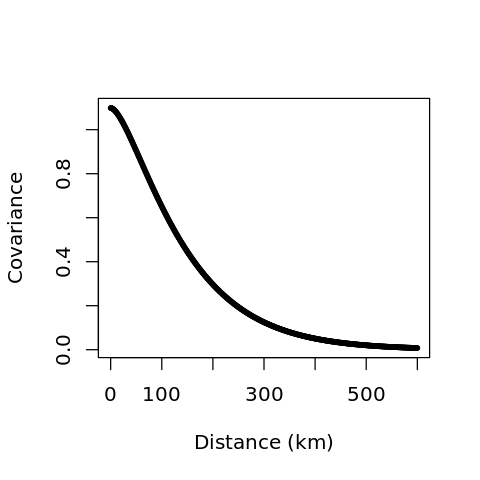

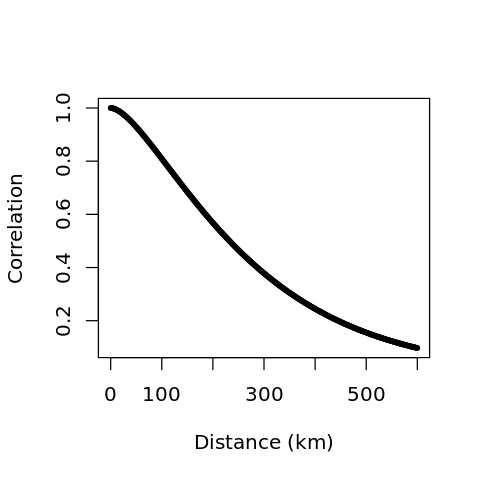

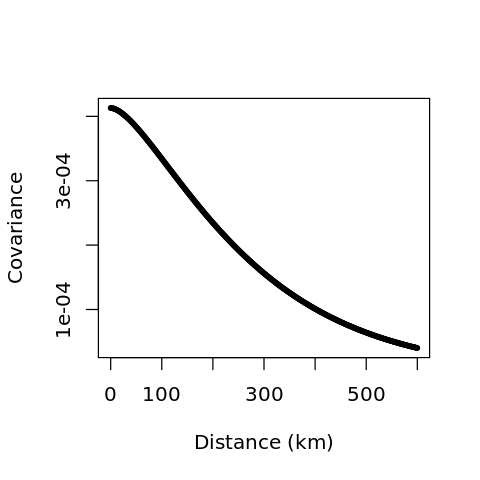

In [13]:
############################ UNDERSTANDING THE RESULTS OF THE MODEL #######################
options(repr.plot.width=3, repr.plot.height=3)

# When inla() is executed, we obtain an object of class "inla" that contains the information of the fitted model 
# including summaries and posterior marginal densities of the fixed effects, 
# the random effects, and the hyperparameters (and many more things, but we explore only these for now). 

# The fixed effects are straighforward to understand. Below, we see the posterior elements of the intercept alpha, and parameters beta and eta. 
alpha <- model_fit$marginals.fixed[[1]]
beta <- model_fit$marginals.fixed[[2]]
eta <- model_fit$marginals.fixed[[3]]
ggplot(data.frame(inla.smarginal(alpha)), aes(x, y)) + geom_line() + theme_bw() + xlab("Alpha") + ylab("Density")
ggplot(data.frame(inla.smarginal(beta)), aes(x, y)) + geom_line() + theme_bw() + xlab("Beta") + ylab("Density")
ggplot(data.frame(inla.smarginal(eta)), aes(x, y)) + geom_line() + theme_bw() + xlab("Eta") + ylab("Density")

# The random effects, in our case, are also easy to understand from the model outputs. The posterior distributions of the range and SD of alpha.spat, 
# beta.spat and eta.spat show us how these random effects vary across Mexico.

options(repr.plot.width=10, repr.plot.height=10)

mean_alpha.spat <- model_fit$summary.random[[1]]$mean # mean values of alpha.spat at each mesh vertex
sd_alpha.spat <- model_fit$summary.random[[1]]$sd # standard deviation of alpha.spat at each mesh node 

mean_beta.spat <- model_fit$summary.random[[2]]$mean # mean values of alpha.spat at each mesh vertex
sd_beta.spat <- model_fit$summary.random[[2]]$sd # standard deviation of alpha.spat at each mesh node 

mean_eta.spat <- model_fit$summary.random[[3]]$mean # mean values of alpha.spat at each mesh vertex
sd_eta.spat <- model_fit$summary.random[[3]]$sd # standard deviation of alpha.spat at each mesh node 

ggplot() + coord_sf(crs = 6933) + 
           geom_point(aes(x = mesh$loc[,1], y = mesh$loc[,2], col = mean_alpha.spat),size=0.5) +  # make a map to see plot locations and the AGBD values at each location
           scale_color_viridis(option="magma") + xlab("X location of mesh node") + ylab("Y location of mesh node") + ggtitle("Spatial distribution of mean of alpha-tilde") + theme(plot.title = element_text(color="red", size=14, face="bold.italic"))

ggplot() + coord_sf(crs = 6933) + 
           geom_point(aes(x = mesh$loc[,1], y = mesh$loc[,2], col = mean_beta.spat),size=0.5) +  # make a map to see plot locations and the AGBD values at each location
           scale_color_viridis(option="magma") + xlab("X location of mesh node") + ylab("Y location of mesh node") + ggtitle("Spatial distribution of mean of beta-tilde") + theme(plot.title = element_text(color="red", size=14, face="bold.italic"))

ggplot() + coord_sf(crs = 6933) + 
           geom_point(aes(x = mesh$loc[,1], y = mesh$loc[,2], col = mean_eta.spat),size=0.5) +  # make a map to see plot locations and the AGBD values at each location
           scale_color_viridis(option="magma") + xlab("X location of mesh node") + ylab("Y location of mesh node") + ggtitle("Spatial distribution of mean of eta-tilde") + theme(plot.title = element_text(color="red", size=14, face="bold.italic"))

options(repr.plot.width=4, repr.plot.height=4)

# Let's also plot the corelation vs. distance and covariance vs. distance for alpha.spat to see how the spatial process decays with distance. 

range = model_fit$summary.hyperpar[2,]$mean / 1000 #posterior expected range in kilometers
dist.seq = 0:600 # and we want a plot for these distance values
smoothness = 1 # We used the default smoothness of 1 for the Matern Covariance in INLA
matern.cor.seq = fields::Matern(d = dist.seq, # Compute and plot the correlations
                                range = range/sqrt(8*smoothness), # This divisor adjusts to the INLA parameterization
                                smoothness = smoothness)
plot(dist.seq, matern.cor.seq, xlab = "Distance (km)", ylab = "Correlation",cex=0.5)
matern.sd = model_fit$summary.hyperpar[3,]$mean # Compute covariance by multiplying by the variance parameter (SD parameter squared)
plot(dist.seq, matern.cor.seq*matern.sd^2, xlab = "Distance (km)", ylab = "Covariance",cex=0.5)

range = model_fit$summary.hyperpar[4,]$mean / 1000 #posterior expected range in kilometers
dist.seq = 0:600 # and we want a plot for these distance values
smoothness = 1 # We used the default smoothness of 1 for the Matern Covariance in INLA
matern.cor.seq = fields::Matern(d = dist.seq, # Compute and plot the correlations
                                range = range/sqrt(8*smoothness), # This divisor adjusts to the INLA parameterization
                                smoothness = smoothness)
plot(dist.seq, matern.cor.seq, xlab = "Distance (km)", ylab = "Correlation",cex=0.5)
matern.sd = model_fit$summary.hyperpar[5,]$mean # Compute covariance by multiplying by the variance parameter (SD parameter squared)
plot(dist.seq, matern.cor.seq*matern.sd^2, xlab = "Distance (km)", ylab = "Covariance",cex=0.5)

# DIC, WAIC and the CPO and PIT are standard Bayesian model diagnostics, which tell us how our model is performing. 


Call:
   c("inla.core(formula = formula, family = family, contrasts = contrasts, 
   ", " data = data, quantiles = quantiles, E = E, offset = offset, ", " 
   scale = scale, weights = weights, Ntrials = Ntrials, strata = strata, 
   ", " lp.scale = lp.scale, link.covariates = link.covariates, verbose = 
   verbose, ", " lincomb = lincomb, selection = selection, control.compute 
   = control.compute, ", " control.predictor = control.predictor, 
   control.family = control.family, ", " control.inla = control.inla, 
   control.fixed = control.fixed, ", " control.mode = control.mode, 
   control.expert = control.expert, ", " control.hazard = control.hazard, 
   control.lincomb = control.lincomb, ", " control.update = 
   control.update, control.lp.scale = control.lp.scale, ", " 
   control.pardiso = control.pardiso, only.hyperparam = only.hyperparam, 
   ", " inla.call = inla.call, inla.arg = inla.arg, num.threads = 
   num.threads, ", " keep = keep, working.directory = working.directory,

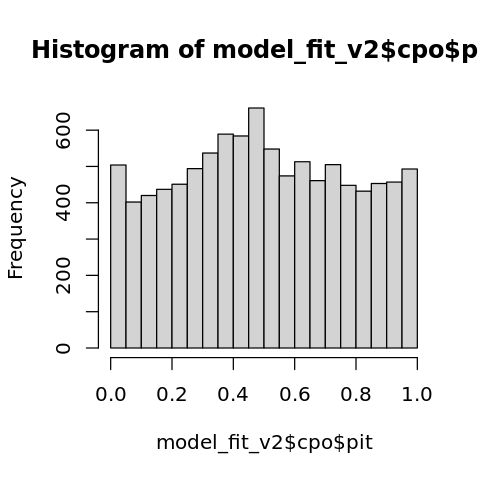

In [14]:
################## IMPROVING OUR MODEL ############

# Before we move ahead, let's try improve our model by making a finer mesh. We choose to rougly half our max.edge (8 km) and see if our model improves. 

max.edge = 10*10^3
mexico.buffer = st_buffer(mexico, dist = max.edge*5) # We also make a 5 km buffer around Mexico to prevent boundary effects.
mesh = inla.mesh.2d(boundary = list(as(mexico, "Spatial"), as(mexico.buffer, "Spatial")), max.edge = c(max.edge, 3*max.edge), cutoff = 2*max.edge/3, offset = c(max.edge, 5*max.edge)) 
k = mesh$n ### This is the resulting number of vertices
loc.plot <- data.matrix(loc.plot) #In case loc.plot is a df rather than matrix, use "loc.plot <- data.matrix(loc.plot)"
n.plot = nrow(loc.plot)
A.plot = inla.spde.make.A(mesh = mesh, loc = loc.plot) # make a new projector matrix with the new mesh and the same plot locations. 
spde.alpha = inla.spde2.pcmatern(mesh, 
                                 prior.range = c(30*10^3, 0.01), # This says the probability that the range is LESS than 30 km is 0.01
                                 prior.sigma = c(60, 0.01)) # This says the probability that the sd is GREATER than 60 Mg/ha is 0.01

# Priors for the varying coefficient beta_tilde
spde.beta = inla.spde2.pcmatern(mesh, 
                                prior.range = c(30*10^3, 0.01), # Same interpretations here
                                prior.sigma = c(1, 0.5)) # This says the probability that the sd is GREATER than 1 is 0.5

# Priors for the varying coefficient eta_tilde
spde.eta = inla.spde2.pcmatern(mesh, 
                                prior.range = c(30*10^3, 0.01), # Same interpretations here
                                prior.sigma = c(1, 0.5)) # This says the probability that the sd is GREATER than 1 is 0.5
### Construct our formula #####
formula = agbd ~
  -1 + # removes the automatic intercept so you can include your named intercept
  intercept + 
  cci +
  hei +
  f(alpha.spat, model = spde.alpha) + 
  f(beta.spat, model = spde.beta) +
  f(eta.spat, model = spde.eta)
## Arrange our data so we can supply it to INLA to input in the formula above #####
stack = inla.stack(data = list(agbd = agbd.plot),
                   A = list(1, 
                            1, 
                            1, 
                            A.plot, 
                            Diagonal(x = cci.plot)%*%A.plot, # 
                            Diagonal(x = hei.plot)%*%A.plot),
                   effects = list(
                     intercept = rep(1, n.plot),
                     cci = cci.plot,
                     hei = hei.plot,
                     alpha.spat = 1:k, 
                     beta.spat = 1:k, 
                     eta.spat = 1:k
                   ))

# Below, notice the arguments in 'control.mode = ' We tell INLA our starting parameters in "theta=", but tell it to restart the optimization from 
# there (restart = T), using the outputs of model_fit generated previously. It will still take a while, but less than it would have if we started from scratch

# model_fit_v2 = inla(formula = formula, # Provide the formula
#                  family = 'gaussian', # We assume our data follows a Gaussian generalized linear model (GLM)
#                  data = inla.stack.data(stack), # These line and the one below are simply how we feed INLA the stack.
#                  control.predictor = list(A = inla.stack.A(stack)),
#                  control.compute = list(config = T, dic = T, waic = T, cpo = T),
#                  control.inla = list(int.strategy = "eb"), # EB just fixes the hyperparameters at their maximum posterior (like maximum likelihood, but accounting for priors) values. The other methods manually integrate across the range of possible values.
#                  control.mode = list(theta = model_fit$mode$theta, restart = T), #Ask INLA to restart the model using the previous iteration
#                  verbose = TRUE)
# summary(model_fit_v2)
# save(model_fit_v2, file = "/projects/ADE_biomass_harmonization/biomass_harmonization/NASA_CMS_2023/Mexico/INLA_model_fit_v2.RData")
# hist(model_fit_v2$cpo$pit, breaks = 20) 

options(repr.plot.width=4, repr.plot.height=4)
load("/projects/ADE_biomass_harmonization/biomass_harmonization/NASA_CMS_2023/Mexico/INLA_model_fit_v2.RData")
summary(model_fit_v2)
hist(model_fit_v2$cpo$pit, breaks = 20) 

# We don't see a massive improvement in either the PIT distributions, the DIC or WAIC values. 
# We can conclude that using a max.edge of 8 km is sufficient and there is no further need to refine our mesh. 

In [15]:
############## HOW MUCH OF THE VARIANCE IS EXPLAINED BY OUR MODEL #########################
AGBD.var = var(agbd.plot) # variance of sqrt of AGBD in our training sample of 90% of plots 
AGBD.var
var(0.021*cci.plot) + var(0.323*hei.plot) + (1.709^2)
var(0.022*cci.plot) + var(0.134*hei.plot)

FIXED.var = ((var(0.021*cci.plot) + var(0.323*hei.plot) + 1.709^2)) #total variance of our fixed effects parameters
SPAT.var = (1.10^2) + var(0.022*cci.plot) + var(0.134*hei.plot)
Ratio = round(FIXED.var/AGBD.var * 100.0,0) # gives you the percentage of variance explained by our fixed effects 
Ratio
Ratio = round(SPAT.var/AGBD.var * 100.0,0)
Ratio

[1] 13.39658

[1] 8.280279

[1] 1.326091

[1] 62

[1] 19

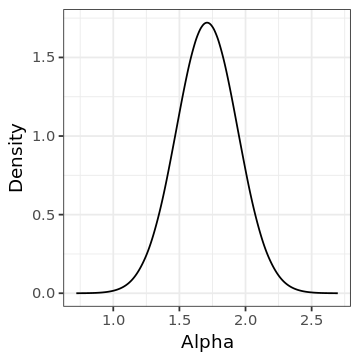

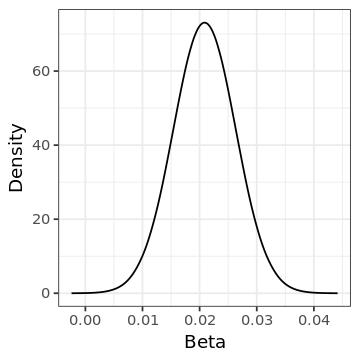

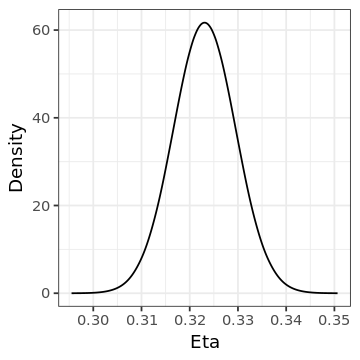

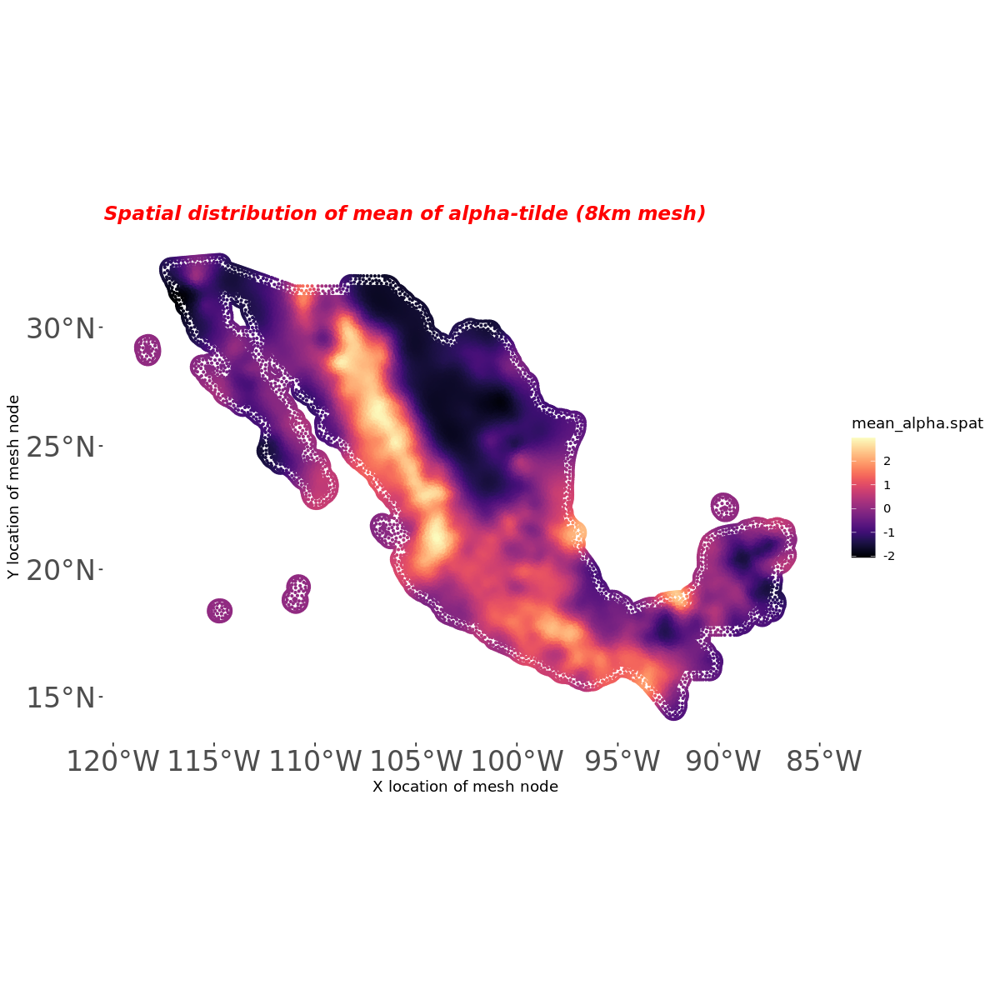

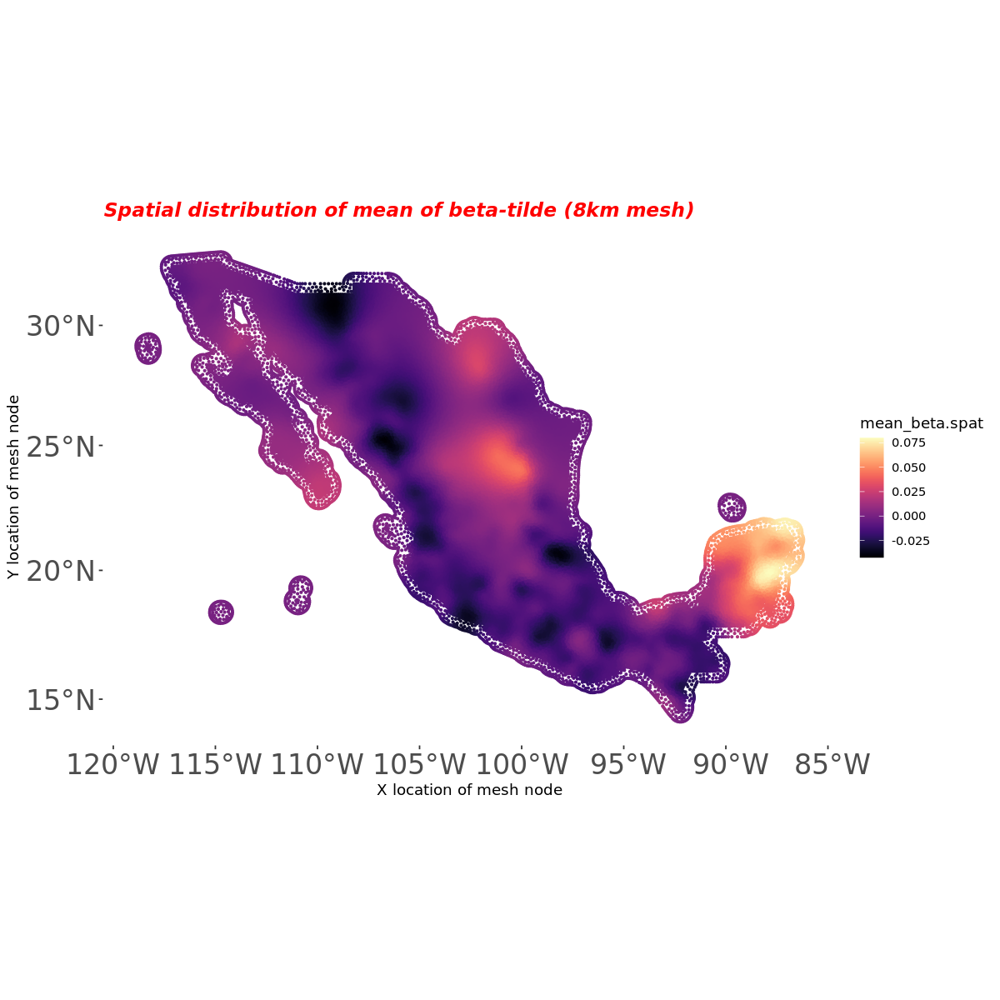

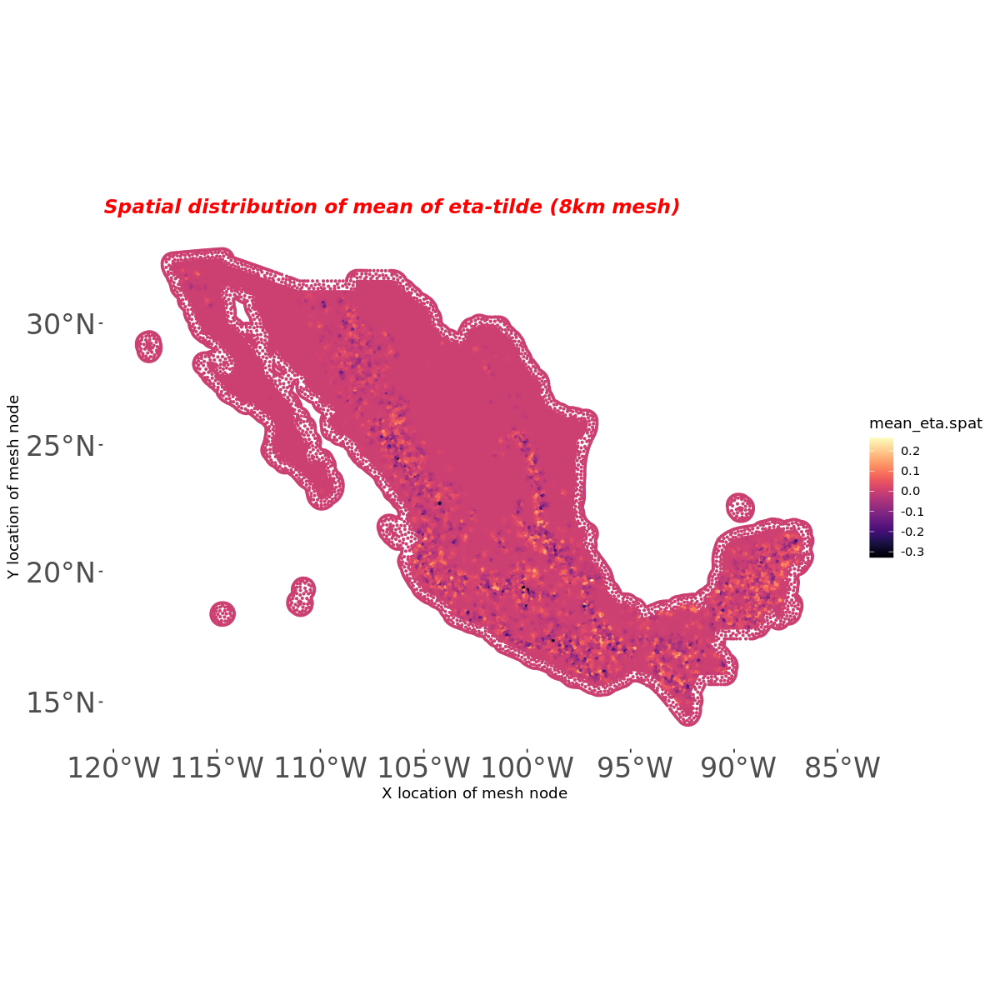

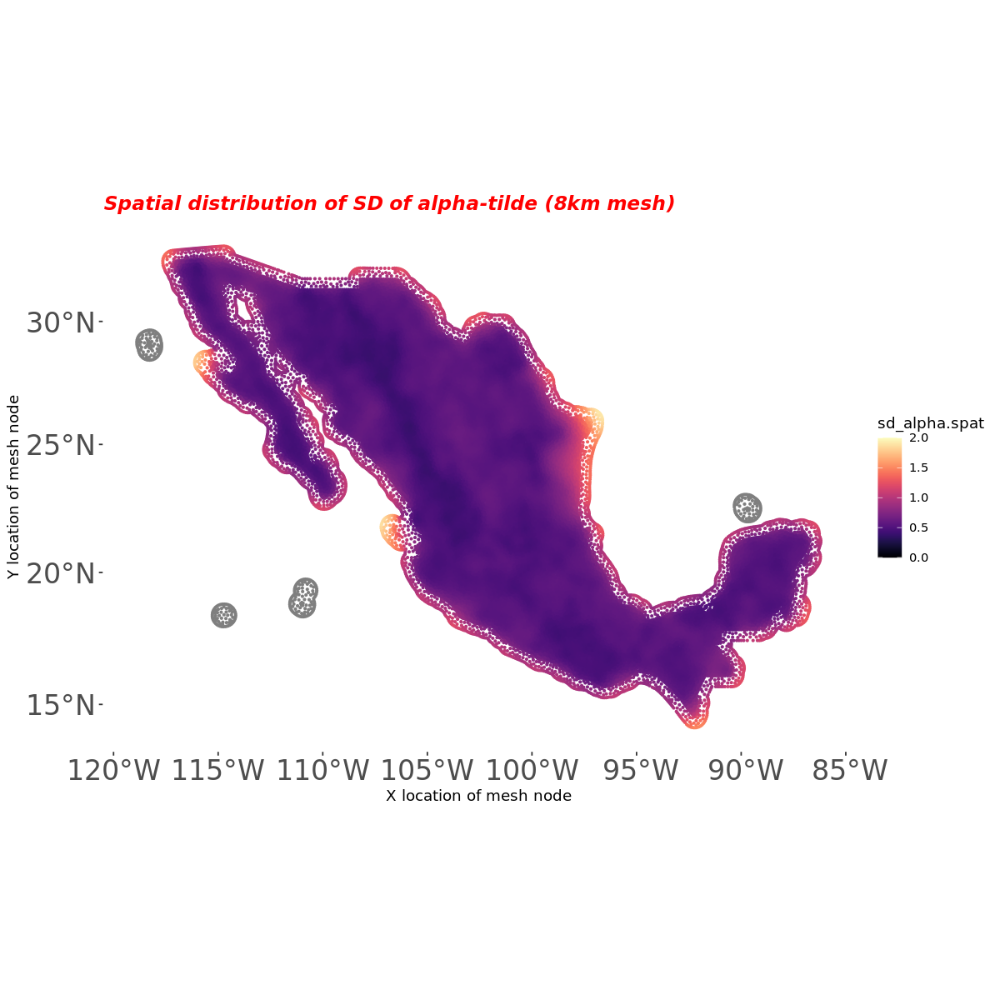

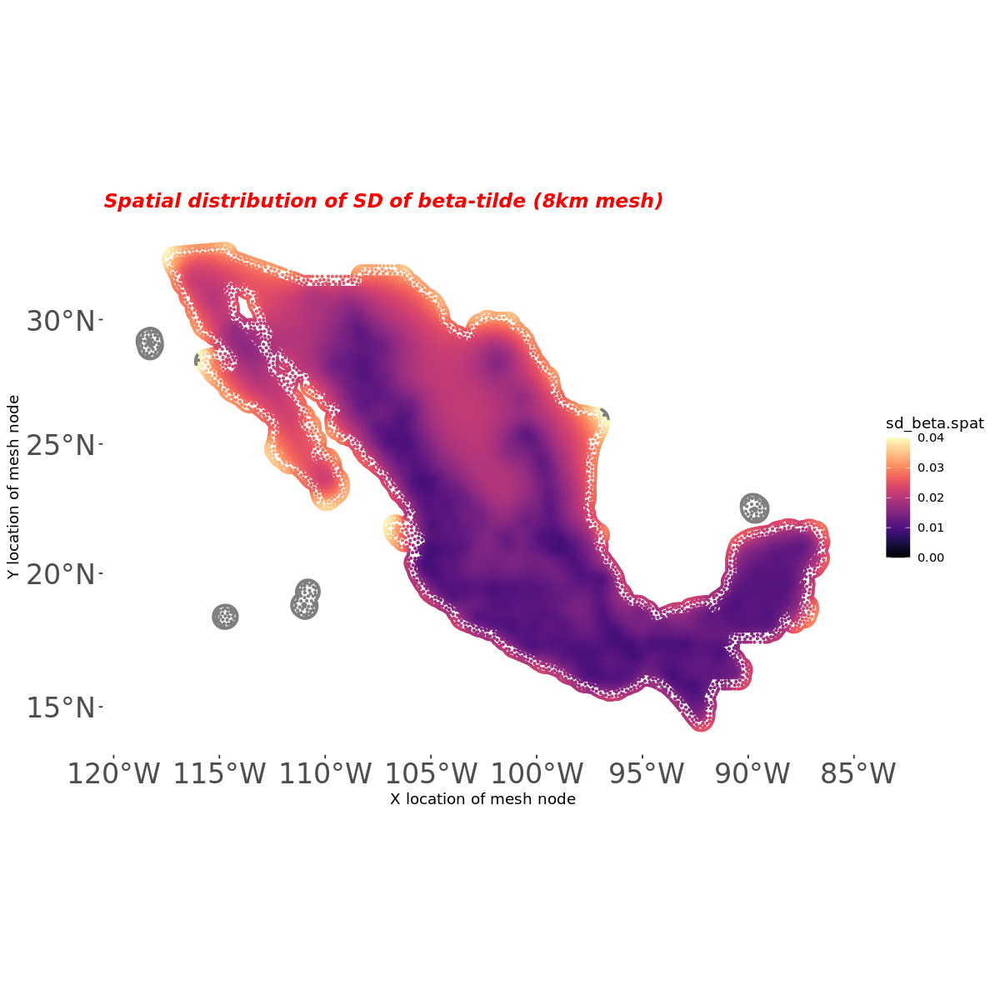

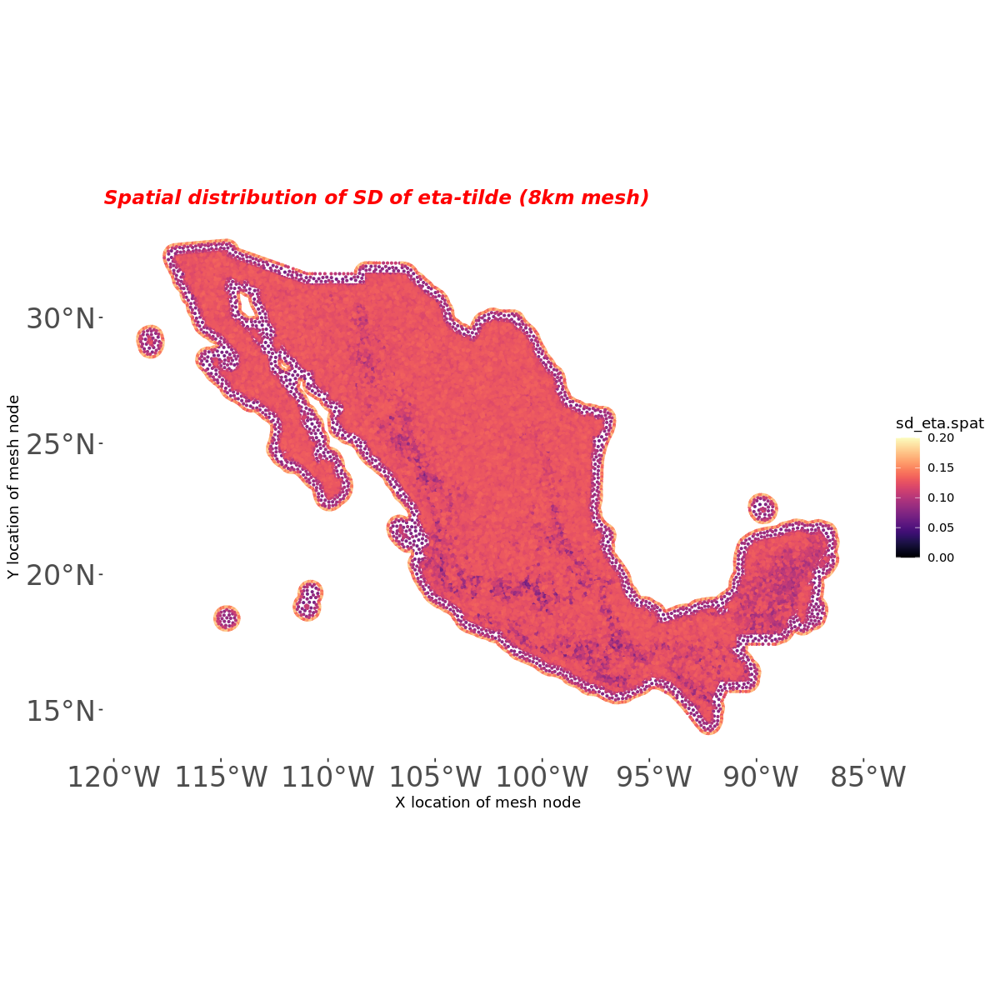

In [16]:
############################ UNDERSTANDING THE RESULTS OF THE MODEL #######################
options(repr.plot.width=3, repr.plot.height=3)

# When inla() is executed, we obtain an object of class "inla" that contains the information of the fitted model 
# including summaries and posterior marginal densities of the fixed effects, 
# the random effects, and the hyperparameters (and many more things, but we explore only these for now). 

# The fixed effects are straighforward to understand. Below, we see the posterior elements of the intercept alpha, and parameters beta and eta. 
alpha <- model_fit_v2$marginals.fixed[[1]]
beta <- model_fit_v2$marginals.fixed[[2]]
eta <- model_fit_v2$marginals.fixed[[3]]
ggplot(data.frame(inla.smarginal(alpha)), aes(x, y)) + geom_line() + theme_bw() + xlab("Alpha") + ylab("Density")
ggplot(data.frame(inla.smarginal(beta)), aes(x, y)) + geom_line() + theme_bw() + xlab("Beta") + ylab("Density")
ggplot(data.frame(inla.smarginal(eta)), aes(x, y)) + geom_line() + theme_bw() + xlab("Eta") + ylab("Density")

# The random effects, in our case, are also easy to understand from the model outputs. The posterior distributions of the range and SD of alpha.spat, 
# beta.spat and eta.spat show us how these random effects vary across Mexico.

options(repr.plot.width=10, repr.plot.height=10)

mean_alpha.spat <- model_fit_v2$summary.random[[1]]$mean # mean values of alpha.spat at each mesh vertex
sd_alpha.spat <- model_fit_v2$summary.random[[1]]$sd # standard deviation of alpha.spat at each mesh node 

mean_beta.spat <- model_fit_v2$summary.random[[2]]$mean # mean values of alpha.spat at each mesh vertex
sd_beta.spat <- model_fit_v2$summary.random[[2]]$sd # standard deviation of alpha.spat at each mesh node 

mean_eta.spat <- model_fit_v2$summary.random[[3]]$mean # mean values of alpha.spat at each mesh vertex
sd_eta.spat <- model_fit_v2$summary.random[[3]]$sd # standard deviation of alpha.spat at each mesh node 

ggplot() + coord_sf(crs = 6933) + 
           geom_point(aes(x = mesh$loc[,1], y = mesh$loc[,2], col = mean_alpha.spat),size=0.5) +  # make a map to see plot locations and the AGBD values at each location
           scale_color_viridis(option="magma") + xlab("X location of mesh node") + ylab("Y location of mesh node") + ggtitle("Spatial distribution of mean of alpha-tilde (8km mesh)") + theme(plot.title = element_text(color="red", size=14, face="bold.italic"),panel.grid.major = element_blank(), panel.grid.minor = element_blank(),panel.background = element_blank(),axis.text=element_text(size=20),axis.title=element_text())
ggplot() + coord_sf(crs = 6933) + 
           geom_point(aes(x = mesh$loc[,1], y = mesh$loc[,2], col = mean_beta.spat),size=0.5) +  # make a map to see plot locations and the AGBD values at each location
           scale_color_viridis(option="magma") + xlab("X location of mesh node") + ylab("Y location of mesh node") + ggtitle("Spatial distribution of mean of beta-tilde (8km mesh)") + theme(plot.title = element_text(color="red", size=14, face="bold.italic"),panel.grid.major = element_blank(), panel.grid.minor = element_blank(),panel.background = element_blank(),axis.text=element_text(size=20),axis.title=element_text())
ggplot() + coord_sf(crs = 6933) + 
           geom_point(aes(x = mesh$loc[,1], y = mesh$loc[,2], col = mean_eta.spat),size=0.5) +  # make a map to see plot locations and the AGBD values at each location
          scale_color_viridis(option="magma") + xlab("X location of mesh node") + ylab("Y location of mesh node") + ggtitle("Spatial distribution of mean of eta-tilde (8km mesh)") + theme(plot.title = element_text(color="red", size=14, face="bold.italic"),panel.grid.major = element_blank(), panel.grid.minor = element_blank(),panel.background = element_blank(),axis.text=element_text(size=20),axis.title=element_text())
ggplot() + coord_sf(crs = 6933) + 
           geom_point(aes(x = mesh$loc[,1], y = mesh$loc[,2], col = sd_alpha.spat),size=0.5) +  # make a map to see plot locations and the AGBD values at each location
           scale_color_viridis(option="magma",limits=c(0,2)) + xlab("X location of mesh node") + ylab("Y location of mesh node") + ggtitle("Spatial distribution of SD of alpha-tilde (8km mesh)") + theme(plot.title = element_text(color="red", size=14, face="bold.italic"),panel.grid.major = element_blank(), panel.grid.minor = element_blank(),panel.background = element_blank(),axis.text=element_text(size=20),axis.title=element_text())
ggplot() + coord_sf(crs = 6933) + 
           geom_point(aes(x = mesh$loc[,1], y = mesh$loc[,2], col = sd_beta.spat),size=0.5) +  # make a map to see plot locations and the AGBD values at each location
           scale_color_viridis(option="magma",limits=c(0,0.04)) + xlab("X location of mesh node") + ylab("Y location of mesh node") + ggtitle("Spatial distribution of SD of beta-tilde (8km mesh)") + theme(plot.title = element_text(color="red", size=14, face="bold.italic"),panel.grid.major = element_blank(), panel.grid.minor = element_blank(),panel.background = element_blank(),axis.text=element_text(size=20),axis.title=element_text())
ggplot() + coord_sf(crs = 6933) + 
           geom_point(aes(x = mesh$loc[,1], y = mesh$loc[,2], col = sd_eta.spat),size=0.5) +  # make a map to see plot locations and the AGBD values at each location
           scale_color_viridis(option="magma",limits=c(0,0.2)) + xlab("X location of mesh node") + ylab("Y location of mesh node") + ggtitle("Spatial distribution of SD of eta-tilde (8km mesh)") + theme(plot.title = element_text(color="red", size=14, face="bold.italic"),panel.grid.major = element_blank(), panel.grid.minor = element_blank(),panel.background = element_blank(),axis.text=element_text(size=20),axis.title=element_text())
options(repr.plot.width=4, repr.plot.height=4)

# DIC, WAIC and the CPO and PIT are standard Bayesian model diagnostics, which tell us how our model is performing. 

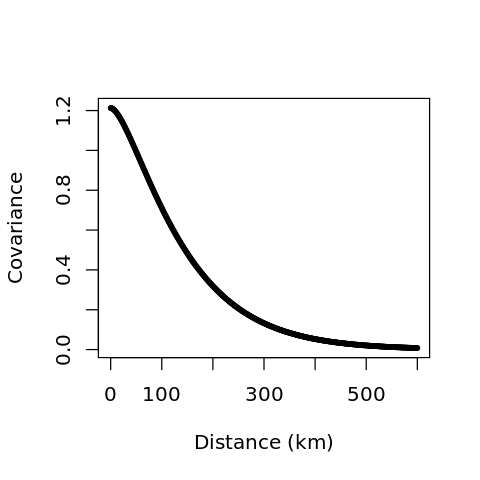

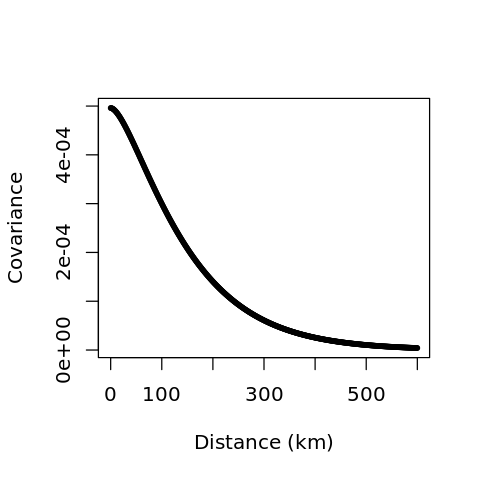

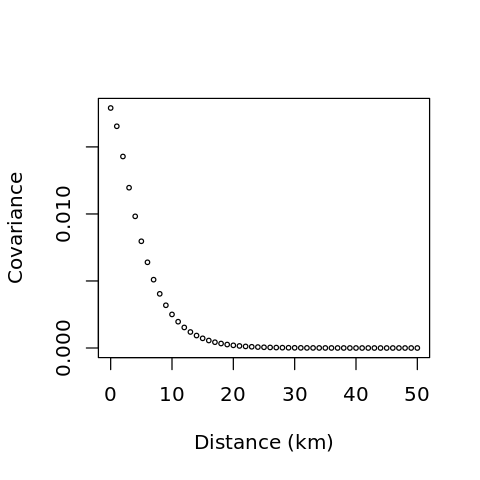

In [17]:
# Let's also plot the corelation vs. distance and covariance vs. distance for alpha.spat to see how the spatial process decays with distance. 
options(repr.plot.width=4, repr.plot.height=4)

range = model_fit_v2$summary.hyperpar[2,]$mean / 1000 #posterior expected range in kilometers
dist.seq = 0:600 # and we want a plot for these distance values
smoothness = 1 # We used the default smoothness of 1 for the Matern Covariance in INLA
matern.cor.seq = fields::Matern(d = dist.seq, # Compute and plot the correlations
                                range = range/sqrt(8*smoothness), # This divisor adjusts to the INLA parameterization
                                smoothness = smoothness)
# plot(dist.seq, matern.cor.seq, xlab = "Distance (km)", ylab = "Correlation",cex=0.5)
matern.sd = model_fit_v2$summary.hyperpar[3,]$mean # Compute covariance by multiplying by the variance parameter (SD parameter squared)
plot(dist.seq, matern.cor.seq*matern.sd^2, xlab = "Distance (km)", ylab = "Covariance",cex=0.5)
# TAB =  as.data.frame(cbind(dist.seq,matern.cor.seq*matern.sd^2))
# colnames(TAB) = c("DIST","COV")
# TAB[(TAB$COV > 0.04 & TAB$COV < 0.06 ),]

range = model_fit_v2$summary.hyperpar[4,]$mean / 1000 #posterior expected range in kilometers
dist.seq = 0:600 # and we want a plot for these distance values
smoothness = 1 # We used the default smoothness of 1 for the Matern Covariance in INLA
matern.cor.seq = fields::Matern(d = dist.seq, # Compute and plot the correlations
                                range = range/sqrt(8*smoothness), # This divisor adjusts to the INLA parameterization
                                smoothness = smoothness)
# plot(dist.seq, matern.cor.seq, xlab = "Distance (km)", ylab = "Correlation",cex=0.5)
matern.sd = model_fit_v2$summary.hyperpar[5,]$mean # Compute covariance by multiplying by the variance parameter (SD parameter squared)
plot(dist.seq, matern.cor.seq*matern.sd^2, xlab = "Distance (km)", ylab = "Covariance",cex=0.5)

range = model_fit_v2$summary.hyperpar[6,]$mean / 1000 #posterior expected range in kilometers
dist.seq = 0:50 # and we want a plot for these distance values
smoothness = 1 # We used the default smoothness of 1 for the Matern Covariance in INLA
matern.cor.seq = fields::Matern(d = dist.seq, # Compute and plot the correlations
                                range = range/sqrt(8*smoothness), # This divisor adjusts to the INLA parameterization
                                smoothness = smoothness)
# plot(dist.seq, matern.cor.seq, xlab = "Distance (km)", ylab = "Correlation",cex=0.5)
matern.sd = model_fit_v2$summary.hyperpar[7,]$mean # Compute covariance by multiplying by the variance parameter (SD parameter squared)
plot(dist.seq, matern.cor.seq*matern.sd^2, xlab = "Distance (km)", ylab = "Covariance",cex=0.5)

Warning message:
“plotting the first 9 out of 10 attributes; use max.plot = 10 to plot all”


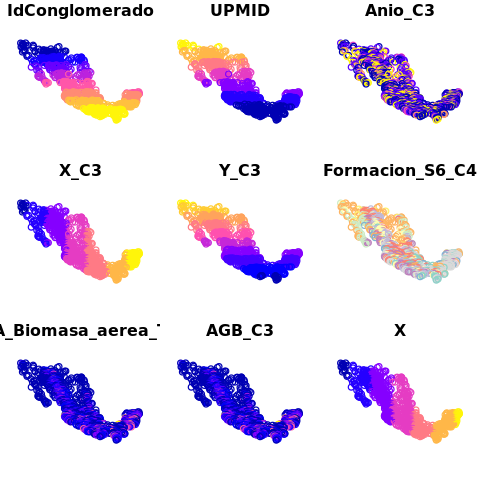

In [55]:
################ IN CASE ONE FORGOT THE SAVE THE TESTING DATASET, USE THIS #####################
# FULL_DATASET <- st_read("/projects/my-public-bucket/Data/NASA_CMS_2023/MEXICO/Daso_A_Cgl_C3_V7_24052022_1.gpkg", quiet = TRUE) %>% st_transform("epsg:6933")
# FULL_DATASET <-  cbind(FULL_DATASET, st_coordinates(FULL_DATASET)) %>% st_drop_geometry()
# loc.plot.TRAINING <- as.data.frame(loc.plot) #%>% st_as_sf(crs = 6933, coords = c("x" = "X1", "y" = "X2"), remove = F) 
# loc.plot.TESTING <- FULL_DATASET[! paste(FULL_DATASET$X, FULL_DATASET$Y) %in% c(paste(loc.plot.TRAINING$X1, loc.plot.TRAINING$X2), paste(loc.plot.TRAINING$X2, loc.plot.TRAINING$X1)), ]
# plot_WGS84_T <- loc.plot.TESTING %>% st_as_sf(crs = 4326, coords = c("x" = "X_C3", "y" = "Y_C3"), remove = F) 
# plot(plot_WGS84_T)

Cannot preload entire working area of 8849227632 cells with max_cells_in_memory = 3e+07. Raster values will be read for each feature individually.



  |======================================================================| 100%


Cannot preload entire working area of 700041580 cells with max_cells_in_memory = 3e+07. Raster values will be read for each feature individually.



  |======================================================================| 100%


Warning message:
“Removed 6 rows containing missing values or values outside the scale range
(`geom_point()`).”
Warning message:
“Removed 1 row containing missing values or values outside the scale range
(`geom_point()`).”


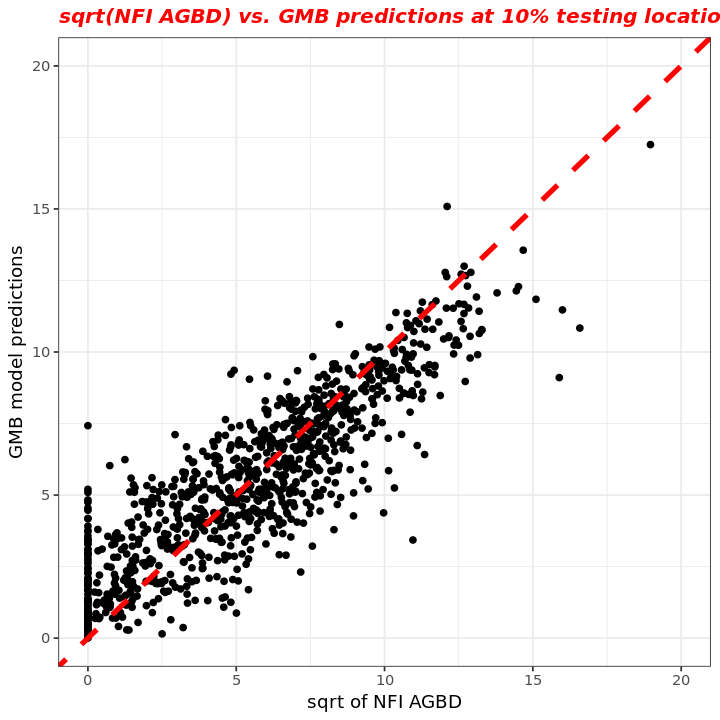

Coordinate system already present. Adding new coordinate system, which will
replace the existing one.


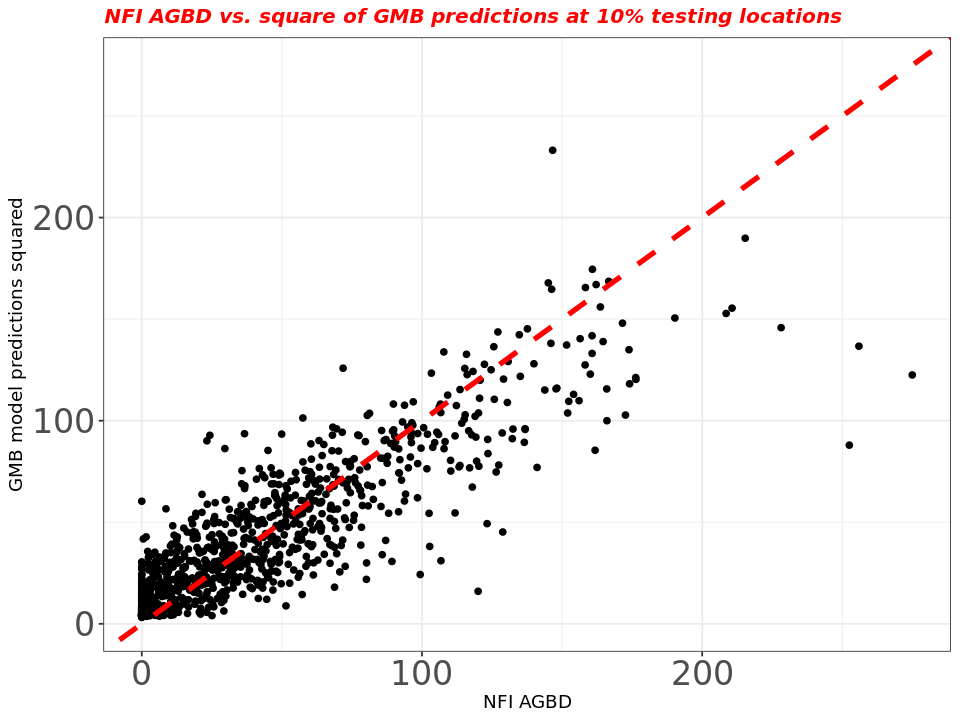

Coordinate system already present. Adding new coordinate system, which will
replace the existing one.


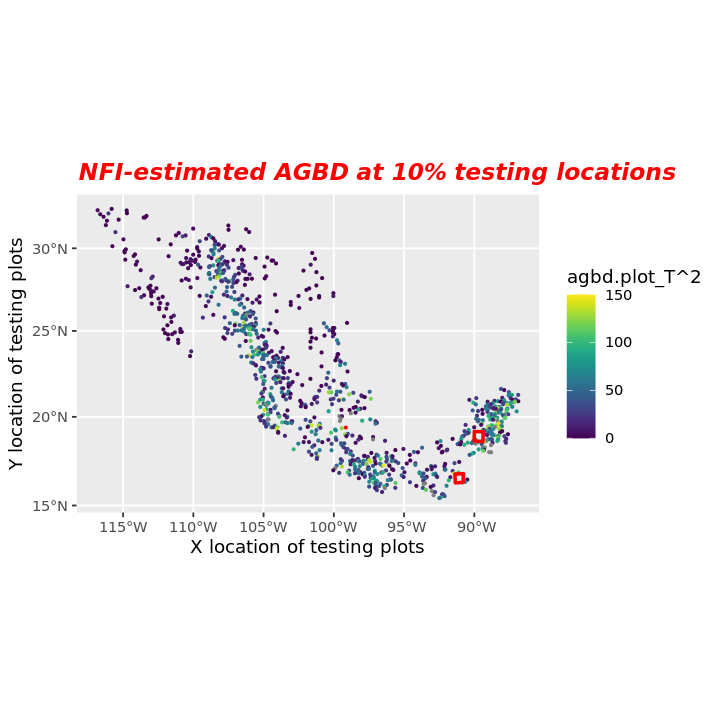

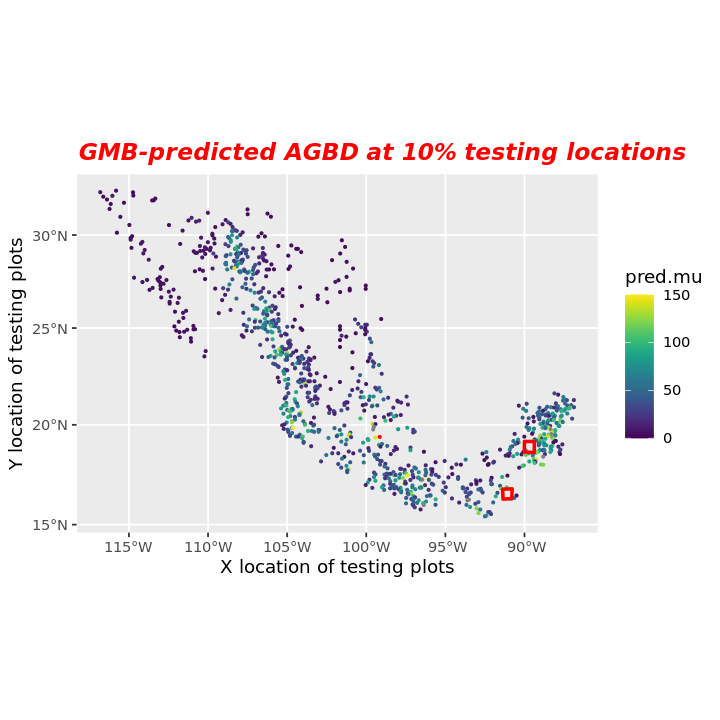

In [48]:
########################## LET'S CHECK HOW OUR MODEL PERFORMS ON OUR "TESTING" NFI LOCATIONS ############

# At the start of this notebook, we had split the NFI data into 90% for training and 10% for testing. In this cell, we 
# see how our model performs in the 10% of testing data. The method to predict AGBD at any location after model-fitting is 
# to draw posterior samples from the distributions of your model parameters and effects. We take a moment to understand this: 

# You draw posterior samples do compute things numerically that would be otherwise difficult to compute. Take this example:
# Let random variable X follow a squared normal distribution, i.e. X = Z^2 where Z is normal with mean \mu and standard deviation \sigma. 
# It's actually not very easy to compute he expected value or standard deviation of X with pencil and paper. 
# But something that would be really easy to do is draw a 1000 random samples from Z, square them (this gives you 1000 random samples from X), 
# and then take the sample mean and sample standard deviation of these samples. This would give you an estimate of these quantities. 
# As you draw more samples, this estimate converges to the true answer. This is the concept of "drawing posterio samples."

# This same reasoning follows for our application. You cant compute with "pencil-and-paper" the mean and standard deviation of AGBD predictions. 
# But you can draw random samples of the required parameters and effects, take the appropriate linear combinations, and then get random samples 
# from our posterior distribution of the AGBD at the prediction locations! The more samples you draw, the more accurately you can compute the 
# mean, std, quantiles, etc. Of course, there are diminishing returns. After you draw 2000 samples, for instance, your answer will essentially 
# be the same as if you drew 10,000 samples.

# When we ask INLA to "draw 250 samples", it draws 250 samples of the spatial effects at each mesh node. For a prediction inside a triangle, it then it linearly 
# interpolates all those 250 samples to get 250 "predictions" for that location. The mean and SD of these 250 predictions will give you the distribution
# of AGBD at each mesh node. 

# Let's start with our plot locations, draw samples from our posterior distributions and predict AGBD at our locations!

plot_T = plot_WGS84_T %>% st_transform("epsg:6933") ### convert testing plot locations to a projected CRS
agbd.plot_T = sqrt(plot_T$AGB_C3) ### get the AGBD estimate at each plot location and square root it
loc.plot_T = st_coordinates(plot_T) ### save the plot location xy coordinates in projected CRS

hei.rast=rast("/projects/my-public-bucket/Data/NASA_CMS_2023/MEXICO/GLAD_FH_mexico_UINT16_C_6399.tif")### Read GLAD FOREST HEIGHT raster, already in projected CRS
hei.pred = exactextractr::exact_extract(hei.rast, st_buffer(plot_T,56.42), 'mean') # Extract pixel values under plot using weighted-mean of area of each pixel
# hei.pred = terra::extract(hei.rast, st_buffer(plot_T,56.42)) ### Extract pixel-level height values at each NFI plot location + 56.42 buffer
# hei.pred = aggregate(x = hei.pred$GLAD_FH_mexico_UINT16_C_6399, by = list(hei.pred$ID), FUN = mean, na.rm=TRUE)[,2] ### Average pixel values per plot

cci.rast=rast("/projects/my-public-bucket/Data/NASA_CMS_2023/MEXICO/cci_mexico_6933.tif") ### Read CCI raster, already in projected CRS
cci.pred = exactextractr::exact_extract(cci.rast, st_buffer(plot_T,56.42), 'mean') # Extract pixel values under plot using weighted-mean of area of each pixel
# cci.pred = terra::extract(cci.rast, st_buffer(plot_T,56.42)) ### Extract CCI pixel-level AGBD values at each NFI plot location + 56.42 buffer
# cci.pred = aggregate(x = cci.pred$cci_mexico, by = list(cci.pred$ID), FUN = mean, na.rm=TRUE)[,2] ### Average pixel values per plot

# Now, we have to draw "posterior samples" from our model results because it is numerically difficult to compute what our model parameters are at any given location. 
# By drawing samples from the model outputs, we are able to describe the expected model outcomes and use them in predicting AGBD at our desired testing plot locations. 

samples = inla.posterior.sample(n = 250, result = model_fit_v2)  ### Draw 2000 samples

# We also need to reconstruct our projector matrix because we now have new plot locations. We use the same mesh (8 km max.edge), and the new 
# plot locations to create the new matrix. 
A.pred = inla.spde.make.A(mesh = mesh, loc = loc.plot_T) 

# # Our prediction function, supplied with both the model parameters and the covariates. 
pred_fun = function(...){
  drop(intercept + 
    cci.pred*cci + 
    hei.pred*hei +
    A.pred%*%alpha.spat[1:k] +  
    Diagonal(x = cci.pred)%*%A.pred%*%beta.spat[1:k] +
    Diagonal(x = hei.pred)%*%A.pred%*%eta.spat[1:k]) + 
    rnorm(nrow(A.pred), sd = sqrt(1/theta[1])) # INLA stores the precision (1/variance) for the random noise in theta[1]. So 1/theta[1] gives you the variance and square-rooting it gives you the sd
}

# Generate prediction samples, i.e. ask INLA to use the prediction function and samples to make predictions at our testing plot locations. 
pred.samples = (inla.posterior.sample.eval(fun = pred_fun,samples = samples)) #

# Model mean AGBD expectations and SD's at the grid locations
pred.mu = Matrix::rowMeans(pred.samples)
pred.sd = apply(pred.samples, 1, sd)

OUTPUT <- do.call(rbind, Map(data.frame, PRED=pred.mu, NFI=agbd.plot_T, PRED.SD=pred.sd, RES=agbd.plot_T-pred.mu))
ggplot(data = OUTPUT, aes(x = NFI,y = PRED))+ geom_point() + geom_abline(size=0.5,linetype=2,col="red",lwd=1.5) + theme_bw() + xlim(0,20) + ylim(0,20) + xlab("sqrt of NFI AGBD") + ylab("GMB model predictions") + ggtitle("sqrt(NFI AGBD) vs. GMB predictions at 10% testing locations") + theme(plot.title = element_text(color="red", size=12, face="bold.italic"))

################## COMPUTE A HEURISTIC FOR ACCURACY, LIKE AN R2 VALUE #############
 # Computing a value like an R^2 for our testing locations will give us an idea of prediction error at unobserved locations

# Let's also square the model expectations because we applied a sqrt transformation at the start
pred.mu = Matrix::rowMeans(pred.samples^2)
pred.sd = apply(pred.samples^2, 1, sd)

OUTPUT <- do.call(rbind, Map(data.frame, PRED=pred.mu, NFI=agbd.plot_T^2, PRED.SD=pred.sd, RES=agbd.plot_T^2-pred.mu))
options(repr.plot.width=8, repr.plot.height=6)
ggplot(data = OUTPUT, aes(x = NFI,y = PRED))+ geom_point()  + geom_abline(size=0.5,linetype=2,col="red",lwd=1.5) + theme_bw() + xlim(0,275) + ylim(0,275) + xlab("NFI AGBD") + ylab("GMB model predictions squared") + ggtitle("NFI AGBD vs. square of GMB predictions at 10% testing locations") + theme(plot.title = element_text(color="red", size=12, face="bold.italic"),axis.text=element_text(size=20))
        
####################### And here are some maps to see what the predictions look like at the plot locations ##########
options(repr.plot.width=6, repr.plot.height=6)
ggplot() + coord_sf(crs = 6933) + 
           geom_point(aes(x = loc.plot_T[,1], y = loc.plot_T[,2], col = agbd.plot_T^2),size=0.5) +  # make a map to see plot locations and the AGBD values at each location
           scale_color_viridis(limits = c(0, 150)) + xlab("X location of testing plots") + ylab("Y location of testing plots") + ggtitle("NFI-estimated AGBD at 10% testing locations") + theme(plot.title = element_text(color="red", size=14, face="bold.italic")) +
           geom_sf(data = Deforestation,col="red",fill=NA,lwd=1)# add our fake deforestation sites

ggplot() + coord_sf(crs = 6933) + 
           geom_point(aes(x = loc.plot_T[,1], y = loc.plot_T[,2], col = pred.mu),size=0.5) +  # make a map to see plot locations and the AGBD values at each location
           scale_color_viridis(limits = c(0, 150)) + xlab("X location of testing plots") + ylab("Y location of testing plots") + ggtitle("GMB-predicted AGBD at 10% testing locations") + theme(plot.title = element_text(color="red", size=14, face="bold.italic")) + 
           geom_sf(data = Deforestation,col="red",fill=NA,lwd=1)# add our fake deforestation sites

In [57]:
######################## HEURISTICS: R2 AND RMSE ###################
R2_backtrans = 1 - (sum((pred.mu - agbd.plot_T^2)^2)/sum((agbd.plot_T^2 - mean(agbd.plot_T^2))^2))
R2_backtrans
RMSE = sqrt(mean((pred.mu - agbd.plot_T^2)^2))
RMSE
mean(pred.mu)
mean(agbd.plot_T^2)


############## RATE OF OVERLAP OF CREDIBILITY INTERVALS ###################
pred.samples[pred.samples < 0] = 0
Q25 <- apply(pred.samples^2, 1, quantile, probs = c(0.025),  na.rm = TRUE)
Q975 <- apply(pred.samples^2, 1, quantile, probs = c(0.975),  na.rm = TRUE)
sum((agbd.plot_T^2 >= Q25) & (agbd.plot_T^2 <= Q975))/length(agbd.plot_T^2)
 
Q25 <- apply(pred.samples^2, 1, quantile, probs = c(0.025),  na.rm = TRUE)
Q975 <- apply(pred.samples^2, 1, quantile, probs = c(0.975),  na.rm = TRUE)
AGBD <- agbd.plot_T^2
Q25 <- Q25[AGBD > 100]
Q975 <- Q975[AGBD > 100]
AGBD <- AGBD[AGBD > 100]
sum((AGBD >= Q25) & (AGBD <= Q975))/length(AGBD)

[1] 0.7714384

[1] 21.73322

[1] 42.06575

[1] 41.84345

[1] 0.9658291

[1] 0.9189189

## MAKING PREDICTIONS USING OUR MODEL RESULTS ########################################

Once we have settled on the model to be used, our next task to is use the model to make predictions of AGBD in at any location or over any arbitrary area. 

In the following cells, we demonstrate numerous such applications. At the start, we read our saved model, recreate our mesh (in case it was not already saved) 
and then begin the predictions. 


In [3]:
######################### READ THE SAVED MODEL ######################

#### LOAD THE DATA USED TO MAKE THE MODEL ######
mexico = st_read("/projects/my-public-bucket/Data/NASA_CMS_2023/MEXICO/ecort08gw_DESECON1_DISS.gpkg", quiet = TRUE) %>% st_union() %>% st_transform(crs = 6933) # Provided by CONAFOR and converted to a projected CRS so we can work in units of meters
Deforestation = st_read("/projects/my-public-bucket/Data/NASA_CMS_2023/MEXICO/MEX_deforestation.gpkg", quiet = TRUE) %>% st_transform(crs = 6933)  # Regions of deforestation.  
DATA <- read.csv("/projects/my-public-bucket/Data/NASA_CMS_2023/MEXICO/NFI_CCI_GEDIheights.csv") #Read the saved data
cci.plot <- DATA$cci.plot
hei.plot <- DATA$hei.plot
loc.plot <- data.frame(matrix(ncol = 2, nrow = length(hei.plot))) # Just create empty list to populated with saved NFI xy locations
loc.plot[,1] <- DATA$X
loc.plot[,2] <- DATA$X.1
agbd.plot <- sqrt(DATA$agbd.plot)
loc.plot <- data.matrix(loc.plot)

###### REMAKE THE MESH IN CASE IT IS NOT STORED IN MEMORY ######
max.edge = 10*10^3
mexico.buffer = st_buffer(mexico, dist = max.edge*5) # We also make a 5 km buffer around Mexico to prevent boundary effects.
mesh = inla.mesh.2d(boundary = list(as(mexico, "Spatial"), as(mexico.buffer, "Spatial")), max.edge = c(max.edge, 3*max.edge), cutoff = 2*max.edge/3, offset = c(max.edge, 5*max.edge)) 
k = mesh$n ### This is the resulting number of vertices
A.plot = inla.spde.make.A(mesh = mesh, loc = loc.plot)

##### LOAD THE MODEL RESULTS ####
load("/projects/ADE_biomass_harmonization/biomass_harmonization/NASA_CMS_2023/Mexico/INLA_model_fit_v2.RData")

#### LOAD AN URBAN MASK AND PROBABILITY OF FOREST MASK FOR MEXICO ####
URBAN = st_read("/projects/my-public-bucket/Data/NASA_CMS_2023/MEXICO/MGN2020_INEGI_Urban_Mex_mask_DISS.gpkg",quiet=TRUE)
FNF = rast("/projects/my-public-bucket/Data/NASA_CMS_2023/MEXICO/All_Products_Comp_Over30_Binary_6933.tif")

Cannot preload entire working area of 9385516650 cells with max_cells_in_memory = 3e+07. Raster values will be read for each feature individually.



  |======================================================================| 100%


Cannot preload entire working area of 742422165 cells with max_cells_in_memory = 3e+07. Raster values will be read for each feature individually.



  |======================================================================| 100%


Warning message:
“Removed 70 rows containing missing values (`geom_point()`).”


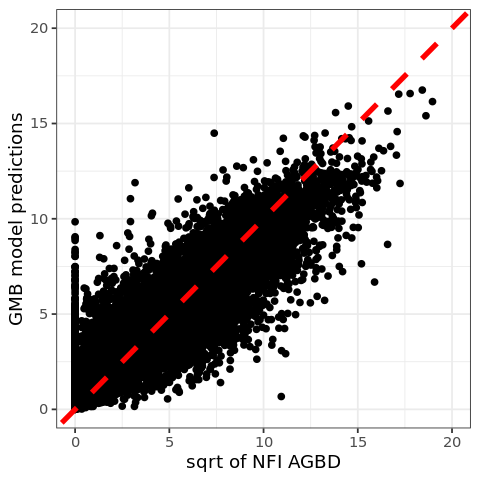

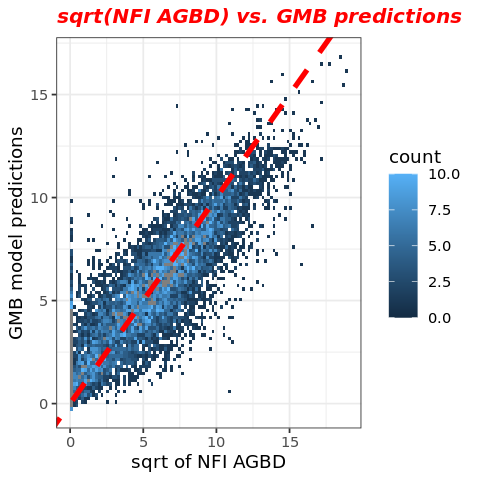

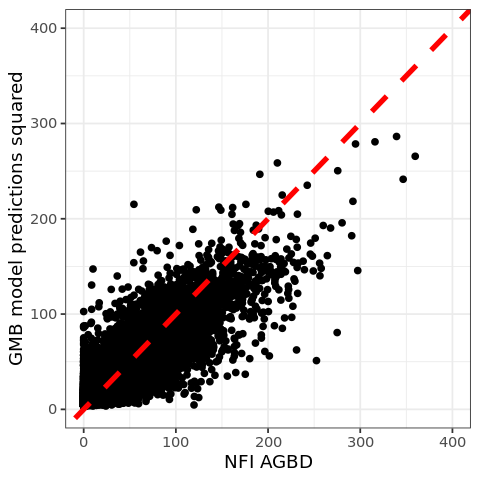

Coordinate system already present. Adding new coordinate system, which will
replace the existing one.


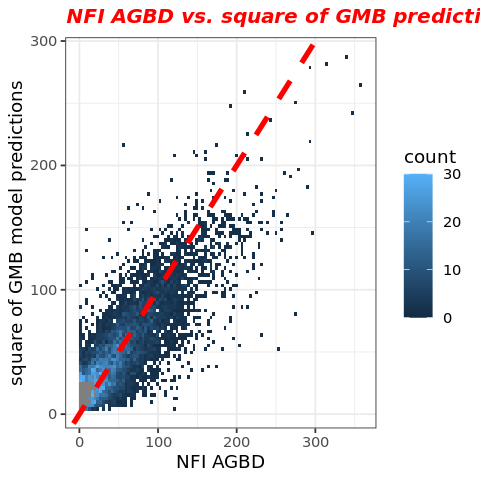

Coordinate system already present. Adding new coordinate system, which will
replace the existing one.


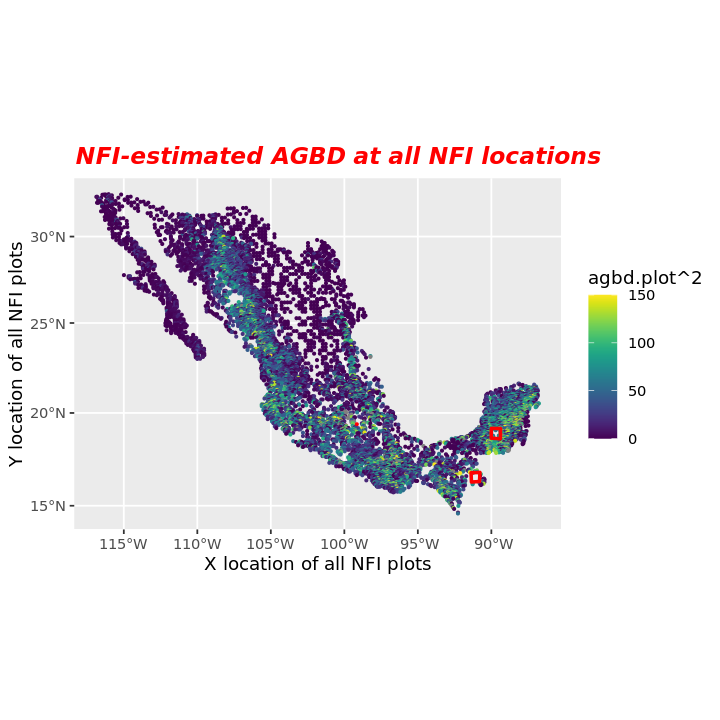

[1] 0.7297557

[1] 23.18282

[1] 42.08326

[1] 41.88522

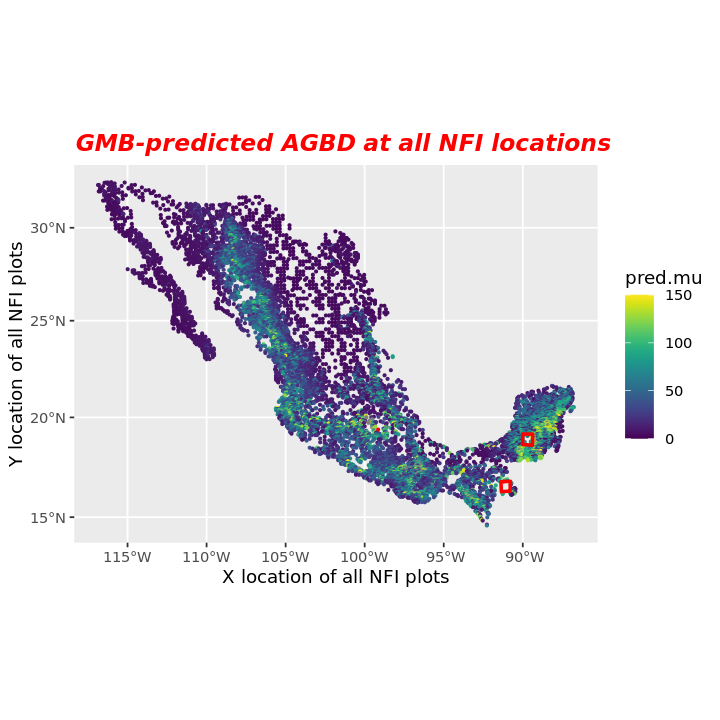

In [36]:
########################## LET'S CHECK HOW OUR MODEL PERFORMS AT ALL NFI LOCATIONS (TESTING AND TRAINING) ##################
options(repr.plot.width=4, repr.plot.height=4)

# Just to get a complete picture, we revert back to our whole dataset (including the 90% training and 10% testing data) and predict AGBD. 

plot_WGS84 <- st_read("/projects/my-public-bucket/Data/NASA_CMS_2023/MEXICO/Daso_A_Cgl_C3_V7_24052022_1.gpkg", quiet = TRUE)
loc.plot.WGS84 <- st_coordinates(plot_WGS84)  ### get the plot locations in WGS84
plot = plot_WGS84 %>% st_transform("epsg:6933") ### convert them to a projected CRS
agbd.plot = sqrt(plot$AGB_C3) ### get the AGBD estimate at each plot location and square root it
loc.plot = st_coordinates(plot) ### save the plot location xy coordinates in projected CRS

hei.rast=rast("/projects/my-public-bucket/Data/NASA_CMS_2023/MEXICO/GLAD_FH_mexico_UINT16_C_6399.tif")### Read GLAD FOREST HEIGHT raster, already in projected CRS
hei.pred = exactextractr::exact_extract(hei.rast, st_buffer(plot,56.42), 'mean') # Extract pixel values under plot using weighted-mean of area of each pixel

cci.rast=rast("/projects/my-public-bucket/Data/NASA_CMS_2023/MEXICO/cci_mexico_6933.tif") ### Read CCI raster, already in projected CRS
cci.pred = exactextractr::exact_extract(cci.rast, st_buffer(plot,56.42), 'mean') # Extract pixel values under plot using weighted-mean of area of each pixel

samples = inla.posterior.sample(n = 250, result = model_fit_v2)
A.pred = inla.spde.make.A(mesh = mesh, loc = loc.plot) 

# # Our prediction equation. 
pred_fun = function(...){
  drop(intercept + 
    cci.pred*cci + 
    hei.pred*hei +
    A.pred%*%alpha.spat[1:k] +   
    Diagonal(x = cci.pred)%*%A.pred%*%beta.spat[1:k] +
    Diagonal(x = hei.pred)%*%A.pred%*%eta.spat[1:k]) + 
    rnorm(nrow(A.pred), sd = sqrt(1/theta[1])) 
}

# Generate prediction samples. Using the 250 drawn samples, we make 250 predictions of AGBD at each location. 
pred.samples = (inla.posterior.sample.eval(fun = pred_fun,samples = samples))
pred.samples[pred.samples < 0] = 0

# Model mean AGBD expectations and SD's at the grid locations
pred.mu = Matrix::rowMeans(pred.samples)
pred.sd = apply(pred.samples, 1, sd)

OUTPUT <- do.call(rbind, Map(data.frame, PRED=pred.mu, NFI=agbd.plot, PRED.SD=pred.sd, RES=agbd.plot-pred.mu))
ggplot(data = OUTPUT, aes(x = NFI,y = PRED))+ geom_point() + geom_abline(size=0.5,linetype=2,col="red",lwd=1.5) + theme_bw() + xlim(0,20) + ylim(0,20) + xlab("sqrt of NFI AGBD") + ylab("GMB model predictions")

ggplot(data = OUTPUT, aes(x = NFI,y = PRED)) +
  geom_bin2d(bins = 100) + geom_abline(size=0.5,linetype=2,col="red",lwd=1.5) +
  scale_fill_gradient(limits = c(0, 10)) + xlab("sqrt of NFI AGBD") + ylab("GMB model predictions") + ggtitle("sqrt(NFI AGBD) vs. GMB predictions") +
  theme_bw() + theme(plot.title = element_text(color="red", size=12, face="bold.italic"))

# Let's also square the model expectations because we applied a sqrt transformation at the start
pred.mu = Matrix::rowMeans(pred.samples^2)
pred.sd = apply(pred.samples^2, 1, sd)

OUTPUT <- do.call(rbind, Map(data.frame, PRED=pred.mu, NFI=agbd.plot^2, PRED.SD=pred.sd, RES=agbd.plot^2-pred.mu))
ggplot(data = OUTPUT, aes(x = NFI,y = PRED))+ geom_point()  + geom_abline(size=0.5,linetype=2,col="red",lwd=1.5) + theme_bw() + xlim(0,400) + ylim(0,400) + xlab("NFI AGBD") + ylab("GMB model predictions squared")

ggplot(data = OUTPUT, aes(x = NFI,y = PRED)) +
  geom_bin2d(bins = 100) + geom_abline(size=0.5,linetype=2,col="red",lwd=1.5) +
  scale_fill_gradient(limits = c(0, 30)) + xlab("NFI AGBD") + ylab("square of GMB model predictions") + ggtitle("NFI AGBD vs. square of GMB predictions") +
  theme_bw() + theme(plot.title = element_text(color="red", size=12, face="bold.italic"))

####################### And here are some maps to see what the results look like ##########
options(repr.plot.width=6, repr.plot.height=6)
ggplot() + coord_sf(crs = 6933) + 
           geom_point(aes(x = loc.plot[,1], y = loc.plot[,2], col = agbd.plot^2),size=0.5) +  # make a map to see plot locations and the AGBD values at each location
           scale_color_viridis(limits = c(0, 150)) + xlab("X location of all NFI plots") + ylab("Y location of all NFI plots") + ggtitle("NFI-estimated AGBD at all NFI locations") + theme(plot.title = element_text(color="red", size=14, face="bold.italic")) +
           geom_sf(data = Deforestation,col="red",fill=NA,lwd=1)# add our fake deforestation sites

ggplot() + coord_sf(crs = 6933) + 
           geom_point(aes(x = loc.plot[,1], y = loc.plot[,2], col = pred.mu),size=0.5) +  # make a map to see plot locations and the AGBD values at each location
           scale_color_viridis(limits = c(0, 150)) + xlab("X location of all NFI plots") + ylab("Y location of all NFI plots") + ggtitle("GMB-predicted AGBD at all NFI locations") + theme(plot.title = element_text(color="red", size=14, face="bold.italic")) +
           geom_sf(data = Deforestation,col="red",fill=NA,lwd=1)# add our fake deforestation sites

######## Save the pred.samples output, because the predictions per column will be needed for stratum-wise or a country-wide AGBD SD estimate ############
NFI.pred.samples = cbind(pred.samples^2,loc.plot[,1],loc.plot[,2])

######################## HEURISTICS: R2 AND RMSE ###################
R2_backtrans = 1 - (sum((pred.mu - agbd.plot^2)^2)/sum((agbd.plot^2 - mean(agbd.plot^2))^2))
R2_backtrans
RMSE = sqrt(mean((pred.mu - agbd.plot^2)^2))
RMSE
mean(pred.mu)
mean(agbd.plot^2)

Saving 6.67 x 6.67 in image


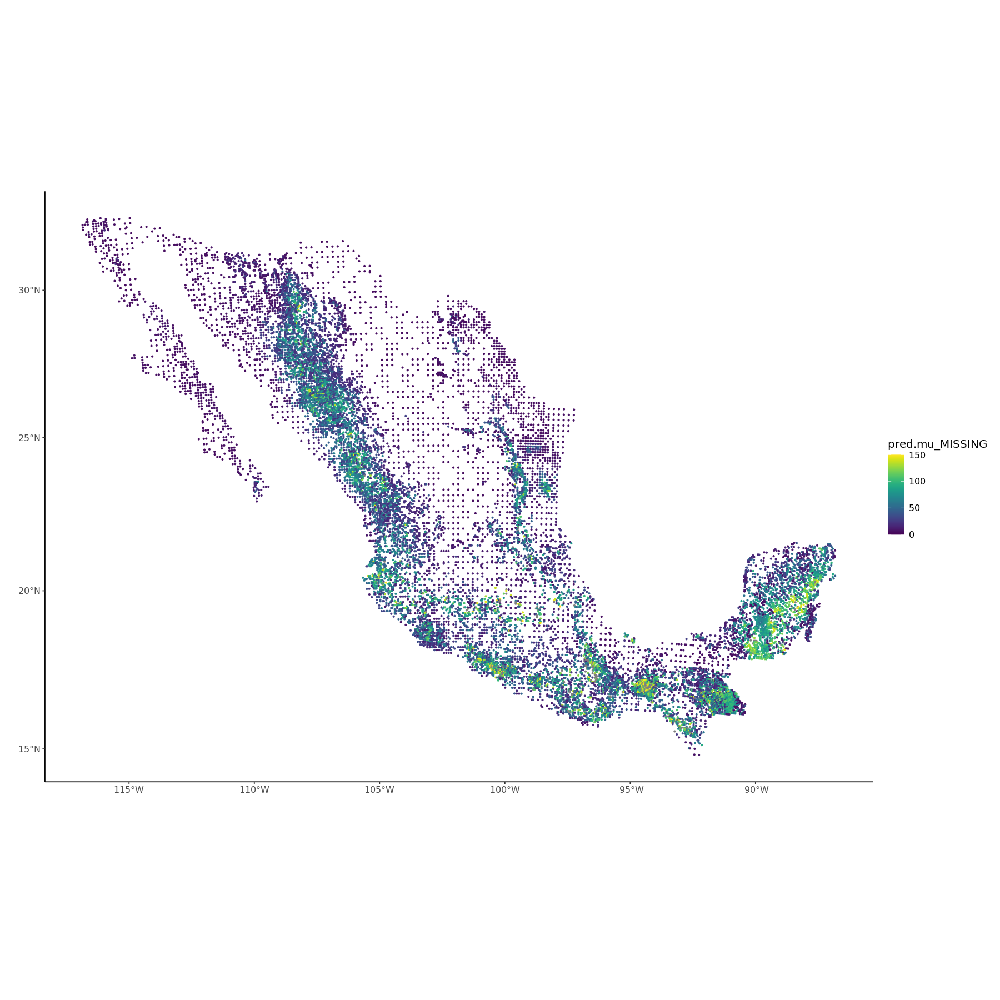

Saving 6.67 x 6.67 in image


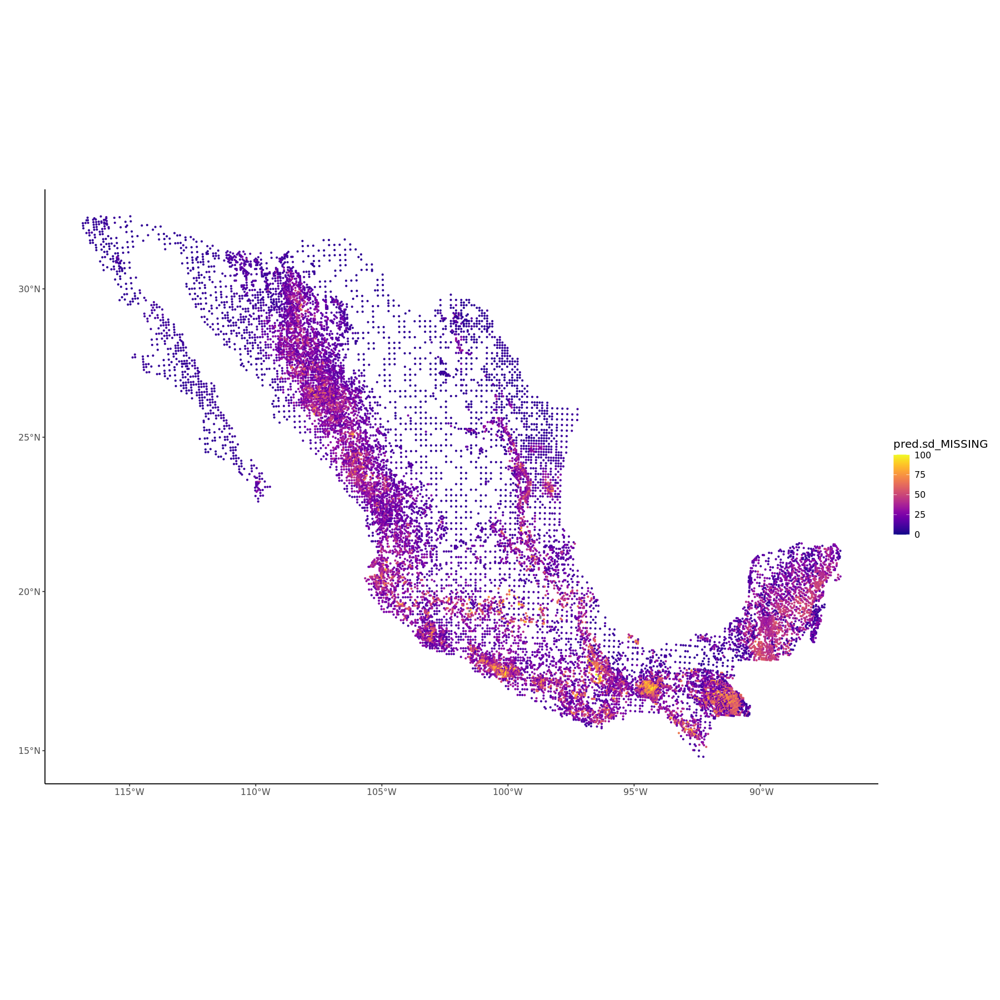

In [25]:
########################## LET'S GAP-FILL MEXICO's LOCATIONS WHERE MEXICO'S THIRD NFI IS INCOMPLETE ##################

# Mexico's third NFI cycle was incomplete due to several accessibility and funding issues. 
# We know the locations at which plots should have been measured, and can use our model to predict AGBD at those locations

# options(repr.plot.width=15, repr.plot.height=15)
# hei.rast=rast("/projects/my-public-bucket/Data/NASA_CMS_2023/MEXICO/GLAD_FH_mexico_UINT16_C_6399.tif")### Read GLAD FOREST HEIGHT raster, already in projected CRS
# cci.rast=rast("/projects/my-public-bucket/Data/NASA_CMS_2023/MEXICO/cci_mexico_6933.tif") ### Read CCI raster, already in projected CRS

# # Read the locations where plots were not measured
# MISSING_plot_WGS84 <- st_read("/projects/my-public-bucket/Data/NASA_CMS_2023/MEXICO/MISSING_Coordenades_INFyS_2y3_conafor.gpkg", quiet = TRUE)
# MISSING.loc.plot.WGS84 <- st_coordinates(MISSING_plot_WGS84)  ### get the plot locations in WGS84
# MISSING.plot = MISSING_plot_WGS84 %>% st_transform("epsg:6933") ### convert them to a projected CRS
# MISSING.loc.plot = st_coordinates(MISSING.plot) ### save the plot location xy coordinates in projected CRS

# # # We'll need our covariate values at the grid locations
# hei.rast=rast("/projects/my-public-bucket/Data/NASA_CMS_2023/MEXICO/GLAD_FH_mexico_UINT16_C_6399.tif")### Read GLAD FOREST HEIGHT raster, already in projected CRS
# hei.pred = exactextractr::exact_extract(hei.rast, st_buffer(MISSING.plot,56.42), 'mean') # Extract pixel values under plot using weighted-mean of area of each pixel

# cci.rast=rast("/projects/my-public-bucket/Data/NASA_CMS_2023/MEXICO/cci_mexico_6933.tif") ### Read CCI raster, already in projected CRS
# cci.pred = exactextractr::exact_extract(cci.rast, st_buffer(MISSING.plot,56.42), 'mean') # Extract pixel values under plot using weighted-mean of area of each pixel

# samples = inla.posterior.sample(n = 1000, result = model_fit_v2) # Draw posterior samples from our model fit 
# A.pred = inla.spde.make.A(mesh = mesh, loc = MISSING.loc.plot) # Make a new projector matrix with the same mesh, but new plot locations 

# # Our model function
# pred_fun = function(...){
#   drop(intercept + 
#     cci.pred*cci + 
#     hei.pred*hei +
#     A.pred%*%alpha.spat[1:k] +   
#     Diagonal(x = cci.pred)%*%A.pred%*%beta.spat[1:k] +
#     Diagonal(x = hei.pred)%*%A.pred%*%eta.spat[1:k]) + 
#     rnorm(nrow(A.pred), sd = sqrt(1/theta[1])) 
# }

# # # Generate prediction samples
# pred.samples = (inla.posterior.sample.eval(fun = pred_fun, samples = samples))
# pred.samples[pred.samples < 0] = 0

# # # Model expectations and SD's at the grid locations
# pred.mu_MISSING = Matrix::rowMeans(pred.samples^2) # Mean AGBD values at each grid center
# pred.sd_MISSING = apply(pred.samples^2, 1, sd) # SD of AGBD at each grid center

# # ggplot() + coord_sf(crs = 6933) + 
# #            geom_point(aes(x = MISSING.loc.plot[,1], y = MISSING.loc.plot[,2], col = pred.mu_MISSING),size=0.5) +  # make a map to see plot locations and the AGBD values at each location
# #            scale_color_viridis(limits = c(0, 150)) + xlab("X location of missing NFI plots") + ylab("Y location of missing NFI plots") + ggtitle("GMB-predicted AGBD at missing NFI locations") + theme(plot.title = element_text(color="red", size=14, face="bold.italic")) + 

# # ggplot() + coord_sf(crs = 6933) + 
# #            geom_point(aes(x = MISSING.loc.plot[,1], y = MISSING.loc.plot[,2], col = pred.sd_MISSING),size=0.5) +  # make a map to see plot locations and SD of AGBD values at each location
# #            scale_color_viridis(limits = c(0, 100)) + xlab("X location of missing NFI plots") + ylab("Y location of missing NFI plots") + ggtitle("SD of GMB-predicted AGBD at missing NFI locations") + theme(plot.title = element_text(color="red", size=14, face="bold.italic")) + 

# ######## Save the pred.samples output, because it will be needed for stratum-wise or country-wide AGBD estimates ############
# MISSING_NFI.pred.samples = cbind(pred.samples^2,MISSING.loc.plot[,1],MISSING.loc.plot[,2])

ggplot() + coord_sf(crs = 6933) + 
           geom_point(aes(x = MISSING.loc.plot[,1], y = MISSING.loc.plot[,2], col = pred.mu_MISSING),size=0.5) +  # make a map to see plot locations and the AGBD values at each location
           scale_color_viridis(limits = c(0, 150)) + xlab("") + ylab("") + theme(text = element_text(size = 12),plot.title = element_text(color="red", size=12, face="bold.italic"),panel.grid.major = element_blank(), panel.grid.minor = element_blank(),panel.background = element_blank(), axis.line = element_line(colour = "black"))
ggsave("/projects/my-public-bucket/Data/NASA_CMS_2023/MEXICO/MISSING_NFI_MEAN.png",plot = last_plot(),scale = 1,dpi = 400)

ggplot() + coord_sf(crs = 6933) + 
           geom_point(aes(x = MISSING.loc.plot[,1], y = MISSING.loc.plot[,2], col = pred.sd_MISSING),size=0.5) +  # make a map to see plot locations and SD of AGBD values at each location
           scale_color_viridis(option="plasma",limits = c(0, 100)) +     xlab("") + ylab("") + theme(text = element_text(size = 12),plot.title = element_text(color="red", size=12, face="bold.italic"),panel.grid.major = element_blank(), panel.grid.minor = element_blank(),panel.background = element_blank(), axis.line = element_line(colour = "black"))
ggsave("/projects/my-public-bucket/Data/NASA_CMS_2023/MEXICO/MISSING_NFI_SD.png",plot = last_plot(),scale = 1,dpi = 400)

In [29]:
p <- pred.samples
r <- Matrix::rowMeans(pred.samples)
length(r[r<=0])/length(r)

[1] 0.004746115

#### LET'S USE OUR GMB TO PREDICT AGBD IN ALL DESECON STRATA OF MEXICO 

For the following, there are two options: 

(1) We use the exisiting NFI plots and the missing NFI plot locations, make predictions at all of them, and find the mean and assocaited uncertainty. 

(2) We generate our own grid, which can be denser than the NFI, and make predictions at all our densely-located grid locations. 

Let's try both, and compare the results! 

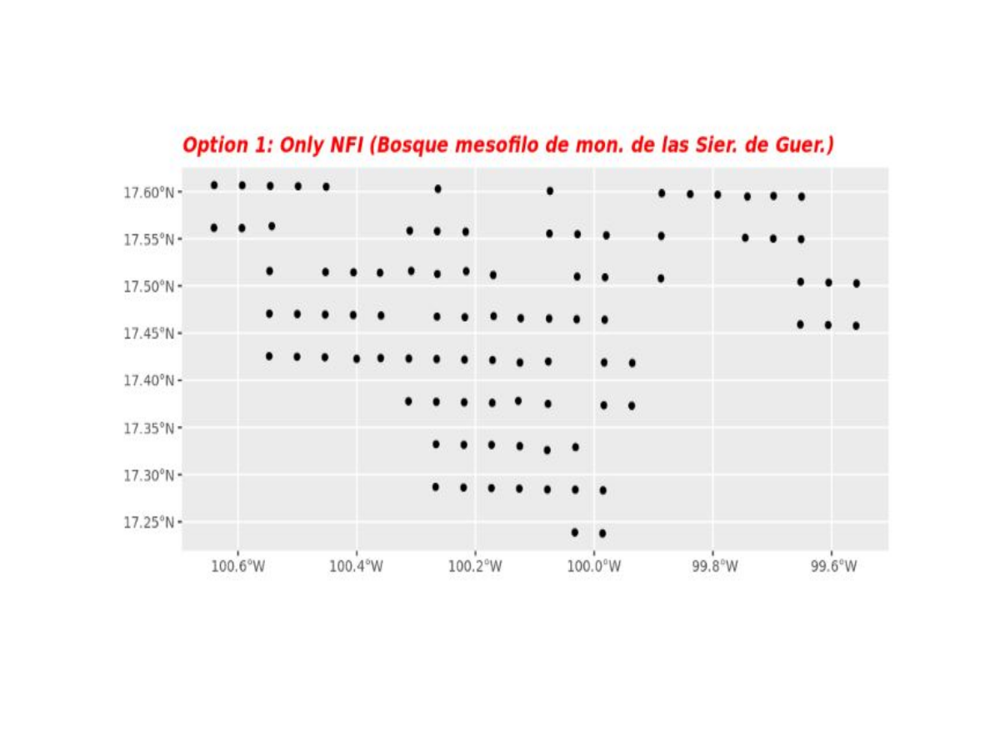

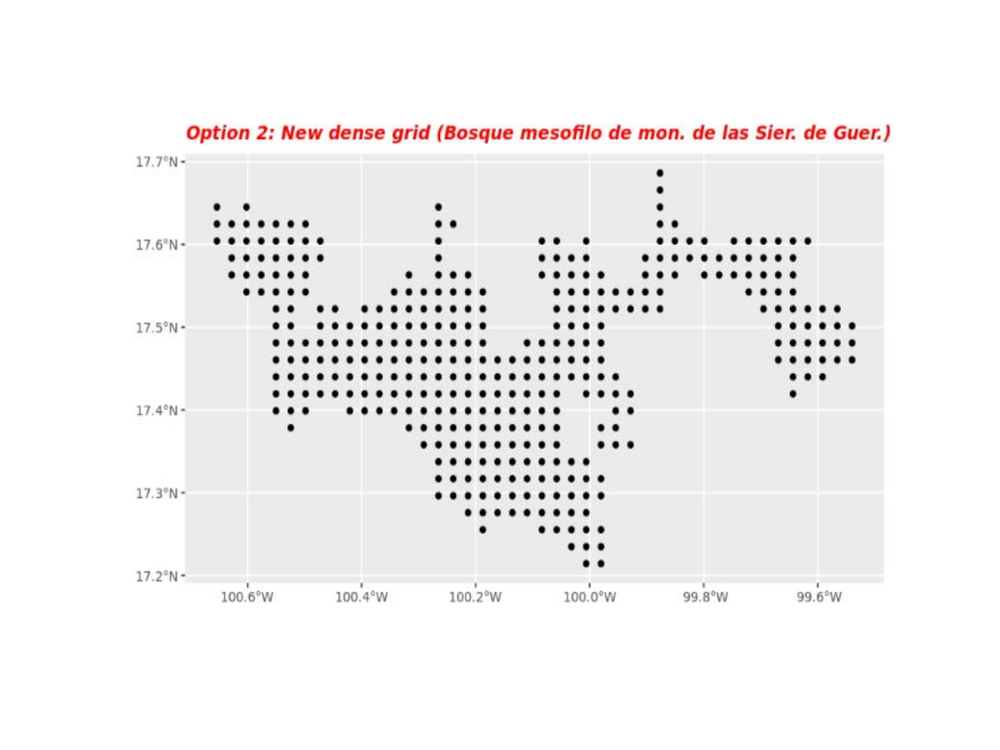

In [38]:
########### See the images below to visually understand the two options before proceeding #################

options(repr.plot.width=10, repr.plot.height=7.5)
# ggplot()+geom_sf(data=st_intersection(ALL.SAMPLE.PREDICTIONS,DESECON_SELECTED) %>% dplyr::select(contains('sample.')))+ggtitle("Option 1: Only NFI (Bosque mesofilo de mon. de las Sier. de Guer.)") + theme(plot.title = element_text(color="red", size=12, face="bold.italic"))
# hist(Matrix::rowMeans(DESECON_samples))
# ggplot()+geom_sf(data=grid_to_predict) +ggtitle("Option 2: New dense grid (Bosque mesofilo de mon. de las Sier. de Guer.)") + theme(plot.title = element_text(color="red", size=12, face="bold.italic"))
# hist(rowMeans(pred.samples^2, na.rm = T))

Example_NFI_grid <- readJPEG("/projects/ADE_biomass_harmonization/biomass_harmonization/NASA_CMS_2023/Mexico/NFI_grid_zoom.JPG",native=TRUE)
plot(0:1,0:1,type="n",ann=FALSE,axes=FALSE)
rasterImage(Example_NFI_grid,0,0,1,1)

Example_Dense_grid <- readJPEG("/projects/ADE_biomass_harmonization/biomass_harmonization/NASA_CMS_2023/Mexico/Dense_grid_zoom.JPG",native=TRUE)
plot(0:1,0:1,type="n",ann=FALSE,axes=FALSE)
rasterImage(Example_Dense_grid,0,0,1,1)

Saving 6.67 x 6.67 in image


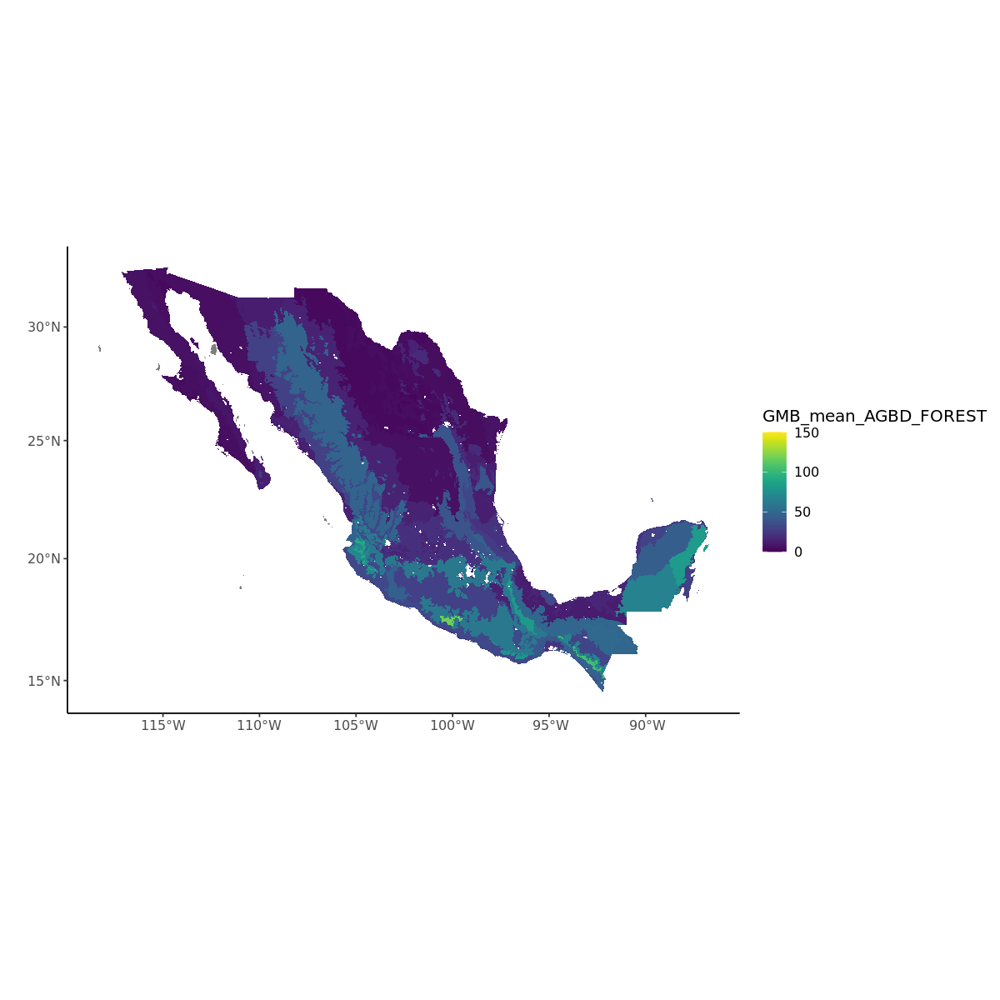

Saving 6.67 x 6.67 in image


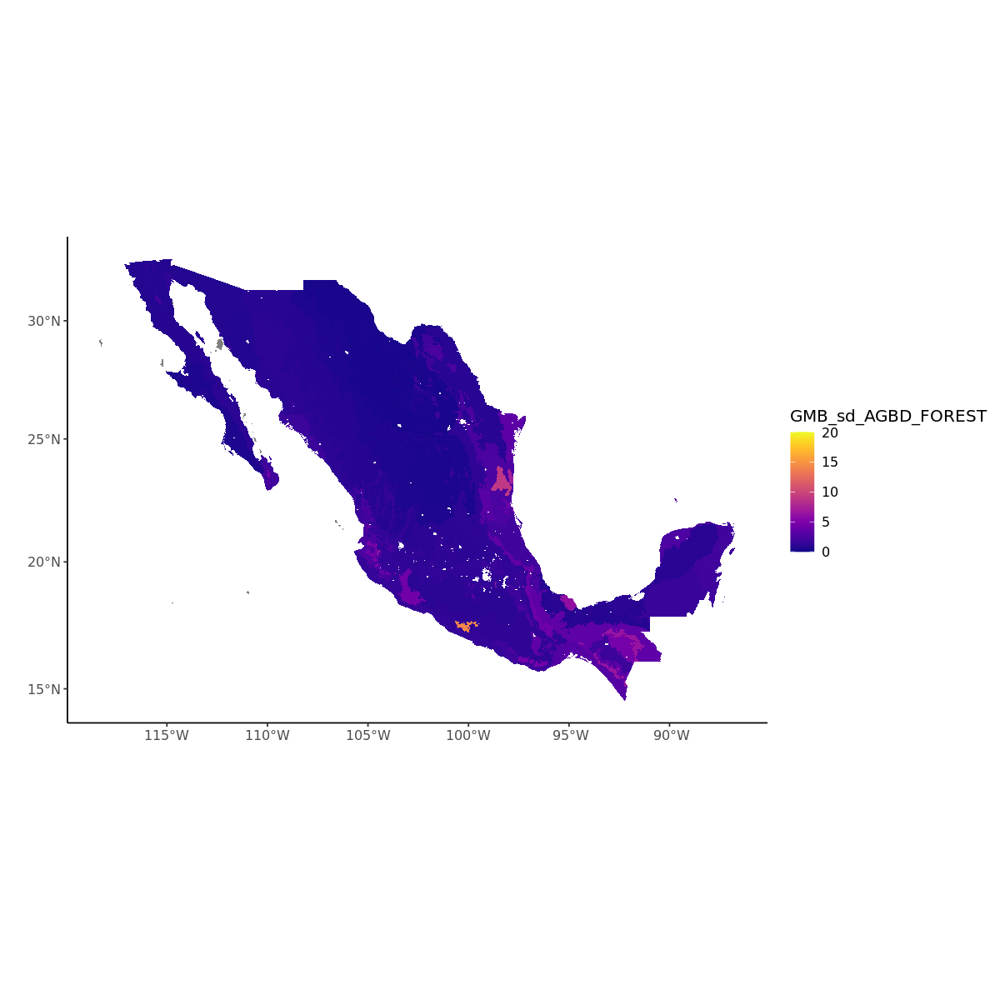

Saving 6.67 x 6.67 in image


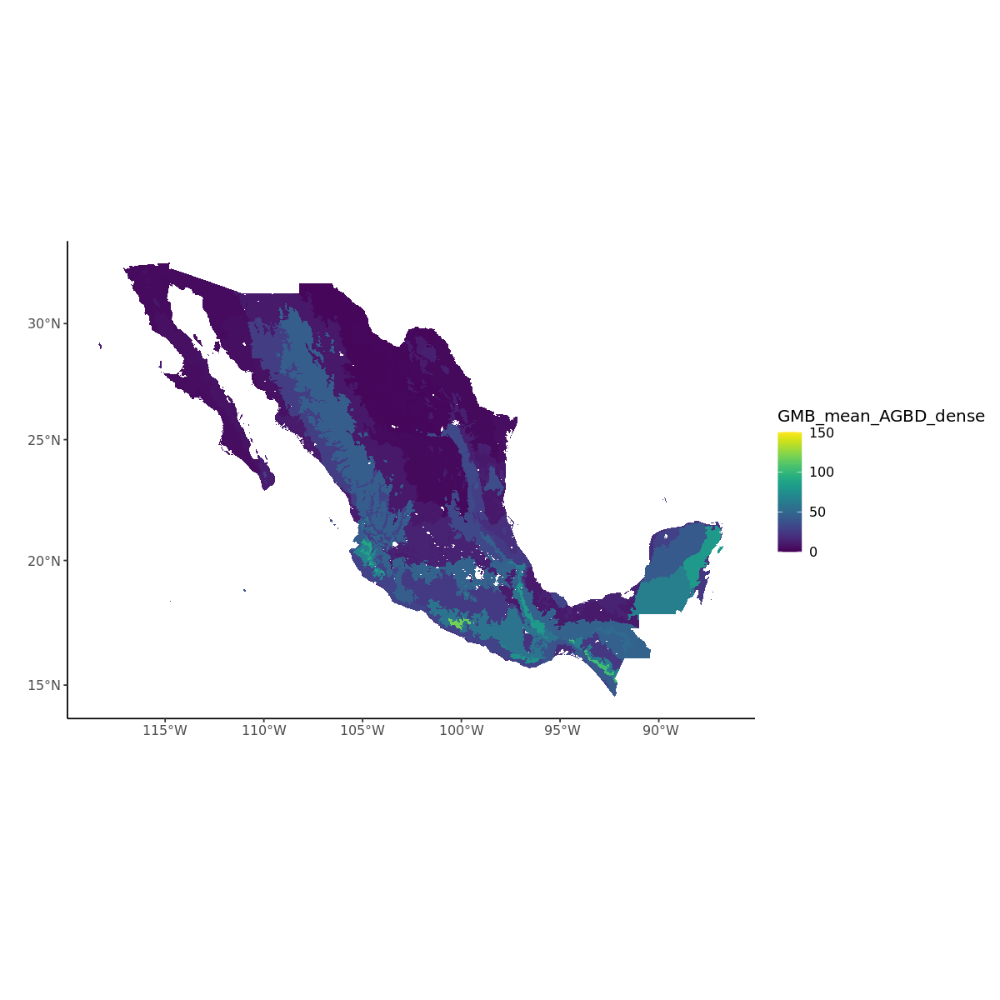

Saving 6.67 x 6.67 in image


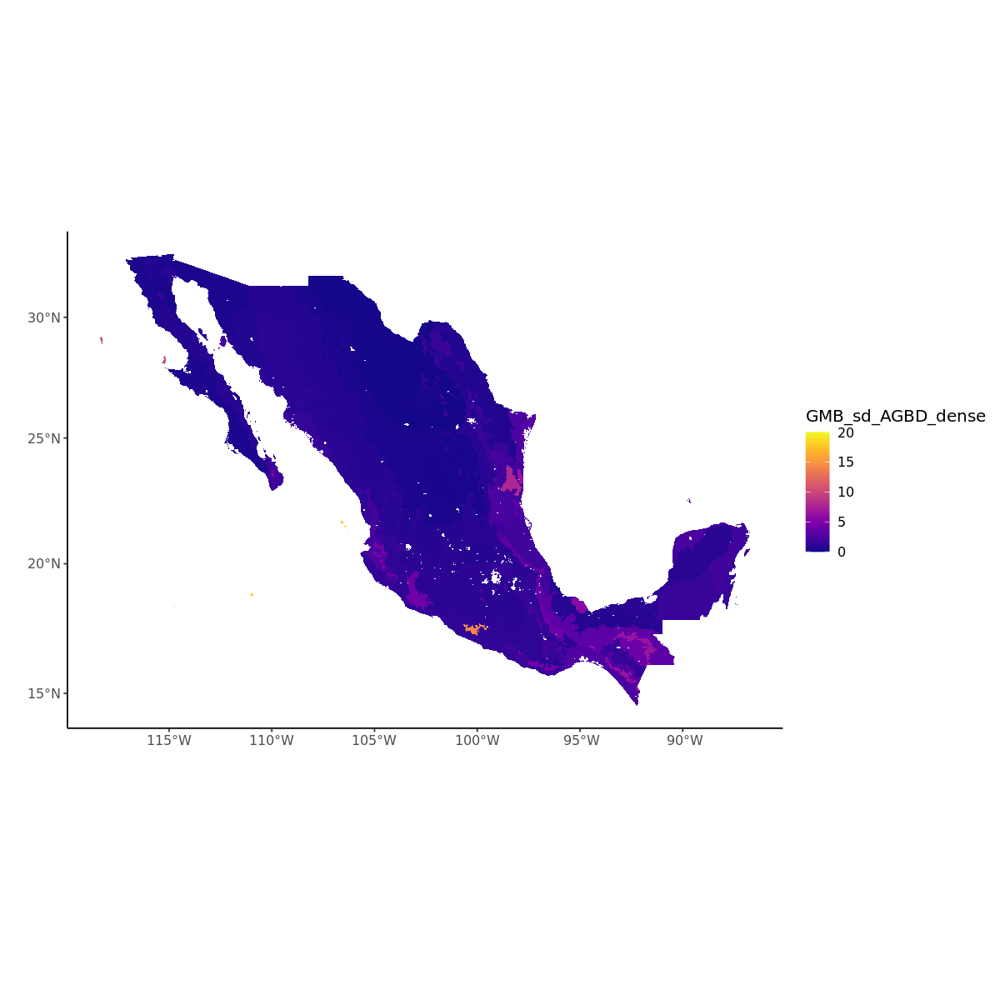

In [15]:
# ### FIRST, READ THE MEXICAN DESECON POLYGONS
options(repr.plot.width=10, repr.plot.height=10)
options(warn = -1) # supress warnings

# hei.rast=rast("/projects/my-public-bucket/Data/NASA_CMS_2023/MEXICO/GLAD_FH_mexico_UINT16_C_6399.tif")### Read GLAD FOREST HEIGHT raster, already in projected CRS
# cci.rast=rast("/projects/my-public-bucket/Data/NASA_CMS_2023/MEXICO/cci_mexico_6933.tif") ### Read CCI raster, already in projected CRS

# #### CONAFOR:Please apply the following urban mask: https://www.inegi.org.mx/app/biblioteca/ficha.html?upc=889463807469

# DESECON = st_read("/projects/my-public-bucket/Data/NASA_CMS_2023/MEXICO/ecort08gw_DESECON4_DISS.gpkg", quiet = TRUE) %>% st_transform(crs = 6933) # Provided by CONAFOR and converted to a projected CRS so we can work in units of meters
# DESECON <- st_difference(DESECON, URBAN) # Remove urban areas by cutting them out from the shapefile 

# # #### SECOND, MERGE OUR PREDICTIONS AT NFI PLOTS AND MISSING NFI PLOTS
# # ## Merge locations of NFI plots and missing NFI plots, and our GMP predictions at both
# # NFI.predictions = cbind(loc.plot[,1],loc.plot[,2],pred.mu)
# # MISSING.predictions = cbind(MISSING.loc.plot[,1],MISSING.loc.plot[,2],pred.mu_MISSING)
# # ALL.NFI.PREDICTIONS <- as.data.frame(rbind(NFI.predictions,MISSING.predictions))
# # colnames(ALL.NFI.PREDICTIONS) <- c("X","Y","pred.mu")
# # ALL.NFI.PREDICTIONS <- st_as_sf(x = ALL.NFI.PREDICTIONS, coords = c("X", "Y"), crs = '+proj=cea +lat_ts=30 +lon_0=0 +x_0=0 +y_0=0 +datum=WGS84 +units=m +no_defs')

# # #### THIRD, MERGE THE SAMPLES WE HAD SAVED SO WE CAN GET THE STANDARD DEVIATION OF POSTERIOR SAMPLES OF THE MEAN AGBD
# # ## This is required because a posterior prediction has been made for every location 250 times
# # ## What we want is the SD of the mean of AGBD, for the whole of each DESECON strata, for each of the 250 runs 
# # ALL.SAMPLE.PREDICTIONS <- as.data.frame(rbind(NFI.pred.samples,MISSING_NFI.pred.samples)) # These are already squared when we saved the file!!
# # names(ALL.SAMPLE.PREDICTIONS)[length(names(ALL.SAMPLE.PREDICTIONS))-1]<-"X" 
# # names(ALL.SAMPLE.PREDICTIONS)[length(names(ALL.SAMPLE.PREDICTIONS))]<-"Y" 
# # ALL.SAMPLE.PREDICTIONS <- st_as_sf(x = ALL.SAMPLE.PREDICTIONS, coords = c("X", "Y"), crs = '+proj=cea +lat_ts=30 +lon_0=0 +x_0=0 +y_0=0 +datum=WGS84 +units=m +no_defs')

# # #### NOW, WE START OPTION (1)

# # ## Create empty fields, which we will populate with our predictions at NFI locations (and missing NFI locations)
# # DESECON[,"GMB_mean_AGBD_NFIloc"] = NA
# # DESECON[,"GMB_sd_AGBD_NFIloc"] = NA

# # ## Calculate mean and SD at NFI locations (including missing ones) with our predictions

# # for (f in (1:nrow(DESECON))) {
# #     DESECON_ID = DESECON$DESECON4[f]
# #     DESECON_SELECTED = DESECON[DESECON$DESECON4 == DESECON_ID,]
# #     DESECON_intersect <- st_drop_geometry(st_intersection(ALL.NFI.PREDICTIONS,DESECON_SELECTED))
    
# #     # The mean for the whole DESECON is simply the mean of all the expected values at the plot-level
# #     DESECON$GMB_mean_AGBD_NFIloc[DESECON$DESECON4 == DESECON_ID] <- round(mean(DESECON_intersect$pred.mu,na.rm=TRUE),digits=2)
    
# #     # The SD for the whole DESECON is SD of the 250 times a mean is estimated for the whole DESECON. For this, we need the 250 posterior samples that we saved earlier 
# #     DESECON_samples <- st_drop_geometry(st_intersection(ALL.SAMPLE.PREDICTIONS,DESECON_SELECTED)) %>% dplyr::select(contains('sample.'))
# #     DESECON$GMB_sd_AGBD_NFIloc[DESECON$DESECON4 == DESECON_ID] <- round(sd(Matrix::colMeans(DESECON_samples),na.rm=TRUE),digits=2)
# # }

# # ggplot(DESECON) + geom_sf(aes(fill = GMB_mean_AGBD_NFIloc), colour = "black", size = 0.5, lwd = 0) + scale_fill_viridis(limits=c(0,100)) +
# #     xlab("X location") + ylab("Y location") + ggtitle("GMB-predicted mean AGBD at NFI locations and missing NFI locations") + theme(plot.title = element_text(color="red", size=12, face="bold.italic"))
# # ggplot(DESECON) + geom_sf(aes(fill = GMB_sd_AGBD_NFIloc), colour = "black", size = 0.5, lwd = 0) + scale_fill_viridis(limits=c(0,20)) + 
#     # xlab("X location") + ylab("Y location") + ggtitle("GMB-predicted SD of AGBD at NFI locations and missing NFI locations") + theme(plot.title = element_text(color="red", size=12, face="bold.italic"))

# ## NOW, WE START OPTION (2)
# # Calculate mean and SD at a grid we create inside each feature with our predictions, changing the size of the grid in the following iterations 
# SIZE = c(20000,15000,10000,5000,2500,1000,500)

# samples = inla.posterior.sample(n = 250, result = model_fit_v2) # draw samples from our posterior distribution

# for (SIZ in SIZE){
#     # Create empty fields, which we will populate with our predictions in a dense grid created by us inside each feature
#     # This dense grid, for example, represents a very dense NFI sampling design.
#     DESECON[,"GMB_mean_AGBD_dense"] = NA
#     DESECON[,"GMB_sd_AGBD_dense"] = NA
#     DESECON[,"GMB_mean_AGBD_FOREST"] = NA
#     DESECON[,"GMB_sd_AGBD_FOREST"] = NA

#     for (f in (1:nrow(DESECON)))  {

#         DESECON_ID = DESECON[f,]$DESECON4

#         # Create the grid inside our patch of land, because we will predict AGBD at each grid center!
#         grid_to_predict = st_make_grid(DESECON[f,], cellsize = c(SIZ,SIZ), what = "centers") %>% st_as_sf() %>% st_filter(DESECON[f,]) # Create a 1 km x 1 km grid 
#         grid = grid_to_predict %>% st_coordinates()
        
#         # We'll need our covariate values at the grid locations
#         cci.pred = extract(cci.rast, grid)[,1]
#         hei.pred = extract(hei.rast, grid)[,1]
#         fnf.pred = extract(FNF, grid)[,1]
        
#         fnf.sums = fnf.pred
#         if (length(fnf.pred)>0){
#         for (f in 1:length(fnf.pred)){
#             a = as.integer(c(strsplit(as.character(fnf.pred[f]),split="")[[1]]))
#             if ((length(sum(a))>=1) & (!is.na(sum(a)))){
#             if (sum(a) >= 1){fnf.sums[f] <- 1}
#             if (sum(a) < 1){fnf.sums[f] <- 0}}
#             if ((length(sum(a))<1) | (is.na(sum(a)))) {fnf.sums[f] <- 0}
#         }}
        
#         if (length(cci.pred) > 0 && length(hei.pred) > 0){
#         A.pred = inla.spde.make.A(mesh = mesh, loc = grid) # remake our projector matrix for the grid centers
#         pred_fun = function(...){
#           drop(intercept + 
#             cci.pred*cci + 
#             hei.pred*hei +
#             A.pred%*%alpha.spat[1:k] +   
#             Diagonal(x = cci.pred)%*%A.pred%*%beta.spat[1:k] +
#             Diagonal(x = hei.pred)%*%A.pred%*%eta.spat[1:k]) +
#             rnorm(nrow(A.pred), sd = sqrt(1/theta[1])) 
#         }

#         # Generate prediction samples
#         pred.samples = (inla.posterior.sample.eval(fun = pred_fun, samples = samples))
#         pred.samples[pred.samples < 0] = 0

#         # Model expectations and SD's at the grid locations
#         pred.mu_dense = Matrix::rowMeans(pred.samples^2, na.rm = TRUE) # Mean AGBD values at each grid center
#         pred.sd_dense = apply(pred.samples^2, 1, sd, na.rm = TRUE) # SD of AGBD at each grid center
        
#         DESECON$GMB_mean_AGBD_dense[DESECON$DESECON4 == DESECON_ID] <- round(mean(pred.mu_dense,na.rm=TRUE),digits=2)
#         DESECON$GMB_sd_AGBD_dense[DESECON$DESECON4 == DESECON_ID] <- round(sd(colMeans(pred.samples^2, na.rm = T),na.rm=TRUE),digits=2)
                        
#         # Remove grid points that a majority of layers say have (non) forest
#         fnf.sums[fnf.sums == 0] = NA
#         pred.samples = fnf.sums*pred.samples # forces the non-forest areas to be set to NA 
        
#         # Model expectations and SD's at the grid locations
#         pred.mu_dense = Matrix::rowMeans(pred.samples^2, na.rm = TRUE) # Mean AGBD values at each grid center
#         pred.sd_dense = apply(pred.samples^2, 1, sd, na.rm = TRUE) # SD of AGBD at each grid center

#         DESECON$GMB_mean_AGBD_FOREST[DESECON$DESECON4 == DESECON_ID] <- round(mean(pred.mu_dense,na.rm=TRUE),digits=2)
#         DESECON$GMB_sd_AGBD_FOREST[DESECON$DESECON4 == DESECON_ID] <- round(sd(colMeans(pred.samples^2, na.rm = T),na.rm=TRUE),digits=2)

#         #### SAVE OUR RESULTS 
#         write.csv(st_drop_geometry(DESECON),paste0("/projects/my-public-bucket/Data/NASA_CMS_2023/MEXICO/DESECON4_FNF_",toString(SIZ),"_predictions.csv"))
# }}}

END <- read.csv('/projects/my-public-bucket/Data/NASA_CMS_2023/MEXICO/DESECON4_FNF_500_predictions.csv')
DESECON[,"GMB_mean_AGBD_dense"] = END[,"GMB_mean_AGBD_dense"] 
DESECON[,"GMB_sd_AGBD_dense"] = END[,"GMB_sd_AGBD_dense"]
DESECON[,"GMB_mean_AGBD_FOREST"] = END[,"GMB_mean_AGBD_FOREST"] 
DESECON[,"GMB_sd_AGBD_FOREST"] = END[,"GMB_sd_AGBD_FOREST"]

options(repr.plot.width=10, repr.plot.height=10)
ggplot(DESECON) + geom_sf(aes(fill = GMB_mean_AGBD_FOREST), colour = "black", size = 0.5, lwd = 0) + scale_fill_viridis(limits=c(0,150)) + 
    xlab("") + ylab("") + theme(text = element_text(size = 12),plot.title = element_text(color="red", size=12, face="bold.italic"),panel.grid.major = element_blank(), panel.grid.minor = element_blank(),panel.background = element_blank(), axis.line = element_line(colour = "black"))
ggsave("/projects/my-public-bucket/Data/NASA_CMS_2023/MEXICO/DESECON_MEAN_FNF.png",plot = last_plot(),scale = 1,dpi = 400)
ggplot(DESECON) + geom_sf(aes(fill = GMB_sd_AGBD_FOREST), colour = "black", size = 0.5, lwd = 0) + scale_fill_viridis(option="plasma",limits=c(0,20)) + 
    xlab("") + ylab("") + theme(text = element_text(size = 12),plot.title = element_text(color="red", size=12, face="bold.italic"),panel.grid.major = element_blank(), panel.grid.minor = element_blank(),panel.background = element_blank(), axis.line = element_line(colour = "black"))
ggsave("/projects/my-public-bucket/Data/NASA_CMS_2023/MEXICO/DESECON_SD_FNF.png",plot = last_plot(),scale = 1,dpi = 400)


options(repr.plot.width=10, repr.plot.height=10)
ggplot(DESECON) + geom_sf(aes(fill = GMB_mean_AGBD_dense), colour = "black", size = 0.5, lwd = 0) + scale_fill_viridis(limits=c(0,150)) + 
    xlab("") + ylab("") + theme(text = element_text(size = 12),plot.title = element_text(color="red", size=12, face="bold.italic"),panel.grid.major = element_blank(), panel.grid.minor = element_blank(),panel.background = element_blank(), axis.line = element_line(colour = "black"))
ggsave("/projects/my-public-bucket/Data/NASA_CMS_2023/MEXICO/DESECON_MEAN.png",plot = last_plot(),scale = 1,dpi = 400)
ggplot(DESECON) + geom_sf(aes(fill = GMB_sd_AGBD_dense), colour = "black", size = 0.5, lwd = 0) + scale_fill_viridis(option="plasma",limits=c(0,20)) + 
    xlab("") + ylab("") + theme(text = element_text(size = 12),plot.title = element_text(color="red", size=12, face="bold.italic"),panel.grid.major = element_blank(), panel.grid.minor = element_blank(),panel.background = element_blank(), axis.line = element_line(colour = "black"))
ggsave("/projects/my-public-bucket/Data/NASA_CMS_2023/MEXICO/DESECON_SD.png",plot = last_plot(),scale = 1,dpi = 400)

# ggplot(DESECON) + geom_sf(aes(fill = GMB_mean_AGBD_dense), colour = "black", size = 0.5, lwd = 0) + scale_fill_viridis(limits=c(0,100)) + 
#     xlab("X location") + ylab("Y location") + ggtitle("GMB-predicted mean AGBD using a dense grid") + theme(plot.title = element_text(color="red", size=12, face="bold.italic"))
# ggplot(DESECON) + geom_sf(aes(fill = GMB_sd_AGBD_dense), colour = "black", size = 0.5, lwd = 0) + scale_fill_viridis(limits=c(0,20)) + 
#     xlab("X location") + ylab("Y location") + ggtitle("GMB-predicted mean AGBD using a dense grid") + theme(plot.title = element_text(color="red", size=12, face="bold.italic"))

#### COMPARING THE RESULTS OF THE TWO APPROACHES IN THE ABOVE TWO OPTIONS #############
# options(repr.plot.width=7, repr.plot.height=4.5)
# ggplot(data = DESECON, aes(x = GMB_mean_AGBD_NFIloc,y = GMB_mean_AGBD_dense))+ geom_point(aes(size=AREA),alpha = 0.2) + geom_abline(size=0.5,linetype=2,col="red",lwd=1.5) + theme_bw() + xlim(0,140) + ylim(0,140) + xlab("Mean AGBD using GMB predictions at NFI plots and missing NFI plots") + ylab("Mean AGBD using GMB predictions in a dense grid") + scale_size(range = c(2,10), limits = c(1,10000000)) 
# ggplot(data = DESECON, aes(x = GMB_sd_AGBD_NFIloc,y = GMB_sd_AGBD_dense))+ geom_point(aes(size=AREA),alpha = 0.2) + geom_abline(size=0.5,linetype=2,col="red",lwd=1.5) + theme_bw() + xlim(0,20) + ylim(0,20) + xlab("SD of AGBD using GMB predictions at NFI plots and missing NFI plots") + ylab("SD of AGBD using GMB predictions in a dense grid") + scale_size(range = c(2,10), limits = c(1,10000000))

Saving 6.67 x 6.67 in image


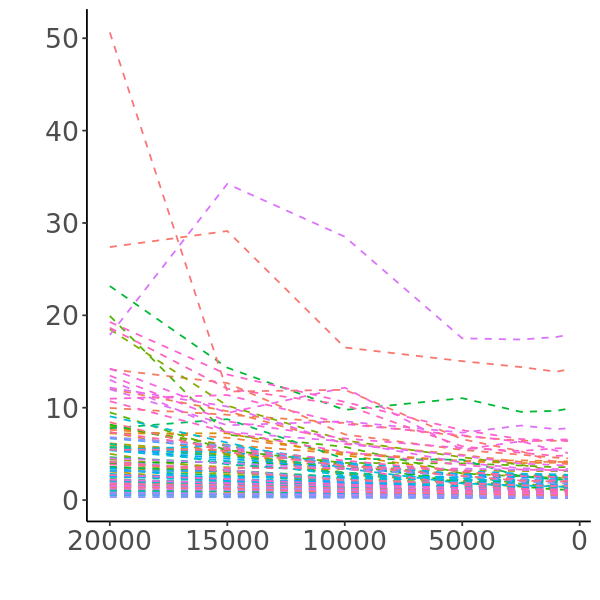

Saving 6.67 x 6.67 in image


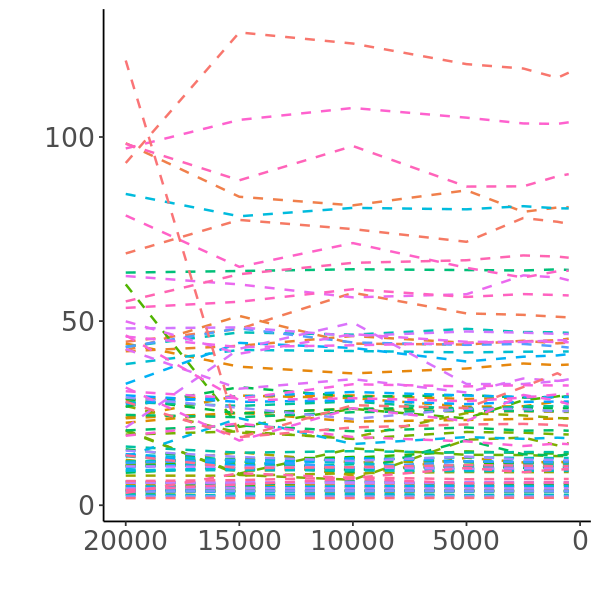

Saving 6.67 x 6.67 in image


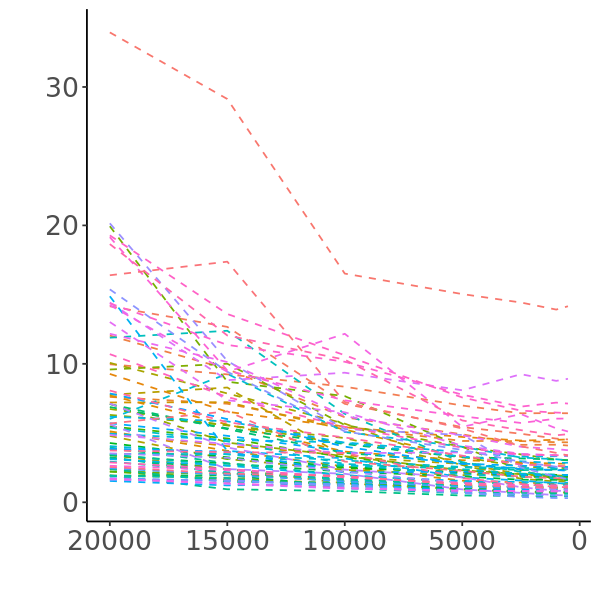

Saving 6.67 x 6.67 in image


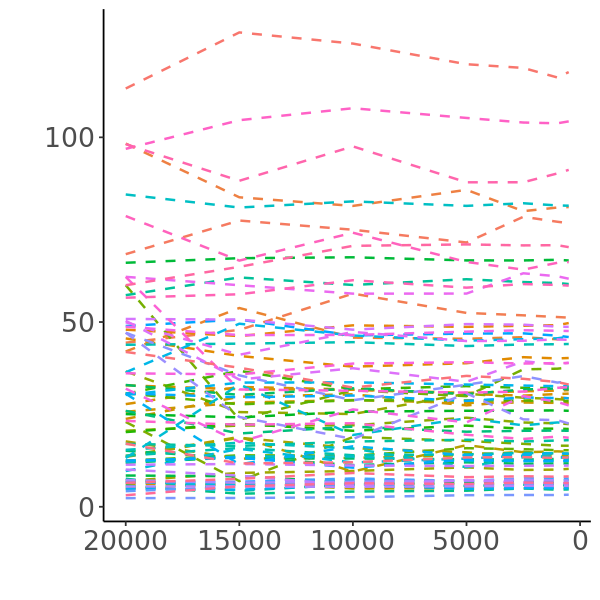

In [12]:
################## GAIN IN PRECISION WITH INCREASING SAMPLING SIZE ############
options(repr.plot.width=5, repr.plot.height=5)
Predictions <- list.files(path = "/projects/my-public-bucket/Data/NASA_CMS_2023/MEXICO", pattern = c("DESECON4_FNF_","_predictions.csv"),full.names = TRUE)

# Plot full area inside each DESECON

for (n in 1:length(Predictions)) {
    DIST <- (unlist(strsplit(basename(Predictions),split = "_")[n])[3])
    Data <- read.csv(Predictions[n])
    Data <- Data[c("AREA", "DESECON4", "GMB_mean_AGBD_dense", "GMB_sd_AGBD_dense")]
    Data["DIST"] <- as.integer(DIST)
    if (n==1){PREDS <- Data}
    if (n>1){PREDS <- rbind(PREDS,Data)}
}

PREDS_AREA1 <- PREDS[(PREDS$DESECON != "Cuerpo de Agua"),]#(PREDS$AREA > 1000000) && 
PREDS_AREA1 <- PREDS_AREA1 %>% group_by(DESECON4) %>% filter(!any(is.na(GMB_sd_AGBD_dense)))
ggplot(PREDS_AREA1,aes(DIST, GMB_sd_AGBD_dense)) + 
    geom_line(aes(col = factor(DESECON4)),linetype = "dashed", size = 0.5) +
    scale_x_reverse() +
    xlab("") + 
    ylab("") + 
    # ylim(0,15)+
    theme(text = element_text(size = 20),legend.position="none",panel.grid.major = element_blank(), panel.grid.minor = element_blank(),panel.background = element_blank(), axis.line = element_line(colour = "black"))
ggsave("/projects/my-public-bucket/Data/NASA_CMS_2023/MEXICO/DESECON_MEAN_TREND.png",plot = last_plot(),scale = 1,dpi = 400)

ggplot(PREDS_AREA1,aes(DIST, GMB_mean_AGBD_dense)) + 
    geom_line(aes(col = factor(DESECON4)),linetype = "dashed", size = 0.7) +
    scale_x_reverse() +
    xlab("") + 
    ylab("") + 
    # ylim(0,90)+
    theme(text = element_text(size = 20),legend.position="none",panel.grid.major = element_blank(), panel.grid.minor = element_blank(),panel.background = element_blank(), axis.line = element_line(colour = "black"))
ggsave("/projects/my-public-bucket/Data/NASA_CMS_2023/MEXICO/DESECON_SD_TREND.png",plot = last_plot(),scale = 1,dpi = 400)

# Plot on forested area inside each DESECON

for (n in 1:length(Predictions)) {
    DIST <- (unlist(strsplit(basename(Predictions),split = "_")[n])[3])
    Data <- read.csv(Predictions[n])
    Data <- Data[c("AREA", "DESECON4", "GMB_mean_AGBD_FOREST", "GMB_sd_AGBD_FOREST")]
    Data["DIST"] <- as.integer(DIST)
    if (n==1){PREDS <- Data}
    if (n>1){PREDS <- rbind(PREDS,Data)}
}
PREDS_AREA1 <- PREDS[(PREDS$DESECON != "Cuerpo de Agua"),]
PREDS_AREA1 <- PREDS_AREA1 %>% group_by(DESECON4) %>% filter(!any(is.na(GMB_sd_AGBD_FOREST)))
ggplot(PREDS_AREA1,aes(DIST, GMB_sd_AGBD_FOREST)) + 
    geom_line(aes(col = factor(DESECON4)),linetype = "dashed", size = 0.5) +
    scale_x_reverse() +
    xlab("") + 
    ylab("") + 
    # ylim(0,15)+
    theme(text = element_text(size = 20),legend.position="none",panel.grid.major = element_blank(), panel.grid.minor = element_blank(),panel.background = element_blank(), axis.line = element_line(colour = "black"))
ggsave("/projects/my-public-bucket/Data/NASA_CMS_2023/MEXICO/DESECON_FNF_MEAN_TREND.png",plot = last_plot(),scale = 1,dpi = 400)

ggplot(PREDS_AREA1,aes(DIST, GMB_mean_AGBD_FOREST)) + 
    geom_line(aes(col = factor(DESECON4)),linetype = "dashed", size = 0.7) +
    scale_x_reverse() +
    xlab("") + 
    ylab("") + 
    # ylim(0,90)+
    theme(text = element_text(size = 20),legend.position="none",panel.grid.major = element_blank(), panel.grid.minor = element_blank(),panel.background = element_blank(), axis.line = element_line(colour = "black"))
ggsave("/projects/my-public-bucket/Data/NASA_CMS_2023/MEXICO/DESECON_FNF_SD_TREND.png",plot = last_plot(),scale = 1,dpi = 400)

In [63]:
# ### IN REPORTING TO THE UNFCCC, FOR EXAMPLE, MEXICO USES DESECON STRATA 1 OR 2. BELOW, WE USE THE SAME APPROACH TO MAKE PREDICTIONS OF AGBD IN THE THESE STRATA 

options(repr.plot.width=10, repr.plot.height=10)
options(warn = -1) # supress warnings

#### CONAFOR:Please apply the following urban mask: https://www.inegi.org.mx/app/biblioteca/ficha.html?upc=889463807469

#### Choose either DESECON1 or DESECON2
DESECON = st_read("/projects/my-public-bucket/Data/NASA_CMS_2023/MEXICO/ecort08gw_DESECON1_DISS.gpkg", quiet = TRUE) %>% st_transform(crs = 6933) # Provided by CONAFOR and converted to a projected CRS so we can work in units of meters
DESECON = st_read("/projects/my-public-bucket/Data/NASA_CMS_2023/MEXICO/ecort08gw_DESECON2_DISS.gpkg", quiet = TRUE) %>% st_transform(crs = 6933) # Provided by CONAFOR and converted to a projected CRS so we can work in units of meters

#### Remove Urban areas 
DESECON <- st_difference(DESECON, URBAN) # Remove urban areas by cutting them out from the shapefile 

SIZE = c(10000)
samples = inla.posterior.sample(n = 250, result = model_fit_v2) # draw samples from our posterior distribution

for (SIZ in SIZE){
    # Create empty fields, which we will populate with our predictions in a dense grid created by us inside each feature
    # This dense grid, for example, represents a very dense NFI sampling design.
    DESECON[,"GMB_mean_AGBD_FOREST"] = NA
    DESECON[,"GMB_sd_AGBD_FOREST"] = NA

    for (f in (1:nrow(DESECON)))  {

        DESECON_ID = DESECON[f,]$DESECON4

        # Create the grid inside our patch of land, because we will predict AGBD at each grid center!
        grid_to_predict = st_make_grid(DESECON[f,], cellsize = c(SIZ,SIZ), what = "centers") %>% st_as_sf() %>% st_filter(DESECON[f,]) # Create a 1 km x 1 km grid 
        grid = grid_to_predict %>% st_coordinates()

        # We'll need our covariate values at the grid locations
        cci.pred = extract(cci.rast, grid)[,1]
        hei.pred = extract(hei.rast, grid)[,1]
        fnf.pred = extract(FNF, grid)[,1]
        
        fnf.sums = fnf.pred
        if (length(fnf.pred)>0){
        for (f in 1:length(fnf.pred)){
            a = as.integer(c(strsplit(as.character(fnf.pred[f]),split="")[[1]]))
            if ((length(sum(a))>=1) & (!is.na(sum(a)))){
            if (sum(a) >= 4){fnf.sums[f] <- 1}
            if (sum(a) < 4){fnf.sums[f] <- 0}}
            if ((length(sum(a))<1) | (is.na(sum(a)))) {fnf.sums[f] <- 0}
        }}

        if (length(cci.pred) > 0 && length(hei.pred) > 0){
        A.pred = inla.spde.make.A(mesh = mesh, loc = grid) # remake our projector matrix for the grid centers
        pred_fun = function(...){
          drop(intercept + 
            cci.pred*cci + 
            hei.pred*hei +
            A.pred%*%alpha.spat[1:k] +   
            Diagonal(x = cci.pred)%*%A.pred%*%beta.spat[1:k] +
            Diagonal(x = hei.pred)%*%A.pred%*%eta.spat[1:k]) +
            rnorm(nrow(A.pred), sd = sqrt(1/theta[1])) 
        }

        # Generate prediction samples
        pred.samples = (inla.posterior.sample.eval(fun = pred_fun, samples = samples))
        pred.samples[pred.samples < 0] = 0

        # Remove grid points that a majority of layers say have (non) forest
        fnf.sums[fnf.sums == 0] = NA
        pred.samples = fnf.sums*pred.samples # forces the non-forest areas to be set to NA 

        # Model expectations and SD's at the grid locations
        pred.mu_dense = Matrix::rowMeans(pred.samples^2, na.rm = T) # Mean AGBD values at each grid center
        pred.sd_dense = apply(pred.samples^2, 1, sd) # SD of AGBD at each grid center

        DESECON$GMB_mean_AGBD_FOREST[DESECON$DESECON4 == DESECON_ID] <- round(mean(pred.mu_dense,na.rm=TRUE),digits=2)
        DESECON$GMB_sd_AGBD_FOREST[DESECON$DESECON4 == DESECON_ID] <- round(sd(colMeans(pred.samples^2, na.rm = T),na.rm=TRUE),digits=2)

        #### SAVE OUR RESULTS 
        write.csv(st_drop_geometry(DESECON),paste0("/projects/my-public-bucket/Data/NASA_CMS_2023/MEXICO/DESECON1_FNF_",toString(SIZ),"_predictions.csv"))
        write.csv(st_drop_geometry(DESECON),paste0("/projects/my-public-bucket/Data/NASA_CMS_2023/MEXICO/DESECON2_FNF_",toString(SIZ),"_predictions.csv"))
}}}


Saving 6.67 x 6.67 in image
Saving 6.67 x 6.67 in image


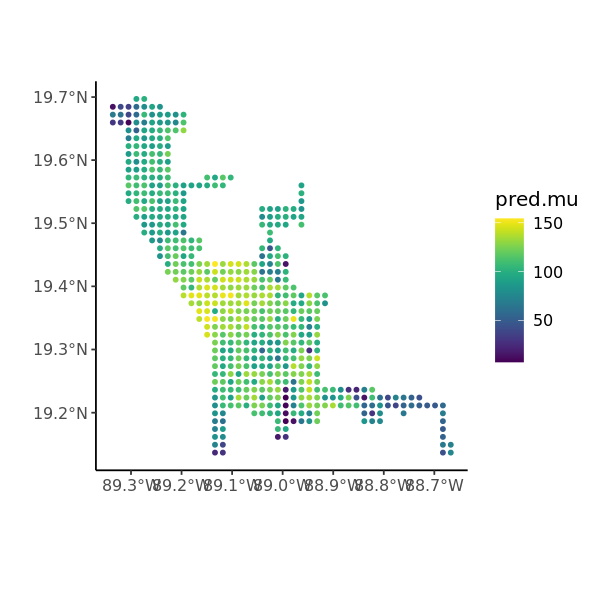

[1] "Deforestation ID:1 - Mean predicted AGBD: 102.01Mg/ha"
[1] "Deforestation ID:1 - Predicted SD of AGBD: 6.87Mg/ha"


Saving 6.67 x 6.67 in image


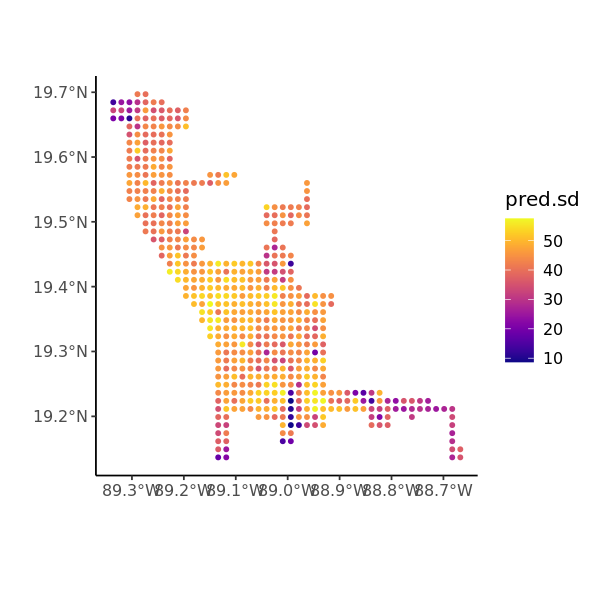

Saving 6.67 x 6.67 in image


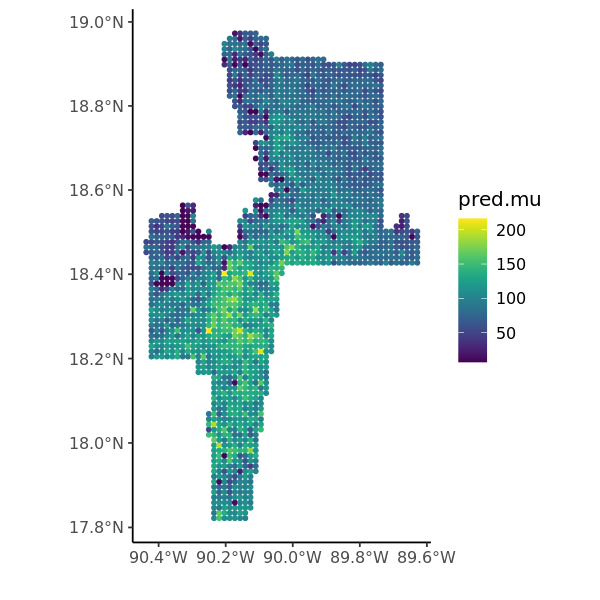

[1] "Deforestation ID:2 - Mean predicted AGBD: 92.94Mg/ha"
[1] "Deforestation ID:2 - Predicted SD of AGBD: 4.68Mg/ha"


Saving 6.67 x 6.67 in image


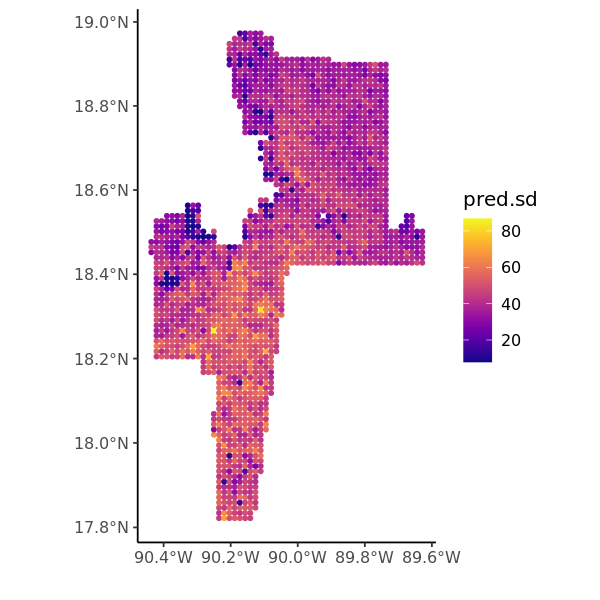

Saving 6.67 x 6.67 in image


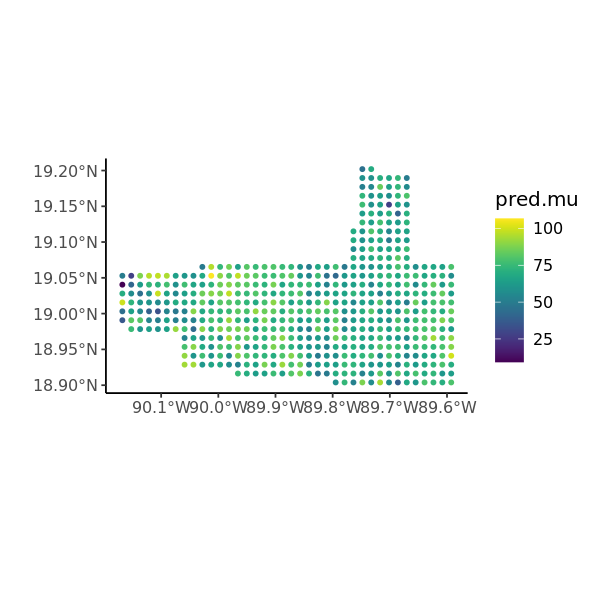

[1] "Deforestation ID:3 - Mean predicted AGBD: 69.64Mg/ha"
[1] "Deforestation ID:3 - Predicted SD of AGBD: 7.99Mg/ha"


Saving 6.67 x 6.67 in image


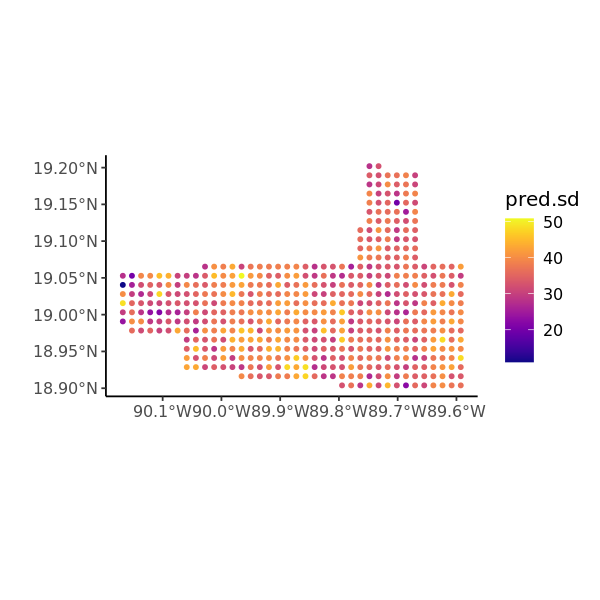

Saving 6.67 x 6.67 in image


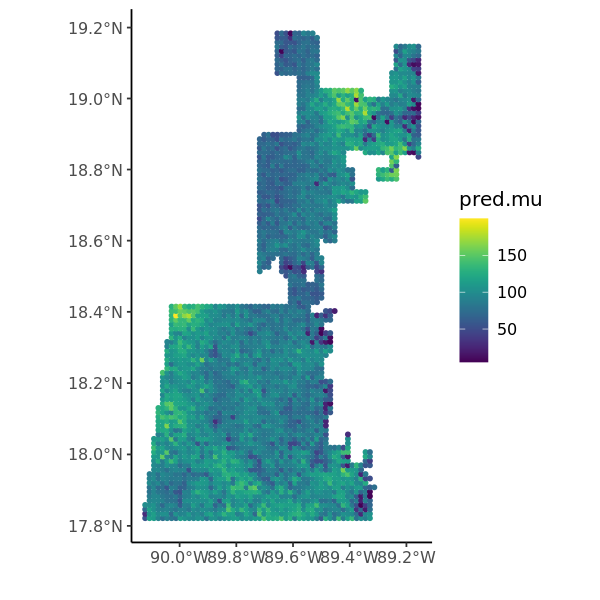

[1] "Deforestation ID:4 - Mean predicted AGBD: 91.85Mg/ha"
[1] "Deforestation ID:4 - Predicted SD of AGBD: 5.38Mg/ha"


Coordinate system already present. Adding new coordinate system, which will
replace the existing one.


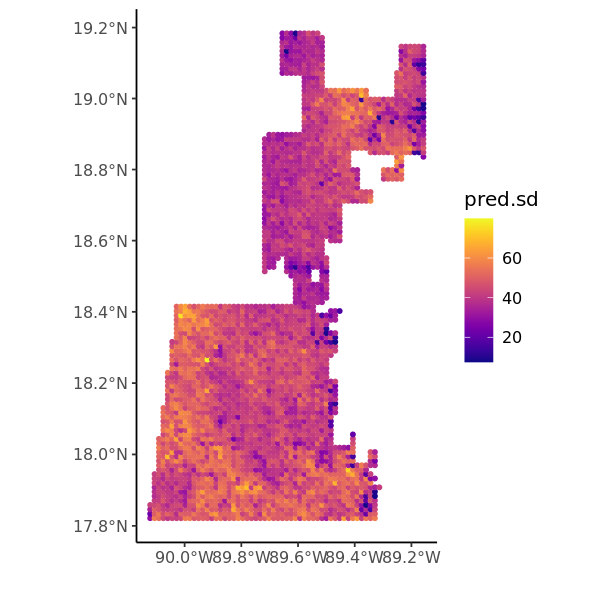

Saving 6.67 x 6.67 in image
Coordinate system already present. Adding new coordinate system, which will
replace the existing one.


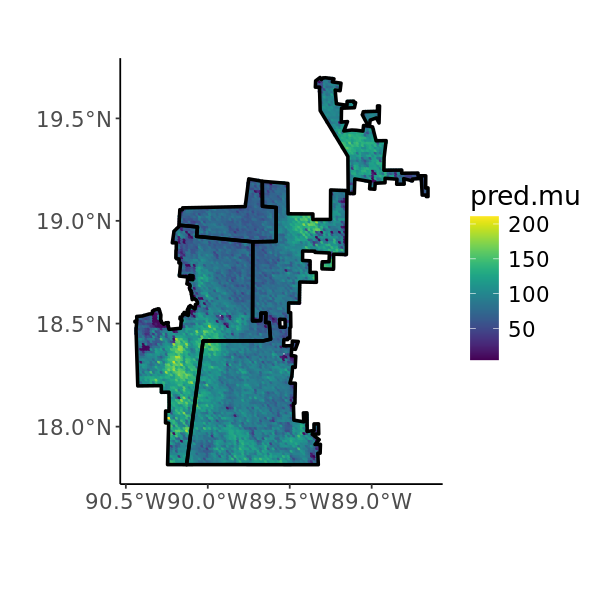

Saving 6.67 x 6.67 in image


[1] "Deforestation ID:4 - Mean predicted AGBD: 91.16Mg/ha"
[1] "Deforestation ID:4 - Predicted SD of AGBD: 3.7Mg/ha"


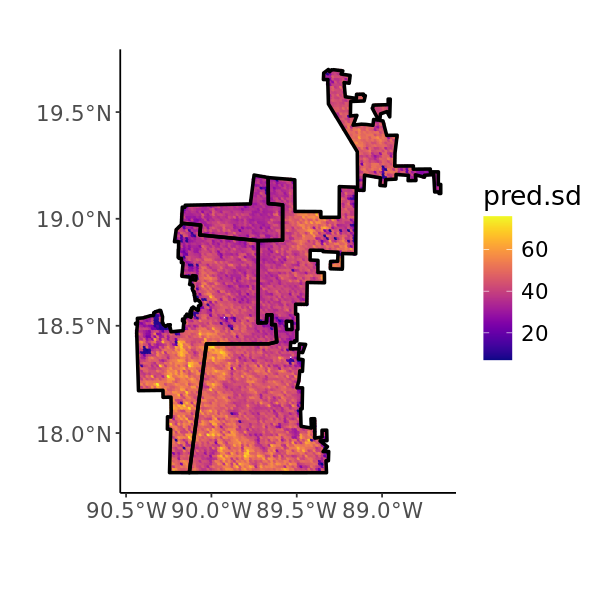

In [123]:
############## LET'S PREDICT AGBD IN NATURAL PROTECTED AREAS OF YUCATAN ############

# And this is where the notebook finally gets interesting! Imagine if we had a patch of land where we are interested in predicting AGBD. 
# How do we apply our model to the entire area covered by this land to predict mean AGBD and its associated SD? 
# We do this by selecting multiple locations inside the patch of land. The locations must be at least 56.42 x 2 m apart, which is the size of our NFI plot. 
# Then, we predict AGBD at all those locations (just like we did in the cells above). As a result, we will have multiple predictions of mean AGBD. 
# Finally, we simply take the mean of these mean AGBD values, and their standard deviation. 

# For simplicity, we have created two polygons of (hypothetically) disturbed forest. We loop through these to predict AGBD in each in a for loop. 

options(repr.plot.width=5, repr.plot.height=5)

cci.rast = rast("/projects/my-public-bucket/Data/NASA_CMS_2023/MEXICO/cci_mexico_6933.tif")
hei.rast = rast("/projects/my-public-bucket/Data/NASA_CMS_2023/MEXICO/GLAD_FH_mexico_UINT16_C_6399.tif")
samples = inla.posterior.sample(n = 250, result = model_fit_v2) # draw samples from our posterior distribution

Deforestation = st_read("/projects/my-public-bucket/Data/NASA_CMS_2023/MEXICO/PA_selected_v2.gpkg", quiet = TRUE) %>% st_transform(crs = 6933)  # Regions of deforestation.  
Deforestation <- st_difference(Deforestation, URBAN) # Remove urban areas by cutting them out from the shapefile 

for (f in (1:nrow(Deforestation))) {
    
    Deforestation_ID = f
    
    # Create a 120 x 120 m grid inside our patch of land, because we will predict AGBD at each grid center!
    grid_to_predict = st_make_grid(Deforestation[f,], cellsize = c(1500,1500), what = "centers") %>% st_as_sf() %>% st_filter(Deforestation[f,]) 
    grid_to_predict = grid_to_predict[URBAN, ,op=st_disjoint] # remove grid points that overlap with urban mask
    if (nrow(grid_to_predict[URBAN, ,op=st_disjoint])>0){
        grid = grid_to_predict %>% st_coordinates()

        # We'll need our covariate values at the grid locations
        cci.pred = extract(cci.rast, grid)[,1]
        hei.pred = extract(hei.rast, grid)[,1]

        A.pred = inla.spde.make.A(mesh = mesh, loc = grid) # remake our projector matrix for the grid centers
        pred_fun = function(...){
          drop(intercept + 
            cci.pred*cci + 
            hei.pred*hei +
            A.pred%*%alpha.spat[1:k] +   
            Diagonal(x = cci.pred)%*%A.pred%*%beta.spat[1:k] +
            Diagonal(x = hei.pred)%*%A.pred%*%eta.spat[1:k]) +
            rnorm(nrow(A.pred), sd = sqrt(1/theta[1])) 
        }

        # Generate prediction samples
        pred.samples = (inla.posterior.sample.eval(fun = pred_fun, samples = samples))
        pred.samples[pred.samples < 0] = 0

        # Model expectations and SD's at the grid locations
        pred.mu = Matrix::rowMeans(pred.samples^2, na.rm = T) # Mean AGBD values at each grid center
        pred.sd = apply(pred.samples^2, 1, sd) # SD of AGBD at each grid center

        p <- ggplot() + coord_sf(crs = 6933) + 
             geom_point(aes(x = grid[,1], y = grid[,2], col=pred.mu), size = 1) + # make a map to see plot locations and the predicted AGBD values at each location
             scale_color_viridis() + xlab("") + ylab("") + theme(text = element_text(size = 12),plot.title = element_text(color="red", size=12, face="bold.italic"),panel.grid.major = element_blank(), panel.grid.minor = element_blank(),panel.background = element_blank(), axis.line = element_line(colour = "black"))
                   # scale_color_viridis() + ggtitle(paste0("GMB-predicted AGBD in ID: ",Deforestation_ID)) + theme(plot.title = element_text(color="red", size=14, face="bold.italic")) + xlab("") + ylab("")
        print(p)
        ggsave(paste0("/projects/my-public-bucket/Data/NASA_CMS_2023/MEXICO/PA_",Deforestation_ID,"_MEAN.png"),plot = last_plot(),scale = 1,dpi = 400)
        
        p <- ggplot() + coord_sf(crs = 6933) + 
             geom_point(aes(x = grid[,1], y = grid[,2], col=pred.sd), size = 1) + # make a map to see plot locations and the predicted AGBD values at each location
             scale_color_viridis(option="plasma") + xlab("") + ylab("") + theme(text = element_text(size = 12),plot.title = element_text(color="red", size=12, face="bold.italic"),panel.grid.major = element_blank(), panel.grid.minor = element_blank(),panel.background = element_blank(), axis.line = element_line(colour = "black"))
           # scale_color_viridis() + ggtitle(paste0("GMB-predicted AGBD in ID: ",Deforestation_ID)) + theme(plot.title = element_text(color="red", size=14, face="bold.italic")) + xlab("") + ylab("")
        print(p)
        ggsave(paste0("/projects/my-public-bucket/Data/NASA_CMS_2023/MEXICO/PA_",Deforestation_ID,"_SD.png"),plot = last_plot(),scale = 1,dpi = 400)

        print(paste0("Deforestation ID:",Deforestation_ID," - Mean predicted AGBD: ", round(mean(pred.mu,na.rm=TRUE),digits=2) ,"Mg/ha"))
        print(paste0("Deforestation ID:",Deforestation_ID," - Predicted SD of AGBD: ", round(sd(colMeans(pred.samples^2, na.rm = T),na.rm=TRUE),digits=2) ,"Mg/ha"))
    } else {
        print(paste0("Deforestation ID:",Deforestation_ID," is entirely an urban area"))
    }
}

################ FIGURE FOR THE PAPER #####################
Deforestation = st_read("/projects/my-public-bucket/Data/NASA_CMS_2023/MEXICO/PA_selected_v2.gpkg", quiet = TRUE) %>% st_union() %>% st_transform(crs = 6933)  # Regions of deforestation.  
grid_to_predict = st_make_grid(Deforestation, cellsize = c(1500,1500), what = "centers") %>% st_as_sf() %>% st_filter(Deforestation) 
grid_to_predict = grid_to_predict[URBAN, ,op=st_disjoint] # remove grid points that overlap with urban mask
grid = grid_to_predict %>% st_coordinates()
cci.pred = extract(cci.rast, grid)[,1]
hei.pred = extract(hei.rast, grid)[,1]

A.pred = inla.spde.make.A(mesh = mesh, loc = grid) # remake our projector matrix for the grid centers
pred_fun = function(...){
  drop(intercept + 
    cci.pred*cci + 
    hei.pred*hei +
    A.pred%*%alpha.spat[1:k] +   
    Diagonal(x = cci.pred)%*%A.pred%*%beta.spat[1:k] +
    Diagonal(x = hei.pred)%*%A.pred%*%eta.spat[1:k]) +
    rnorm(nrow(A.pred), sd = sqrt(1/theta[1])) 
}

pred.samples = (inla.posterior.sample.eval(fun = pred_fun, samples = samples))
pred.samples[pred.samples < 0] = 0
pred.mu = Matrix::rowMeans(pred.samples^2, na.rm = T) # Mean AGBD values at each grid center
pred.sd = apply(pred.samples^2, 1, sd) # SD of AGBD at each grid center

Deforestation = st_read("/projects/my-public-bucket/Data/NASA_CMS_2023/MEXICO/PA_selected_v2.gpkg", quiet = TRUE) %>% st_transform(crs = 6933)  # Regions of deforestation.  

p <- ggplot() + coord_sf(crs = 6933) + 
     geom_point(aes(x = grid[,1], y = grid[,2], col=pred.mu), size = 0.5) + # make a map to see plot locations and the predicted AGBD values at each location
     geom_sf(data = Deforestation,col="black",fill=NA,lwd=1) + # add our fake deforestation sites 
     scale_color_viridis() + xlab("") + ylab("") + theme(text = element_text(size = 16),plot.title = element_text(color="red", size=12, face="bold.italic"),panel.grid.major = element_blank(), panel.grid.minor = element_blank(),panel.background = element_blank(), axis.line = element_line(colour = "black"))
print(p)
ggsave(paste0("/projects/my-public-bucket/Data/NASA_CMS_2023/MEXICO/PA_","ALL","_MEAN.png"),plot = last_plot(),scale = 1,dpi = 400)

p <- ggplot() + coord_sf(crs = 6933) + 
     geom_point(aes(x = grid[,1], y = grid[,2], col=pred.sd), size = 0.5) + # make a map to see plot locations and the predicted AGBD values at each location
     geom_sf(data = Deforestation,col="black",fill=NA,lwd=1) + # add our fake deforestation sites      
     scale_color_viridis(option="plasma") + xlab("") + ylab("") + theme(text = element_text(size = 16),plot.title = element_text(color="red", size=12, face="bold.italic"),panel.grid.major = element_blank(), panel.grid.minor = element_blank(),panel.background = element_blank(), axis.line = element_line(colour = "black"))
print(p)
ggsave(paste0("/projects/my-public-bucket/Data/NASA_CMS_2023/MEXICO/PA_","ALL","_SD.png"),plot = last_plot(),scale = 1,dpi = 400)

print(paste0("Deforestation ID:",Deforestation_ID," - Mean predicted AGBD: ", round(mean(pred.mu,na.rm=TRUE),digits=2) ,"Mg/ha"))
print(paste0("Deforestation ID:",Deforestation_ID," - Predicted SD of AGBD: ", round(sd(colMeans(pred.samples^2, na.rm = T),na.rm=TRUE),digits=2) ,"Mg/ha"))

In [ ]:
############## LET'S PREDICT AGBD IN ALL NATURAL PROTECTED AREAS ############

options(repr.plot.width=5, repr.plot.height=5)

cci.rast = rast("/projects/my-public-bucket/Data/NASA_CMS_2023/MEXICO/cci_mexico_6933.tif")
hei.rast = rast("/projects/my-public-bucket/Data/NASA_CMS_2023/MEXICO/GLAD_FH_mexico_UINT16_C_6399.tif")
samples = inla.posterior.sample(n = 250, result = model_fit_v2) # draw samples from our posterior distribution

Deforestation = st_read("/projects/my-public-bucket/Data/NASA_CMS_2023/MEXICO/anpmx.gpkg", quiet = TRUE) %>% st_transform(crs = 6933)  # Regions of deforestation.  
Deforestation <- st_difference(Deforestation, URBAN) # Remove urban areas by cutting them out from the shapefile 
NPA_GMBpredictions <- Deforestation
NPA_GMBpredictions['GMB_mean_AGBD_dense'] <- NA
NPA_GMBpredictions['GMB_sd_AGBD_dense'] <- NA

for (f in (1:nrow(Deforestation))) {
    
    Deforestation_ID = f
    ID_ANP <- Deforestation[f,]$ID_ANP
    print(ID_ANP)
    
    if (Deforestation[f,]$S_MARINA == 0) {
    
        # Create a 120 x 120 m grid inside our patch of land, because we will predict AGBD at each grid center!
        grid_to_predict = st_make_grid(Deforestation[f,], cellsize = c(1500,1500), what = "centers") %>% st_as_sf() %>% st_filter(Deforestation[f,]) 
        grid_to_predict = grid_to_predict[URBAN, ,op=st_disjoint] # remove grid points that overlap with urban mask
        if (nrow(grid_to_predict[URBAN, ,op=st_disjoint])>0){
            grid = grid_to_predict %>% st_coordinates()

            # We'll need our covariate values at the grid locations
            cci.pred = extract(cci.rast, grid)[,1]
            hei.pred = extract(hei.rast, grid)[,1]

            A.pred = inla.spde.make.A(mesh = mesh, loc = grid) # remake our projector matrix for the grid centers
            pred_fun = function(...){
              drop(intercept + 
                cci.pred*cci + 
                hei.pred*hei +
                A.pred%*%alpha.spat[1:k] +   
                Diagonal(x = cci.pred)%*%A.pred%*%beta.spat[1:k] +
                Diagonal(x = hei.pred)%*%A.pred%*%eta.spat[1:k]) +
                rnorm(nrow(A.pred), sd = sqrt(1/theta[1])) 
            }

            # Generate prediction samples
            pred.samples = (inla.posterior.sample.eval(fun = pred_fun, samples = samples))
            pred.samples[pred.samples < 0] = 0

            # Model expectations and SD's at the grid locations
            pred.mu = Matrix::rowMeans(pred.samples^2, na.rm = T) # Mean AGBD values at each grid center
            pred.sd = apply(pred.samples^2, 1, sd) # SD of AGBD at each grid center

            NPA_GMBpredictions[f,]$GMB_mean_AGBD_dense <- round(mean(pred.mu,na.rm=TRUE),digits=2)
            NPA_GMBpredictions[f,]$GMB_sd_AGBD_dense <- round(sd(colMeans(pred.samples^2, na.rm = T),na.rm=TRUE),digits=2)

            print(paste0("Deforestation ID:",Deforestation_ID," - Mean predicted AGBD: ", round(mean(pred.mu,na.rm=TRUE),digits=2) ,"Mg/ha"))
            print(paste0("Deforestation ID:",Deforestation_ID," - Predicted SD of AGBD: ", round(sd(colMeans(pred.samples^2, na.rm = T),na.rm=TRUE),digits=2) ,"Mg/ha"))
        } else {
            print(paste0("Deforestation ID:",Deforestation_ID," is entirely an urban area"))
        }
    }
}
st_write(NPA_GMBpredictions, dsn = file.path('/projects/my-public-bucket/Data/NASA_CMS_2023/MEXICO/NPA_GMBpredictions.gpkg'), layer = 'NPA_GMBpredictions', quiet = TRUE)

In [2]:
#################### LETS TRY TO PREDICT AGBD IN ALL PROJECT AREAS IN MEXICO ######

PROJECTS = st_read("/projects/my-public-bucket/Data/NASA_CMS_2023/MEXICO/11_Merge_PSAyMFCcCyPM_Dummies_Rdo.gpkg", quiet = TRUE) %>% st_transform(crs = 6933)
PROJECTS$ID <- seq.int(nrow(PROJECTS))
PROJECTS$DPS_ID <- PROJECTS$ID
PROJECTS$GMB_mean_AGBD_dense = NA
PROJECTS$GMB_sd_AGBD_dense = NA
PROJECTS$GMB_mean_AGBD_FOREST = NA
PROJECTS$GMB_sd_AGBD_FOREST = NA

# # cci.rast = rast("/projects/my-public-bucket/Data/NASA_CMS_2023/MEXICO/cci_mexico_6933.tif")
# # hei.rast = rast("/projects/my-public-bucket/Data/NASA_CMS_2023/MEXICO/GLAD_FH_mexico_UINT16_C_6399.tif")
# # samples = inla.posterior.sample(n = 250, result = model_fit_v2) # draw samples from our posterior distribution

# # PROJECTS = st_read("/projects/my-public-bucket/Data/NASA_CMS_2023/MEXICO/11_Merge_PSAyMFCcCyPM_Dummies_Rdo.gpkg", quiet = TRUE) %>% st_transform(crs = 6933)
# # PROJECTS$ID <- seq.int(nrow(PROJECTS))
# # PROJECTS$GMB_mean_AGBD_dense = NA
# # PROJECTS$GMB_sd_AGBD_dense = NA
# # PROJECTS$GMB_mean_AGBD_FOREST = NA
# # PROJECTS$GMB_sd_AGBD_FOREST = NA

# for (f in (1:nrow(PROJECTS)))  { #1:nrow(PROJECTS)
#     PROJECTS_ID = PROJECTS[f,]$ID
    
#     Existing <- read.csv('/projects/my-public-bucket/Data/NASA_CMS_2023/MEXICO/11_Merge_PSAyMFCcCyPM_Dummies_Rdo_GMBpredictions.csv',header=TRUE)
    
#     if (!is.na(Existing$GMB_mean_AGBD_dense[Existing$ID == PROJECTS_ID])) {       
#         PROJECTS$GMB_mean_AGBD_dense[PROJECTS$ID == PROJECTS_ID] <- Existing$GMB_mean_AGBD_dense[Existing$ID == PROJECTS_ID]
#         PROJECTS$GMB_sd_AGBD_dense[PROJECTS$ID == PROJECTS_ID] <- Existing$GMB_sd_AGBD_dense[Existing$ID == PROJECTS_ID]
#     }
        
#     if (is.na(Existing$GMB_mean_AGBD_dense[Existing$ID == PROJECTS_ID])) {

#         # Create the grid inside our patch of land, because we will predict AGBD at each grid center!
#         grid_to_predict = st_make_grid(PROJECTS[f,], cellsize = c(100,100), what = "centers") %>% st_as_sf() %>% st_filter(PROJECTS[f,]) # Create a 1 km x 1 km grid 
#         grid_to_predict = grid_to_predict[URBAN, ,op=st_disjoint] # remove grid points that overlap with urban mask

#         if (nrow(grid_to_predict[URBAN, ,op=st_disjoint])>0){
#             grid = grid_to_predict %>% st_coordinates()

#             # We'll need our covariate values at the grid locations
#             cci.pred = extract(cci.rast, grid)[,1]
#             hei.pred = extract(hei.rast, grid)[,1]
#         #     fnf.pred = extract(FNF, grid)[,1]

#         #     # This step makes a record of grid points where a majority (>=4) of (non)forest masks indicate there is no forest.
#         #     fnf.sums = fnf.pred
#         #     if (length(fnf.pred)>0){
#         #     for (f in 1:length(fnf.pred)){
#         #         a = as.integer(c(strsplit(as.character(fnf.pred[f]),split="")[[1]]))
#         #         if ((length(sum(a))>=1) & (!is.na(sum(a)))){
#         #         if (sum(a) >= 4){fnf.sums[f] <- 1}
#         #         if (sum(a) < 4){fnf.sums[f] <- 0}}
#         #         if ((length(sum(a))<1) | (is.na(sum(a)))) {fnf.sums[f] <- 0}
#         #     }}

#             if (length(cci.pred) > 0 && length(hei.pred) > 0){
#                 A.pred = inla.spde.make.A(mesh = mesh, loc = grid) # remake our projector matrix for the grid centers
#                 pred_fun = function(...){
#                   drop(intercept + 
#                     cci.pred*cci + 
#                     hei.pred*hei +
#                     A.pred%*%alpha.spat[1:k] +   
#                     Diagonal(x = cci.pred)%*%A.pred%*%beta.spat[1:k] +
#                     Diagonal(x = hei.pred)%*%A.pred%*%eta.spat[1:k]) +
#                     rnorm(nrow(A.pred), sd = sqrt(1/theta[1])) 
#                 }

#                 # Generate prediction samples
#                 pred.samples = (inla.posterior.sample.eval(fun = pred_fun, samples = samples))
#                 pred.samples[pred.samples < 0] = 0

#                 # Model expectations and SD's at the grid locations
#                 pred.mu_dense = Matrix::rowMeans(pred.samples^2, na.rm = TRUE) # Mean AGBD values at each grid center
#                 pred.sd_dense = apply(pred.samples^2, 1, sd, na.rm = TRUE) # SD of AGBD at each grid center

#                 # Enter information to CSV file
#                 PROJECTS$GMB_mean_AGBD_dense[PROJECTS$ID == PROJECTS_ID] <- round(mean(pred.mu_dense,na.rm=TRUE),digits=2)
#                 PROJECTS$GMB_sd_AGBD_dense[PROJECTS$ID == PROJECTS_ID] <- round(sd(colMeans(pred.samples^2, na.rm = T),na.rm=TRUE),digits=2)

#                 # Remove grid points that a majority of layers say have (non) forest
#                 # fnf.sums[fnf.sums == 0] = NA
#                 # pred.samples = fnf.sums*pred.samples # forces the non-forest areas to be set to NA 
#                 # pred.mu_dense = Matrix::rowMeans(pred.samples^2, na.rm = TRUE) # Mean AGBD values at each grid center
#                 # pred.sd_dense = apply(pred.samples^2, 1, sd, na.rm = TRUE) # SD of AGBD at each grid center

#                 # PROJECTS$GMB_mean_AGBD_FOREST[PROJECTS$ID == PROJECTS_ID] <- round(mean(pred.mu_dense,na.rm=TRUE),digits=2)
#                 # PROJECTS$GMB_sd_AGBD_FOREST[PROJECTS$ID == PROJECTS_ID] <- round(sd(colMeans(pred.samples^2, na.rm = T),na.rm=TRUE),digits=2)
#                 }

#                 #### SAVE OUR RESULTS 
#                 write.csv(st_drop_geometry(PROJECTS),paste0("/projects/my-public-bucket/Data/NASA_CMS_2023/MEXICO/11_Merge_PSAyMFCcCyPM_Dummies_Rdo_GMBpredictions.csv"))   
#                 # st_write(PROJECTS, dsn = file.path('/projects/my-public-bucket/Data/NASA_CMS_2023/MEXICO/11_Merge_PSAyMFCcCyPM_Dummies_Rdo_GMBpredictions.gpkg'), layer = '11_Merge_PSAyMFCcCyPM_Dummies_Rdo_GMBpredictions', overwrite=TRUE, quiet = TRUE)
#         }
#     }
# }

In [ ]:
PROJECTS$GROUP <- ceiling(seq_along(PROJECTS$ID)/1000)
for (each_group in unique(PROJECTS$GROUP)){
PROJECTS_SPLIT <- PROJECTS[PROJECTS$GROUP == each_group,]
st_write(PROJECTS_SPLIT, dsn = file.path(paste0('/projects/my-public-bucket/Data/NASA_CMS_2023/MEXICO/11_Merge_PSAyMFCcCyPM_Dummies_Rdo_SPLIT/PROJECTS_',as.character(each_group),'.gpkg')), layer = paste0('PROJECTS_',as.character(each_group)), overwrite=TRUE, quiet = TRUE)
date_time<-Sys.time()
while((as.numeric(Sys.time()) - as.numeric(date_time))<2.5){}
}

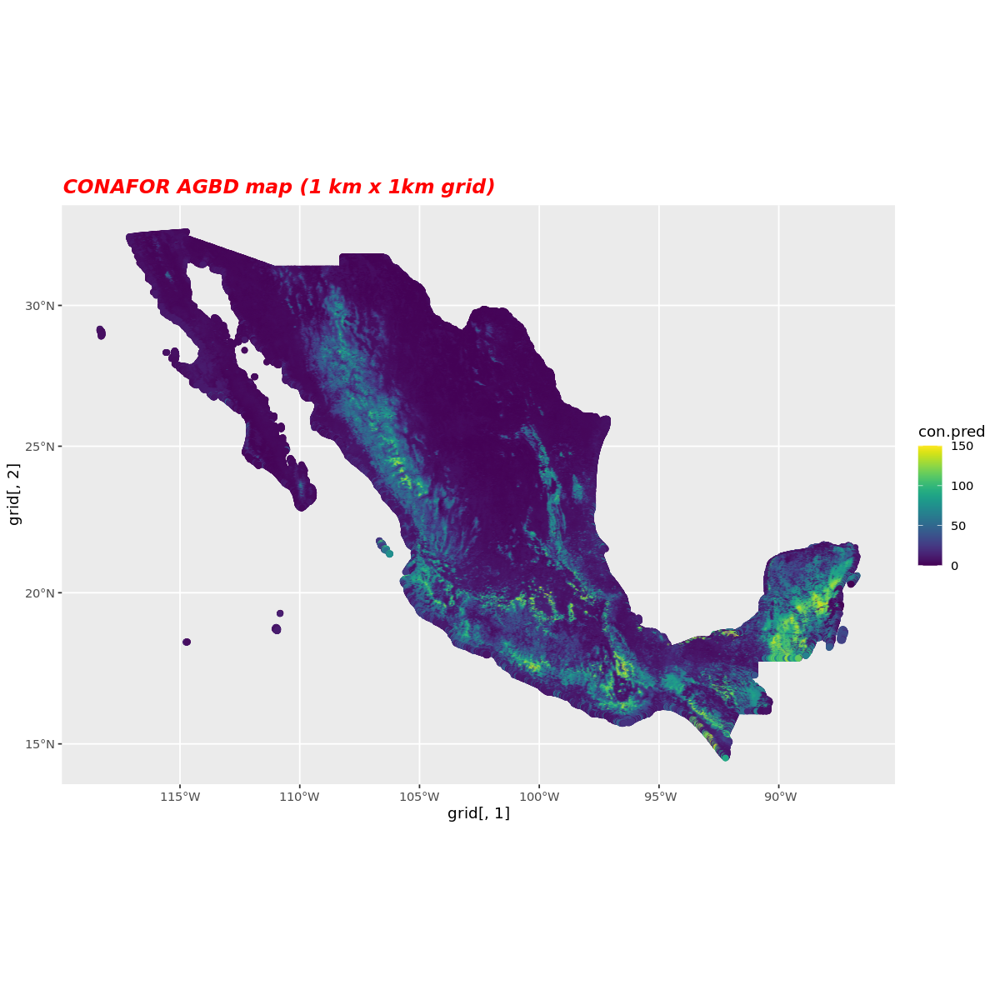

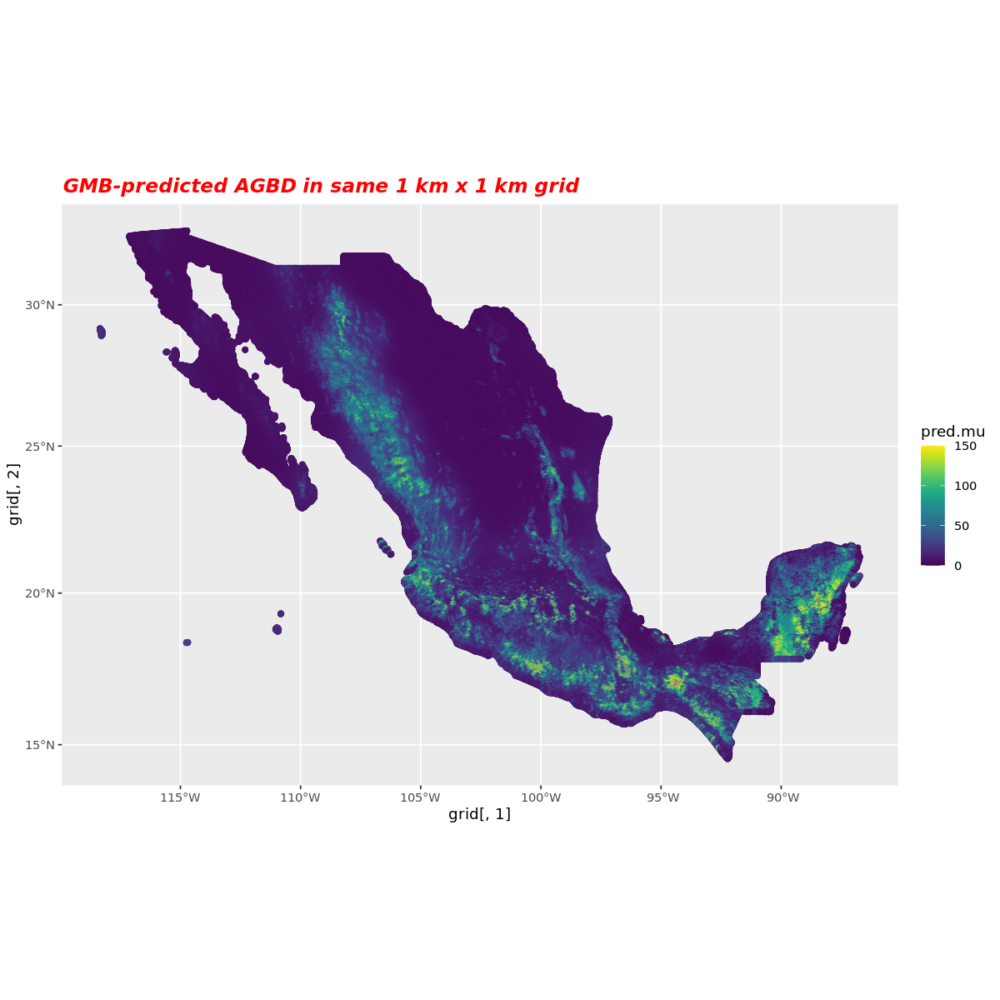

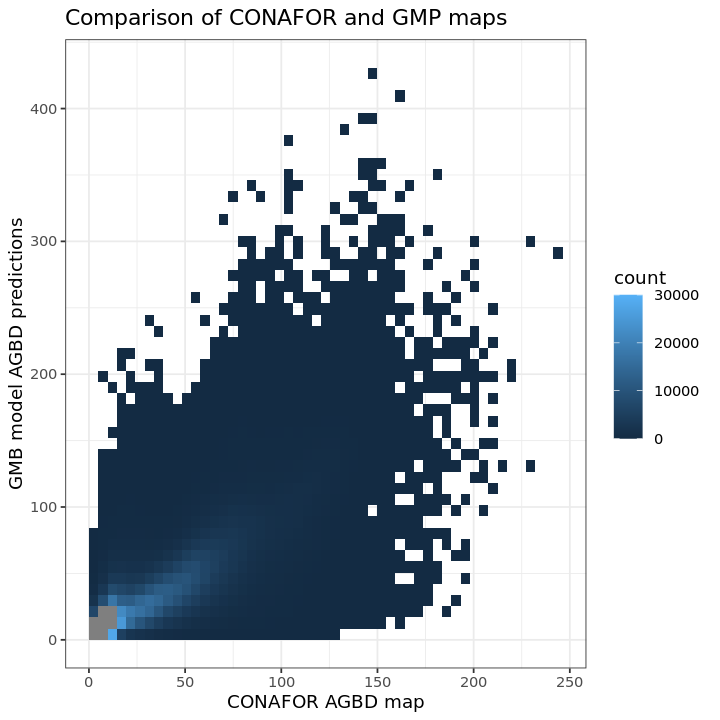

In [9]:
########################## AND FINALLY, LET'S CHECK HOW OUR MODEL PERFORMS COMPARED TO MEXICO'S NFI MAP ##################

# CONAFOR has an 1 km gridded AGBD map product. Since the NFI data was used in the creation of this map, we could 
# not use it as a covariate. We can, however, compare how our model performs in comparison to the CONAFOR map. 
# First, we warp our covariate rasters (CCI and GLAD forest heights) to the same grid as the CONAFOR map (using GDAL). 
# For every grid location center, we then extract the CCI and forest height values. After that, we follow the 
# same procedure as above. 

### WARP THE CCI AND FOREST HEIGHT RASTERS TO THE SAME EXTENT AND RESOLUTION AS CONAFOR MAP USING "average"
# gdalwarp /projects/my-public-bucket/Data/NASA_CMS_2023/MEXICO/GLAD_FH_mexico_UINT16_C_6399.tif /projects/my-public-bucket/Data/NASA_CMS_2023/MEXICO/GLAD_FH_mexico_UINT16_C_6399_1km.tif -tr 948.7771 948.7771 -te -12081065 -7850468 1394143 4273682 -r average -co COMPRESS=DEFLATE -co ZLEVEL=9 -co PREDICTOR=1 -co TILED=YES
# gdalwarp /projects/my-public-bucket/Data/NASA_CMS_2023/MEXICO/cci_mexico_6933.tif /projects/my-public-bucket/Data/NASA_CMS_2023/MEXICO/cci_mexico_6933_1km.tif -tr 948.7771 948.7771 -te -12081065 -7850468 1394143 4273682 -r average -co COMPRESS=DEFLATE -co ZLEVEL=9 -co PREDICTOR=1 -co TILED=YES

cci.rast = raster("/projects/my-public-bucket/Data/NASA_CMS_2023/MEXICO/cci_mexico_6933_1km.tif")
hei.rast = raster("/projects/my-public-bucket/Data/NASA_CMS_2023/MEXICO/GLAD_FH_mexico_UINT16_C_6399_1km.tif")
CONAFOR_MAP <- raster("/projects/shared-buckets/nehajo88/Data/Biomass_maps/MEX_NFI_AGB/Biomasa_mosaico_por_formacion_6933.tif")

# Extract the grid locations (coordinates), that is the center of each pixel in the CONAFOR map 
grid_to_predict <- st_as_sf(as(CONAFOR_MAP, 'SpatialPixels'))
grid = grid_to_predict %>% st_coordinates()

# We'll need our covariate values at the grid locations
cci.pred = extract(cci.rast, grid)
hei.pred = extract(hei.rast, grid)
con.pred = extract(CONAFOR_MAP, grid)

samples = inla.posterior.sample(n = 250, result = model_fit_v2)
A.pred = inla.spde.make.A(mesh = mesh, loc = grid)
pred_fun = function(...){
  drop(intercept + 
    cci.pred*cci + 
    hei.pred*hei +
    A.pred%*%alpha.spat[1:k] +   
    Diagonal(x = cci.pred)%*%A.pred%*%beta.spat[1:k] +
    Diagonal(x = hei.pred)%*%A.pred%*%eta.spat[1:k]) + 
    rnorm(nrow(A.pred), sd = sqrt(1/theta[1])) 
}

# Generate prediction samples
pred.samples = (inla.posterior.sample.eval(fun = pred_fun, samples = samples))
pred.samples[pred.samples < 0] = 0

# # Model expectations and SD's at the grid locations
pred.mu = Matrix::rowMeans(pred.samples^2, na.rm = T) # Mean AGBD values at each grid center
pred.sd = apply(pred.samples^2, 1, sd) # SD of AGBD at each grid center

options(repr.plot.width=10, repr.plot.height=10)

ggplot() + coord_sf(crs = 6933) + 
           geom_point(aes(x = grid[,1], y = grid[,2], col=con.pred)) + # make a map to see plot locations and the CONAFOR AGBD values at each location
           scale_color_viridis(limits = c(0, 150))  + ggtitle("CONAFOR AGBD map (1 km x 1km grid)") + theme(plot.title = element_text(color="red", size=14, face="bold.italic"))

ggplot() + coord_sf(crs = 6933) + 
           geom_point(aes(x = grid[,1], y = grid[,2], col=pred.mu)) + # make a map to see plot locations and the predicted AGBD values at each location
           scale_color_viridis(limits = c(0, 150))  + ggtitle("GMB-predicted AGBD in same 1 km x 1 km grid") + theme(plot.title = element_text(color="red", size=14, face="bold.italic"))

# Plot scatter plot of CONAFOR MAP values and our predictions 
options(repr.plot.width=6, repr.plot.height=6)

OUTPUT <- data.frame(c(data.frame(con.pred),data.frame(pred.mu)))
ggplot(data=OUTPUT, aes(x=con.pred, y=pred.mu) ) +
  geom_bin2d(bins = 50) +
  scale_fill_gradient(limits = c(0, 30000)) + xlab("CONAFOR AGBD map") + ylab("GMB model AGBD predictions") + ggtitle("Comparison of CONAFOR and GMP maps") + theme(plot.title = element_text(color="red", size=14, face="bold.italic")) +
  theme_bw()

In [ ]:
############## REFERENCES #################

# Babcock et al. 2015 - https://doi.org/10.1016/j.rse.2015.07.028
# McRoberts et al. 2022 - https://www.sciencedirect.com/science/article/abs/pii/S0034425722001420
# Wilkinson et al. 2016 - https://www.nature.com/articles/sdata201618
# In addition, plently of links to INLA books are provided throughout this notebook 

In [250]:
############## NOTES 

# options(repr.plot.width=10, repr.plot.height=10)

# mean_alpha.spat <- model_fit_v2$summary.random[[1]]$mean # mean values of alpha.spat at each mesh vertex
# sd_alpha.spat <- model_fit_v2$summary.random[[1]]$sd # standard deviation of alpha.spat at each mesh node 

# mean_beta.spat <- model_fit_v2$summary.random[[2]]$mean # mean values of alpha.spat at each mesh vertex
# sd_beta.spat <- model_fit_v2$summary.random[[2]]$sd # standard deviation of alpha.spat at each mesh node 

# mean_eta.spat <- model_fit_v2$summary.random[[3]]$mean # mean values of alpha.spat at each mesh vertex
# sd_eta.spat <- model_fit_v2$summary.random[[3]]$sd # standard deviation of alpha.spat at each mesh node 

# ggplot() + coord_sf(crs = 6933) + 
#            geom_point(aes(x = mesh$loc[,1], y = mesh$loc[,2], col = mean_alpha.spat),size=0.5) +  # make a map to see plot locations and the AGBD values at each location
#            scale_color_viridis(option="magma") + xlab("X location of mesh node") + ylab("Y location of mesh node") + ggtitle("Spatial distribution of mean of alpha-tilde (8km mesh)") + theme(plot.title = element_text(color="red", size=14, face="bold.italic"),panel.grid.major = element_blank(), panel.grid.minor = element_blank(),panel.background = element_blank(),axis.text=element_text(size=20),axis.title=element_text())

# ggplot() + coord_sf(crs = 6933) + 
#            geom_point(aes(x = mesh$loc[,1], y = mesh$loc[,2], col = mean_beta.spat),size=0.5) +  # make a map to see plot locations and the AGBD values at each location
#            scale_color_viridis(option="magma") + xlab("X location of mesh node") + ylab("Y location of mesh node") + ggtitle("Spatial distribution of mean of beta-tilde (8km mesh)") + theme(plot.title = element_text(color="red", size=14, face="bold.italic"),panel.grid.major = element_blank(), panel.grid.minor = element_blank(),panel.background = element_blank(),axis.text=element_text(size=20),axis.title=element_text())

# ggplot() + coord_sf(crs = 6933) + 
#            geom_point(aes(x = mesh$loc[,1], y = mesh$loc[,2], col = mean_eta.spat),size=0.5) +  # make a map to see plot locations and the AGBD values at each location
#            scale_color_viridis(option="magma") + xlab("X location of mesh node") + ylab("Y location of mesh node") + ggtitle("Spatial distribution of mean of eta-tilde (8km mesh)") + theme(plot.title = element_text(color="red", size=14, face="bold.italic"),panel.grid.major = element_blank(), panel.grid.minor = element_blank(),panel.background = element_blank(),axis.text=element_text(size=20),axis.title=element_text())

# options(repr.plot.width=4, repr.plot.height=4)